# Function Definition

In [1]:
"""Backend supported: tensorflow.compat.v1, tensorflow, pytorch, paddle"""

# Import tf if using backend tensorflow.compat.v1 or tensorflow
from deepxde.backend import tf
import deepxde as dde
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


Using backend: tensorflow.compat.v1



Instructions for updating:
non-resource variables are not supported in the long term



In [2]:
def generate_evolution_model(a, domain, boundary, width, depth, rate, epochs):

    def pde(x, y):
        dy_xx = dde.grad.hessian(y, x, i=0, j=0)
        dy_tt = dde.grad.hessian(y, x, i=1, j=1)
        return dy_tt - dy_xx


    main_domain = dde.geometry.Rectangle([0,0],[1,1])
    excision_mask = dde.geometry.Polygon([[0,0], [0, a], [1-a, 1], [1,1], [1, 1-a], [a, 0]])
    geom = main_domain - excision_mask


    ic = dde.icbc.DirichletBC(
        geom,
        lambda x: 1 + a/(x[:, 0:1]),
        lambda x, on_boundary:  np.isclose(x[1], 0),
    )

    dic = dde.icbc.OperatorBC(
    geom,
    lambda x, y, _: dde.grad.jacobian(y, x, i=0, j=1),
    lambda _, on_initial: on_initial,)
    
    
    data = dde.data.PDE(
        geom, pde, [ic, dic], num_domain=500, num_boundary=500)
    

    net = dde.nn.FNN([2] + [width] * depth + [1], "tanh", "Glorot normal")


    model = dde.Model(data, net)
    model.compile("adam", lr=rate)
    losshistory, train_state = model.train(iterations=epochs)
    dde.saveplot(losshistory, train_state, issave=True, isplot=True)

    return model
    
    

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.interpolate import griddata

def plot_evolution_model(a, model):
    def analytic_solution(x, t):
        return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
    
    x = np.linspace(0, 1, 256)
    t = np.linspace(0, 1, 256)
    X, T = np.meshgrid(x, t)

    X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
    prediction = model.predict(X_star, operator=None)
    v = griddata(X_star, prediction[:, 0], (X, T), method="cubic")

    analytic_v = analytic_solution(X, T)
    diff = np.abs(v.T - analytic_v)

    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

    vmax = np.percentile(v.flatten(), 90)  # Set threshold as 95th percentile of the data

    im1 = ax1.imshow(
        v.T,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    # ax1.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    # ax1.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    # ax1.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax1.set_title("$\psi(x,t)$")
    ax1.set_ylabel('t')
    ax1.set_xlabel('x')
    fig.colorbar(im1, ax=ax1)

    im2 = ax2.imshow(
        analytic_v,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    # ax2.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    # ax2.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    # ax2.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax2.set_title(r'$\psi_{a}(x,t)$')
    ax2.set_xlabel("x")
    ax2.set_ylabel('t')
    fig.colorbar(im2, ax=ax2)

    im3 = ax3.imshow(
        abs(diff),
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    # ax3.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    # ax3.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    # ax3.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax3.set_title(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax3.set_xlabel("x")
    ax3.set_ylabel('t')
    fig.colorbar(im3, ax=ax3)

    inset_axes1 = inset_axes(ax1, width="30%", height="30%", loc="lower right")
    inset_axes1.imshow(
        v.T[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )


    inset_axes2 = inset_axes(ax2, width="30%", height="30%", loc="lower right")
    inset_axes2.imshow(
        analytic_v[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    

    inset_axes3 = inset_axes(ax3, width="30%", height="30%", loc="lower right")
    inset_axes3.imshow(
        abs(diff)[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )

    
    inset_axes1.set_xticks([])
    inset_axes1.set_yticks([])

    
    inset_axes2.set_xticks([])
    inset_axes2.set_yticks([])

    
    inset_axes3.set_xticks([])
    inset_axes3.set_yticks([])

   

    fig.tight_layout()
    plt.show()

    return analytic_v, v, diff


In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from scipy.interpolate import griddata

def plot_evolution_model_sliced(a, model):
    def analytic_solution(x, t):
        return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
    
    x = np.linspace(0, 1, 256)
    t = np.linspace(0, 1, 256)
    X, T = np.meshgrid(x, t)

    X_star = np.hstack((X.flatten()[:, None], T.flatten()[:, None]))
    prediction = model.predict(X_star, operator=None)
    v = griddata(X_star, prediction[:, 0], (X, T), method="cubic")

    analytic_v = analytic_solution(X, T)
    diff = np.abs(v.T - analytic_v)

    plt.style.use("default")
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))

    vmax = np.percentile(v.flatten(), 90)  # Set threshold as 95th percentile of the data

    im1 = ax1.imshow(
        v.T,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    ax1.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    ax1.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    ax1.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax1.set_title("$\psi(x,t)$")
    ax1.set_ylabel('t')
    ax1.set_xlabel('x')
    fig.colorbar(im1, ax=ax1)

    im2 = ax2.imshow(
        analytic_v,
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    ax2.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    ax2.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    ax2.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax2.set_title(r'$\psi_{a}(x,t)$')
    ax2.set_xlabel("x")
    ax2.set_ylabel('t')
    fig.colorbar(im2, ax=ax2)

    im3 = ax3.imshow(
        abs(diff),
        interpolation="nearest",
        cmap="inferno",
        extent=[0, 1, 0, 1],
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    ax3.axhline(y=0.2, color='red', linestyle='--')  # Add red horizontal line at t=0.2
    ax3.axhline(y=0.5, color='green', linestyle='--')  # Add green horizontal line at t=0.4
    ax3.axhline(y=0.8, color='blue', linestyle='--')  # Add blue horizontal line at t=0.8
    ax3.set_title(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax3.set_xlabel("x")
    ax3.set_ylabel('t')
    fig.colorbar(im3, ax=ax3)

    inset_axes1 = inset_axes(ax1, width="30%", height="30%", loc="lower right")
    inset_axes1.imshow(
        v.T[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )


    inset_axes2 = inset_axes(ax2, width="30%", height="30%", loc="lower right")
    inset_axes2.imshow(
        analytic_v[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )
    

    inset_axes3 = inset_axes(ax3, width="30%", height="30%", loc="lower right")
    inset_axes3.imshow(
        abs(diff)[90:110, 90:110],
        interpolation="nearest",
        cmap="inferno",
        origin="lower",
        aspect="auto",
        vmax=vmax,
        vmin=0
    )

    
    inset_axes1.set_xticks([])
    inset_axes1.set_yticks([])

    
    inset_axes2.set_xticks([])
    inset_axes2.set_yticks([])

    
    inset_axes3.set_xticks([])
    inset_axes3.set_yticks([])

   

    fig.tight_layout()
    plt.show()

    return analytic_v, v, diff


In [5]:
# Plot the difference as a 1D line plot
def plot_evolution_slice(a, t, analytic_v, v, diff):
    # Define the x-axis values
    x = np.linspace(0, 1, len(diff))

    # Set the threshold value
    threshold = 50

    # Create a Figure and Axes
    fig, ax = plt.subplots()
    
    ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.9, color='black')
    # ax.text(t, .5, "Excised Region", ha='center', va='center', color = 'white')

    t = round(t * 255)
    
    ax.plot(x, abs(v.T[:, t]), 'k-', label="PINN Solution")
    ax.plot(x, abs(analytic_v[:, t]), 'k--', label="Analytic Solution")
    ax.plot(x, np.where((abs((v.T[:, t] - analytic_v[:, t]))) < threshold,
                        (abs((v.T[:, t] - analytic_v[:, t]))), np.nan),
            'k:', label="Absolute Error")

    # Set the title and labels
    # ax.set_title("PINN-excised solutions")
    ax.set_xlabel("x")
    ax.set_ylim(0, 3)
    # Add a legend
    legend = ax.legend(fontsize=9)

    # Show the plot
    plt.show()


# Initial Data (2 plots)

## Hyperparameter Study at N=0 (1 plot, 2 subplots)

### Width and Depth Study (1 subplot, error)

### Domain and Boundary Training Points Study (1 subplot,  error)

## Optimized Hyperparameter, vary N (1 plot, 1 subplot, error)

# Evolution Data

In [6]:
lr = 1e-1
iterations = 10000
sample_size = 3
throat = 0.05

In [7]:
analytic_v_10_1 = 0
analytic_v_20_1 = 0
analytic_v_30_1 = 0
analytic_v_10_2 = 0
analytic_v_10_3 = 0


analytic_v_100_100 = 0
analytic_v_200_100 = 0
analytic_v_500_100 = 0
analytic_v_100_200 = 0
analytic_v_100_500 = 0
analytic_v_500_500 = 0


v_10_1 = 0
v_20_1 = 0
v_30_1 = 0
v_10_2 = 0
v_10_3 = 0


v_100_100 = 0
v_200_100 = 0
v_500_100 = 0
v_100_200 = 0
v_100_500 = 0
v_500_500 = 0


v_10_1 = 0
v_10_1 = 0
v_10_1 = 0
v_10_1 = 0
v_10_1 = 0



diff_10_1 = 0
diff_20_1 = 0
diff_30_1 = 0
diff_10_2 = 0
diff_10_3 = 0

diff_100_100 = 0
diff_200_100 = 0
diff_500_100 = 0
diff_100_200 = 0
diff_100_500 = 0
diff_500_500 = 0

In [8]:
v_100_500 = 0
analytic_v_100_500 = 0
diff_100_500 = 0

## Hyperparameter Study at N=0 (1 plot, 2 subplots)

### Width = 10, Depth = 1

Compiling model...
Building feed-forward neural network...
'build' took 0.044848 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.464738 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [9.25e-03, 1.37e+00, 8.25e-02]    [9.25e-03, 1.37e+00, 8.25e-02]    []  
1000      [4.38e-05, 6.06e-02, 1.96e-03]    [4.38e-05, 6.06e-02, 1.96e-03]    []  
2000      [7.39e-05, 6.17e-02, 1.44e-03]    [7.39e-05, 6.17e-02, 1.44e-03]    []  
3000      [3.14e-05, 5.92e-02, 3.13e-03]    [3.14e-05, 5.92e-02, 3.13e-03]    []  
4000      [9.42e-05, 5.83e-02, 2.87e-03]    [9.42e-05, 5.83e-02, 2.87e-03]    []  
5000      [5.30e-05, 5.85e-02, 4.05e-03]    [5.30e-05, 5.85e-02, 4.05e-03]    []  
6000      [8.94e-05, 5.82e-02, 2.96e-03]    [8.94e-05, 5.82e-02, 2.96e-03]    []  
7000      [1.31e-04, 5.83e-02, 2.86e-03]    [1.31e-04, 5.83e-02, 2.86e-03]    []  
8000      [2.26e-03, 7.11e-02, 3.78e-02]    [2.26e-03, 7.11e-02, 3.78e-02]    []  
9000      [6.01e-05, 6.13e-02, 1.61e-03]    [6.01e-05, 6.13e-02, 1.61e-03]    []  
10000   

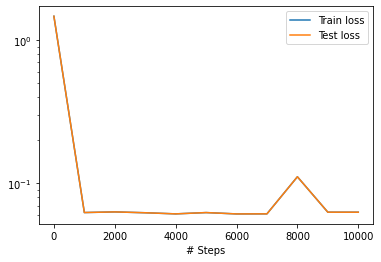

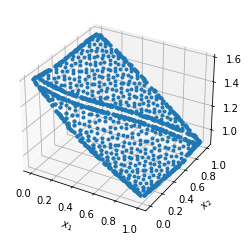

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


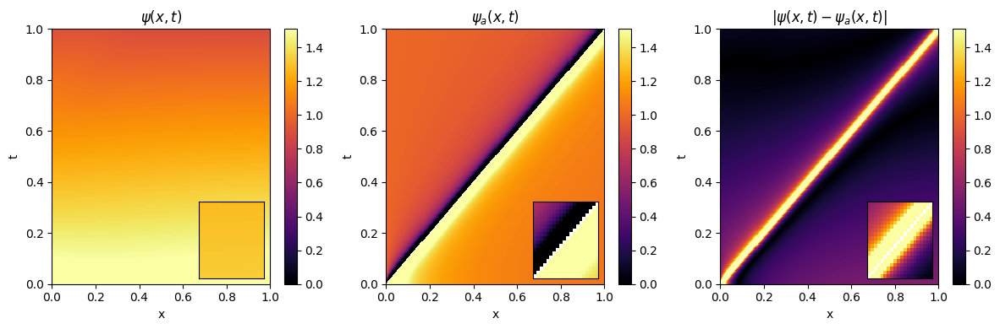

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


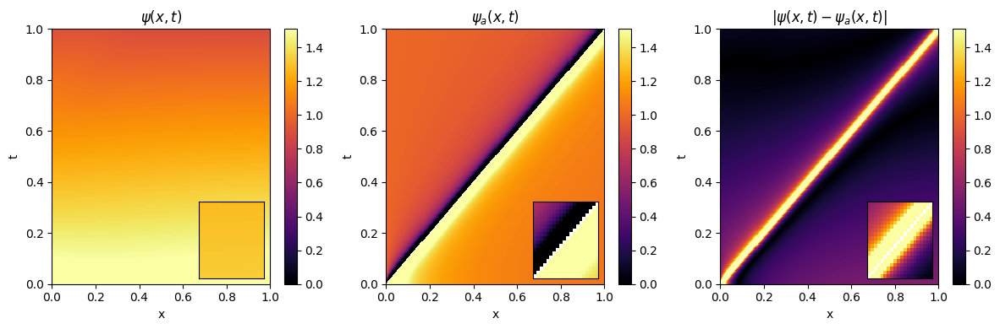

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


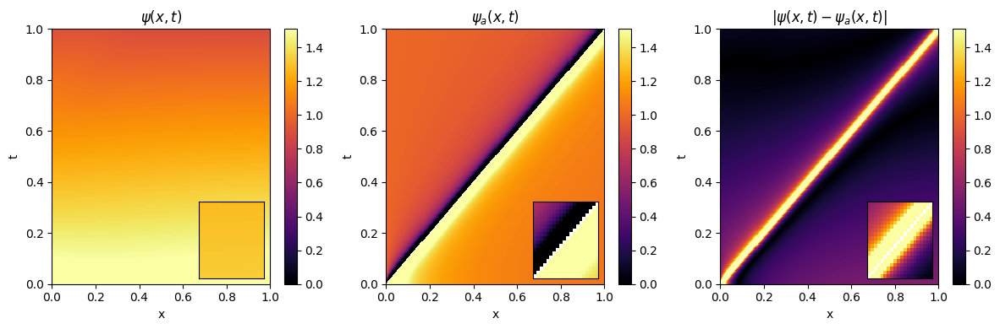

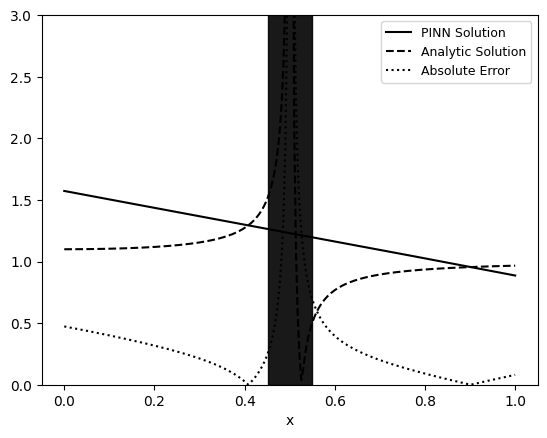

Compiling model...
Building feed-forward neural network...
'build' took 0.042490 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.458665 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.50e-03, 2.88e+00, 2.02e-01]    [1.50e-03, 2.88e+00, 2.02e-01]    []  
1000      [2.66e-04, 2.99e-01, 1.13e-02]    [2.66e-04, 2.99e-01, 1.13e-02]    []  
2000      [4.56e-04, 2.88e-01, 1.56e-02]    [4.56e-04, 2.88e-01, 1.56e-02]    []  
3000      [4.38e-04, 2.86e-01, 1.63e-02]    [4.38e-04, 2.86e-01, 1.63e-02]    []  
4000      [4.54e-04, 2.85e-01, 1.68e-02]    [4.54e-04, 2.85e-01, 1.68e-02]    []  
5000      [6.19e-04, 2.84e-01, 1.71e-02]    [6.19e-04, 2.84e-01, 1.71e-02]    []  
6000      [6.07e-04, 2.83e-01, 1.76e-02]    [6.07e-04, 2.83e-01, 1.76e-02]    []  
7000      [3.54e-04, 2.82e-01, 1.81e-02]    [3.54e-04, 2.82e-01, 1.81e-02]    []  
8000      [8.67e-04, 2.83e-01, 1.77e-02]    [8.67e-04, 2.83e-01, 1.77e-02]    []  
9000      [4.64e-04, 2.81e-01, 1.82e-02]    [4.64e-04, 2.81e-01, 1.82e-02]    []  
10000   

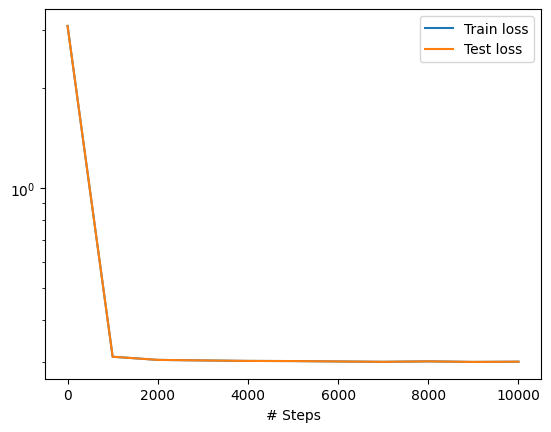

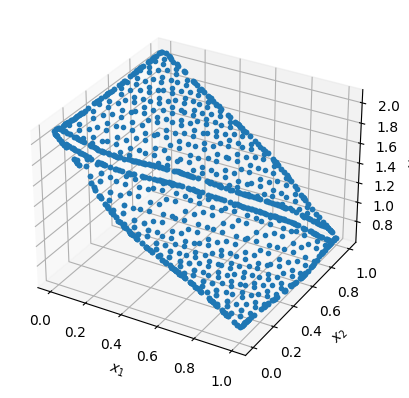

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


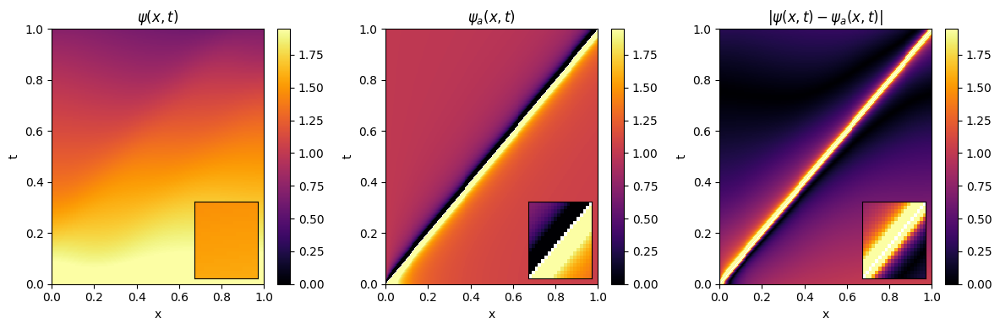

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


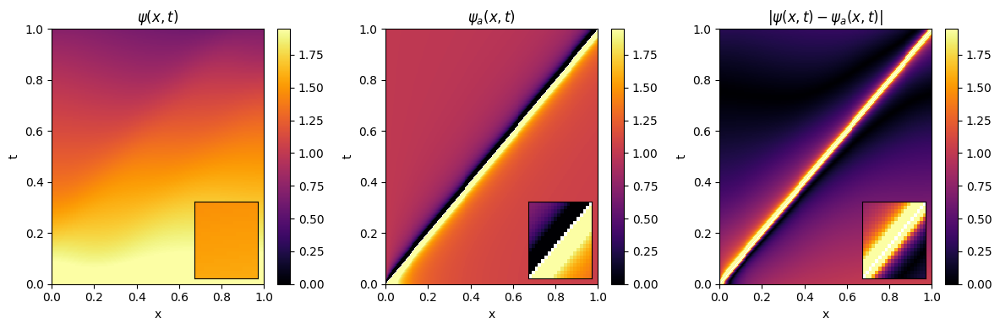

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


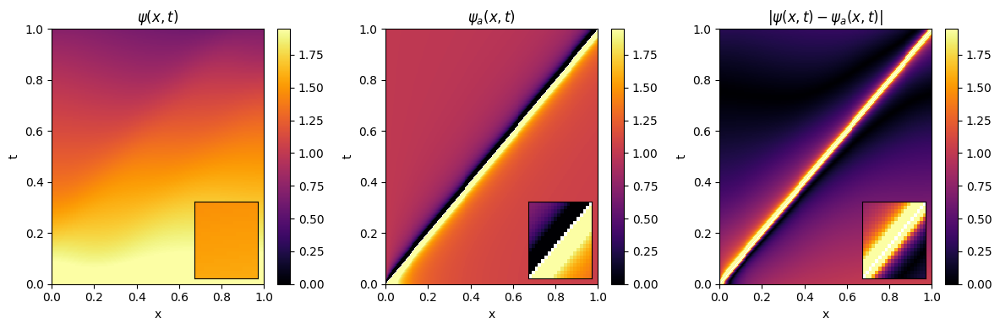

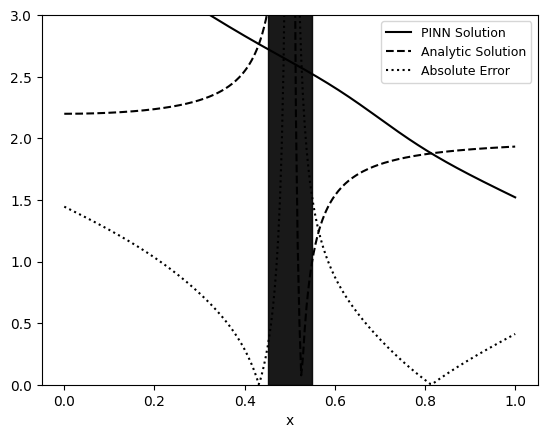

Compiling model...
Building feed-forward neural network...
'build' took 0.041649 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.470146 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.53e-02, 2.57e+00, 1.57e-02]    [4.53e-02, 2.57e+00, 1.57e-02]    []  
1000      [7.53e-04, 1.06e+00, 2.34e-02]    [7.53e-04, 1.06e+00, 2.34e-02]    []  
2000      [6.70e-04, 1.04e+00, 2.79e-02]    [6.70e-04, 1.04e+00, 2.79e-02]    []  
3000      [9.07e-04, 1.04e+00, 2.87e-02]    [9.07e-04, 1.04e+00, 2.87e-02]    []  
4000      [1.20e-03, 1.04e+00, 2.89e-02]    [1.20e-03, 1.04e+00, 2.89e-02]    []  
5000      [9.43e-04, 1.04e+00, 3.15e-02]    [9.43e-04, 1.04e+00, 3.15e-02]    []  
6000      [3.10e-03, 1.04e+00, 3.01e-02]    [3.10e-03, 1.04e+00, 3.01e-02]    []  
7000      [8.85e-04, 1.04e+00, 3.08e-02]    [8.85e-04, 1.04e+00, 3.08e-02]    []  
8000      [6.98e-04, 1.04e+00, 3.03e-02]    [6.98e-04, 1.04e+00, 3.03e-02]    []  
9000      [4.03e-03, 1.04e+00, 3.22e-02]    [4.03e-03, 1.04e+00, 3.22e-02]    []  
10000   

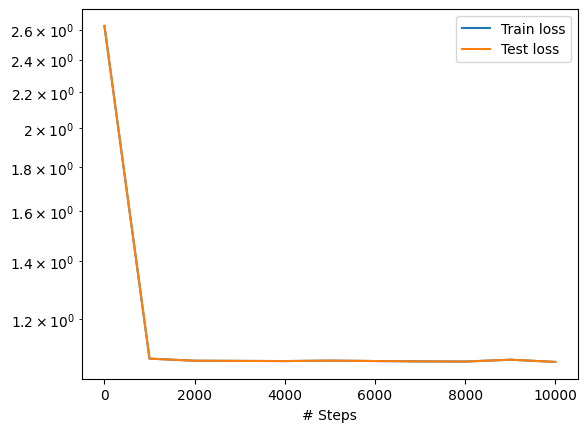

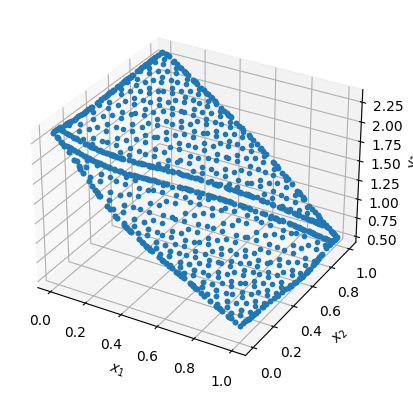

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


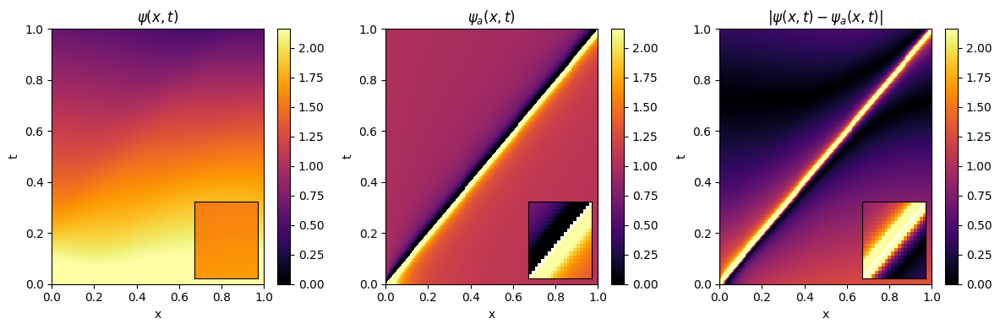

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


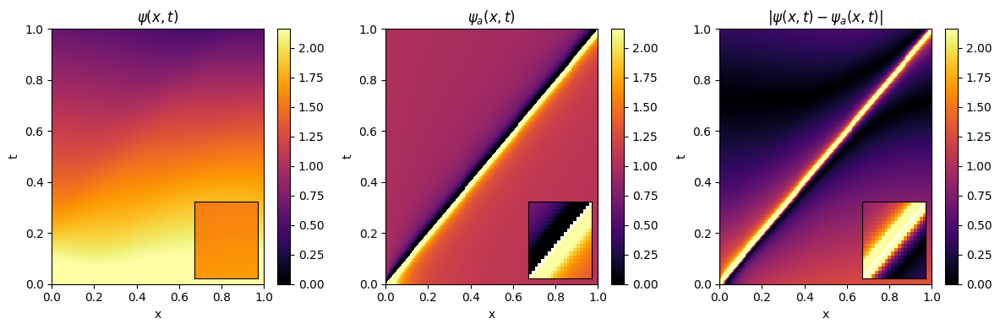

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


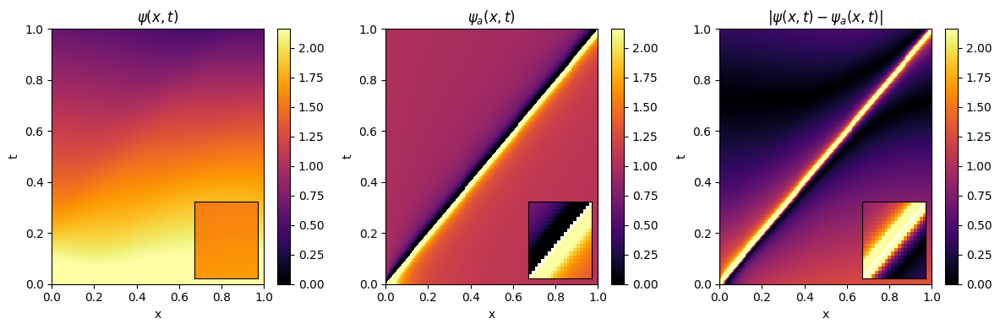

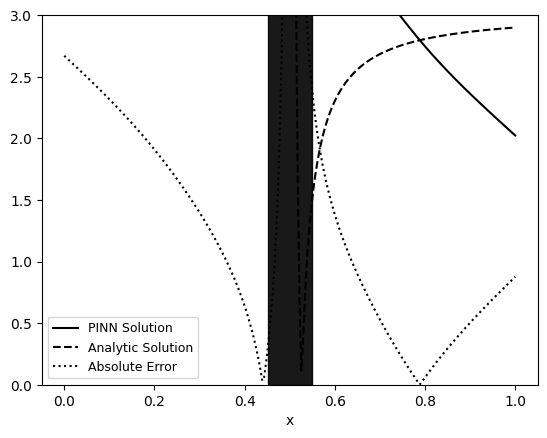

Average Behavior


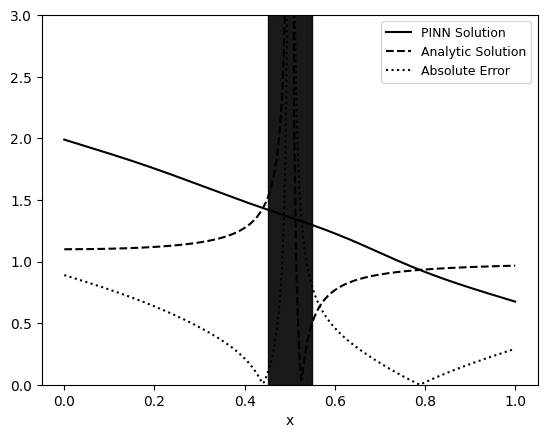

In [9]:

for i in range(sample_size):
    model_10_1 = generate_evolution_model(throat, 500, 500, 10, 1, lr, iterations);
    analytic_v_10_1 += plot_evolution_model(throat, model_10_1)[0];
    v_10_1 += plot_evolution_model(throat, model_10_1)[1];
    diff_10_1 += plot_evolution_model(throat, model_10_1)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_10_1, v_10_1, diff_10_1)
    
    
print("Average Behavior")
analytic_v_10_1 = analytic_v_10_1/sample_size
v_10_1 = v_10_1/sample_size 
diff_10_1 = diff_10_1/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_10_1, v_10_1, diff_10_1)


### Width = 20, Depth = 1

Compiling model...
Building feed-forward neural network...
'build' took 0.051659 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.522643 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.64e-03, 2.38e+00, 2.67e-01]    [1.64e-03, 2.38e+00, 2.67e-01]    []  
1000      [3.48e-04, 3.05e-01, 8.56e-03]    [3.48e-04, 3.05e-01, 8.56e-03]    []  
2000      [3.17e-04, 2.98e-01, 1.11e-02]    [3.17e-04, 2.98e-01, 1.11e-02]    []  
3000      [2.68e-04, 2.97e-01, 1.17e-02]    [2.68e-04, 2.97e-01, 1.17e-02]    []  
4000      [2.61e-04, 2.97e-01, 1.18e-02]    [2.61e-04, 2.97e-01, 1.18e-02]    []  
5000      [3.27e-04, 2.97e-01, 1.22e-02]    [3.27e-04, 2.97e-01, 1.22e-02]    []  
6000      [4.08e-04, 2.97e-01, 1.22e-02]    [4.08e-04, 2.97e-01, 1.22e-02]    []  
7000      [2.84e-04, 2.97e-01, 1.20e-02]    [2.84e-04, 2.97e-01, 1.20e-02]    []  
8000      [2.50e-04, 2.97e-01, 1.20e-02]    [2.50e-04, 2.97e-01, 1.20e-02]    []  
9000      [6.50e-04, 2.96e-01, 1.33e-02]    [6.50e-04, 2.96e-01, 1.33e-02]    []  
10000   

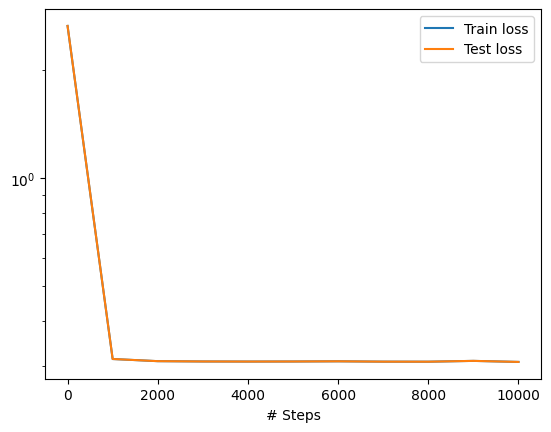

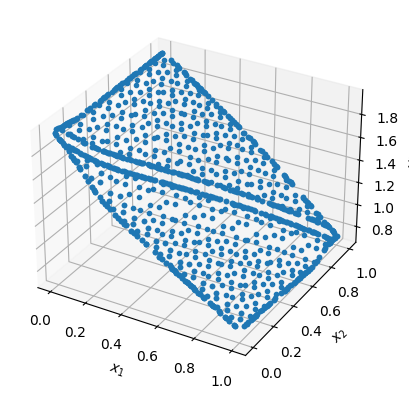

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


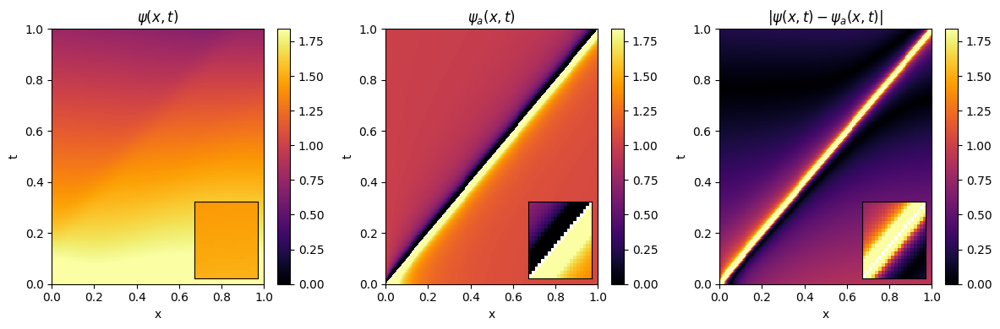

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


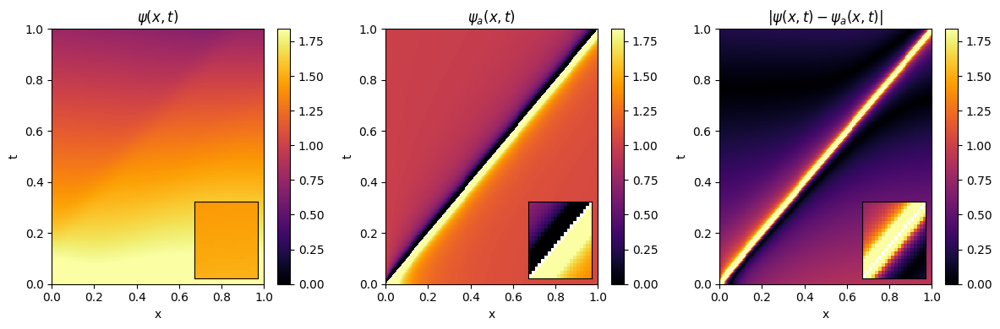

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


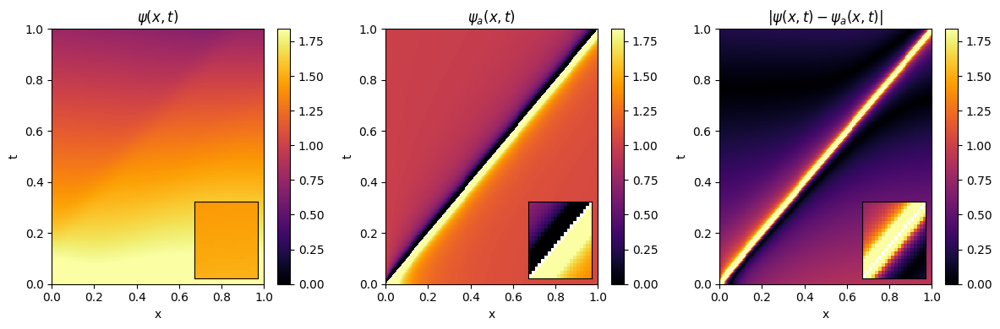

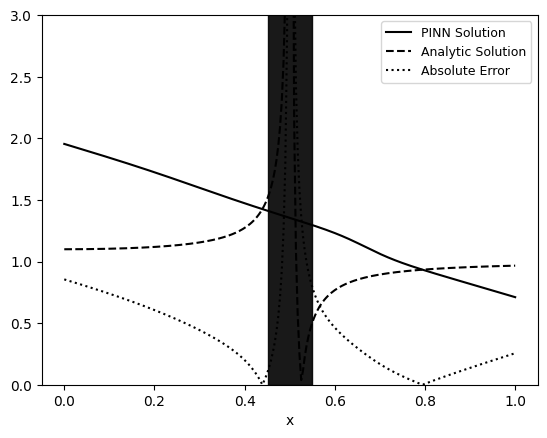

Compiling model...
Building feed-forward neural network...
'build' took 0.040321 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.516908 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.32e-04, 4.63e+00, 1.05e-01]    [4.32e-04, 4.63e+00, 1.05e-01]    []  
1000      [1.35e-03, 1.35e+00, 4.79e-02]    [1.35e-03, 1.35e+00, 4.79e-02]    []  
2000      [2.66e-03, 1.35e+00, 4.51e-02]    [2.66e-03, 1.35e+00, 4.51e-02]    []  
3000      [2.54e-03, 1.35e+00, 4.89e-02]    [2.54e-03, 1.35e+00, 4.89e-02]    []  
4000      [1.19e-03, 1.34e+00, 7.67e-02]    [1.19e-03, 1.34e+00, 7.67e-02]    []  
5000      [1.44e-03, 1.34e+00, 5.34e-02]    [1.44e-03, 1.34e+00, 5.34e-02]    []  
6000      [1.32e-03, 1.34e+00, 5.26e-02]    [1.32e-03, 1.34e+00, 5.26e-02]    []  
7000      [1.15e-03, 1.34e+00, 5.12e-02]    [1.15e-03, 1.34e+00, 5.12e-02]    []  
8000      [1.45e-03, 1.34e+00, 5.26e-02]    [1.45e-03, 1.34e+00, 5.26e-02]    []  
9000      [1.51e-03, 1.34e+00, 5.30e-02]    [1.51e-03, 1.34e+00, 5.30e-02]    []  
10000   

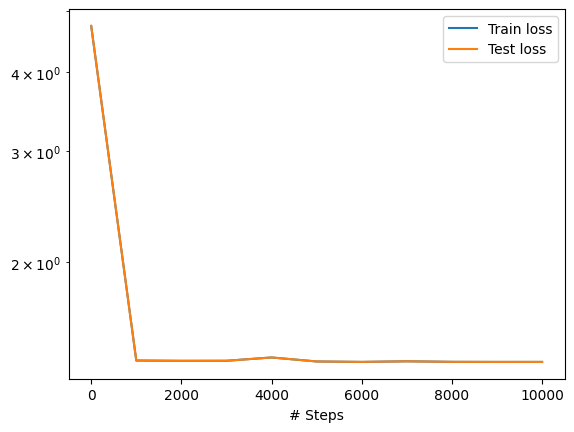

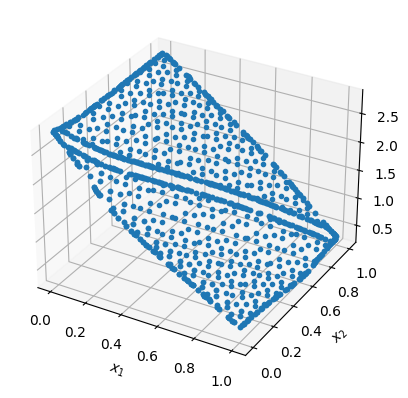

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


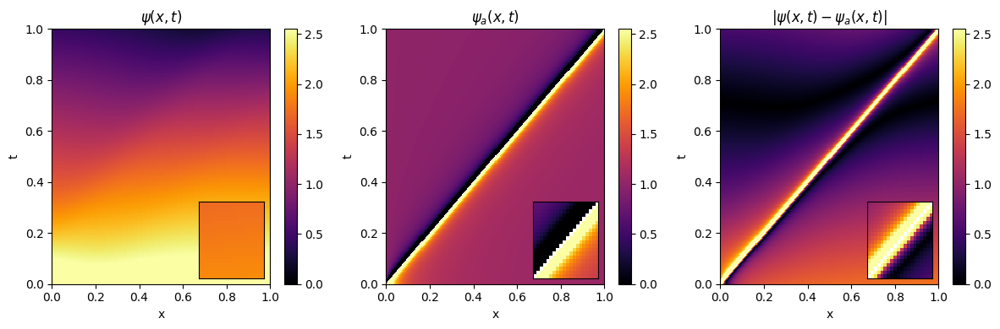

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


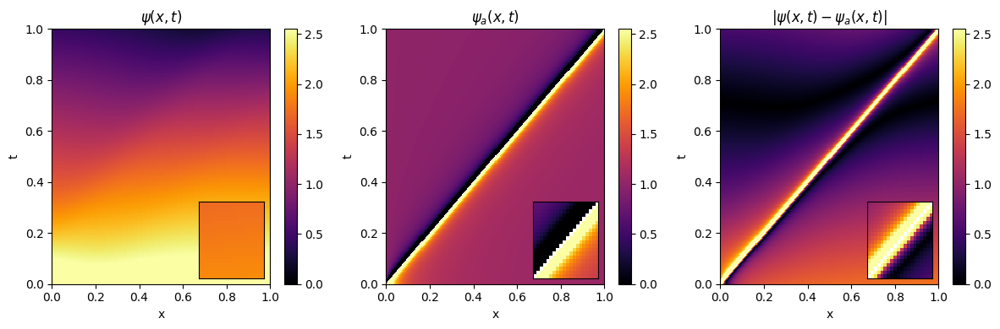

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


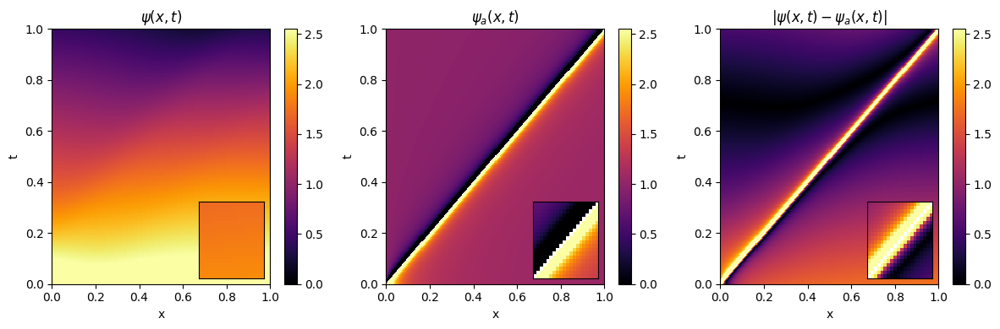

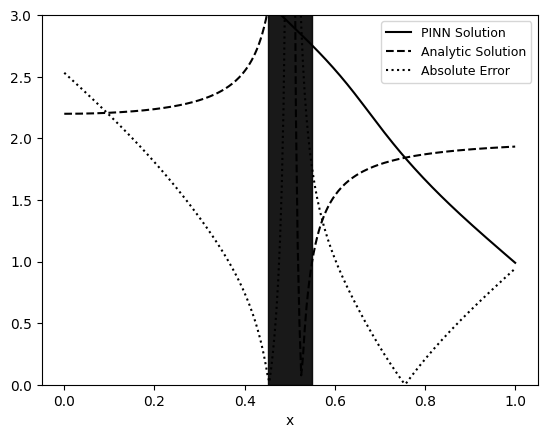

Compiling model...
Building feed-forward neural network...
'build' took 0.039937 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.518346 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.73e-04, 1.56e+00, 6.97e-02]    [2.73e-04, 1.56e+00, 6.97e-02]    []  
1000      [2.23e-04, 2.80e-01, 6.68e-03]    [2.23e-04, 2.80e-01, 6.68e-03]    []  
2000      [2.17e-04, 2.75e-01, 8.70e-03]    [2.17e-04, 2.75e-01, 8.70e-03]    []  
3000      [7.74e-04, 2.75e-01, 1.12e-02]    [7.74e-04, 2.75e-01, 1.12e-02]    []  
4000      [2.33e-04, 2.74e-01, 9.35e-03]    [2.33e-04, 2.74e-01, 9.35e-03]    []  
5000      [2.51e-04, 2.77e-01, 7.96e-03]    [2.51e-04, 2.77e-01, 7.96e-03]    []  
6000      [7.51e-04, 2.76e-01, 8.77e-03]    [7.51e-04, 2.76e-01, 8.77e-03]    []  
7000      [2.92e-04, 2.79e-01, 1.08e-02]    [2.92e-04, 2.79e-01, 1.08e-02]    []  
8000      [2.41e-04, 2.74e-01, 9.07e-03]    [2.41e-04, 2.74e-01, 9.07e-03]    []  
9000      [1.84e-04, 2.75e-01, 9.00e-03]    [1.84e-04, 2.75e-01, 9.00e-03]    []  
10000   

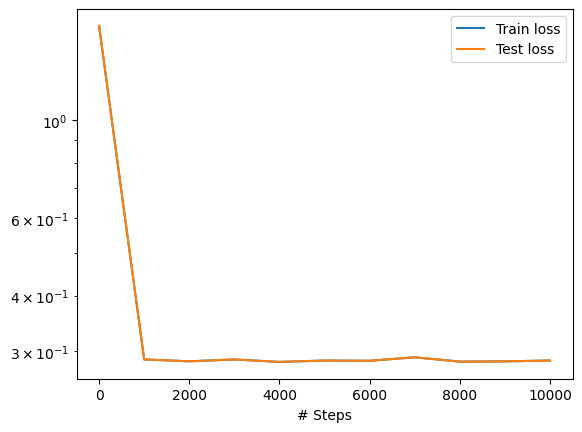

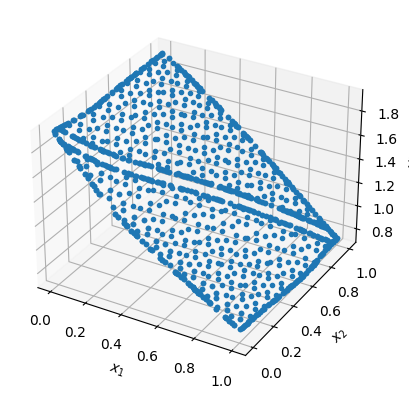

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


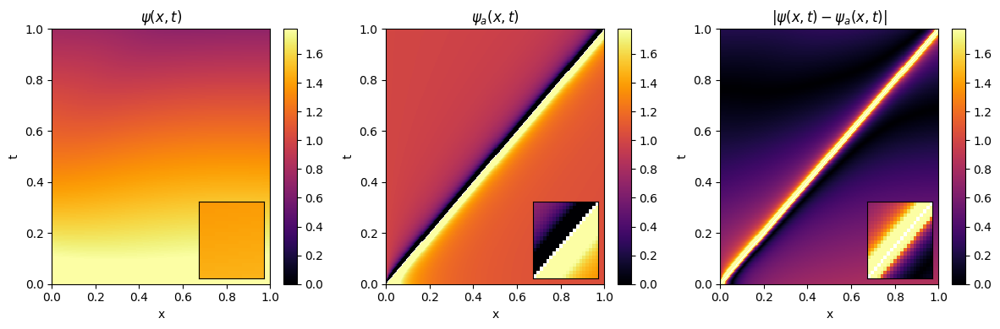

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


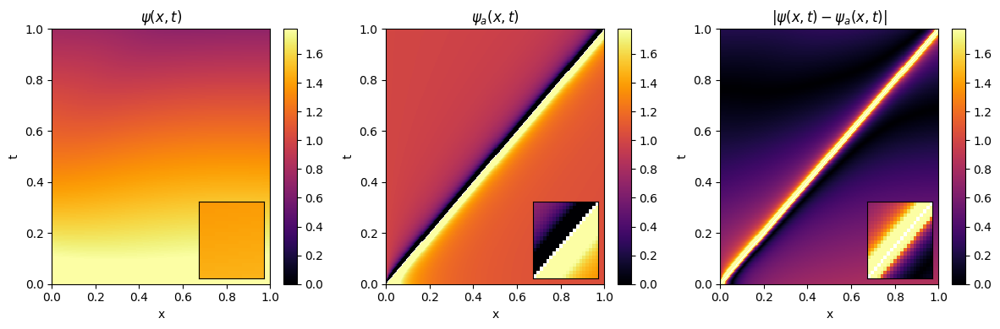

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


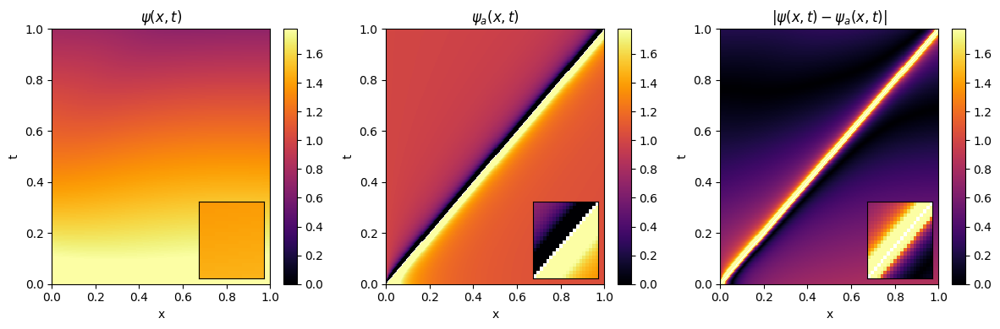

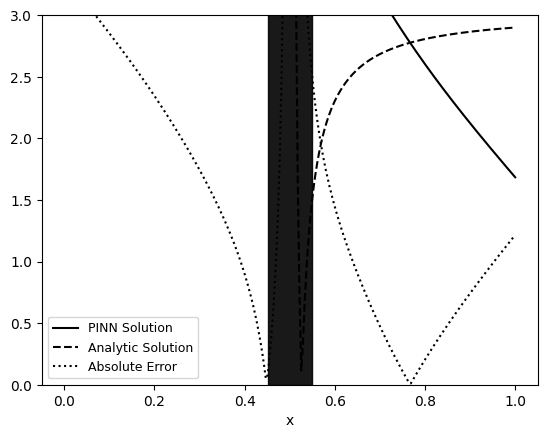

Average Behavior


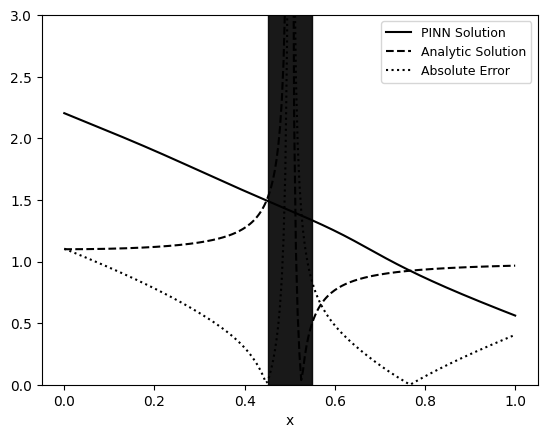

In [10]:

for i in range(sample_size):
    model_20_1 = generate_evolution_model(throat, 500, 500, 20, 1, lr, iterations);
    analytic_v_20_1 += plot_evolution_model(throat, model_20_1)[0];
    v_20_1 += plot_evolution_model(throat, model_20_1)[1];
    diff_20_1 += plot_evolution_model(throat, model_20_1)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_20_1, v_20_1, diff_20_1)
    
    
print("Average Behavior")
analytic_v_20_1 = analytic_v_20_1/sample_size
v_20_1 = v_20_1/sample_size 
diff_20_1 = diff_20_1/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_20_1, v_20_1, diff_20_1)


### Width = 30, Depth = 1

Compiling model...
Building feed-forward neural network...
'build' took 0.049816 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.742098 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.12e-03, 7.46e-01, 5.07e-01]    [2.12e-03, 7.46e-01, 5.07e-01]    []  
1000      [1.22e-05, 1.01e-02, 1.28e-04]    [1.22e-05, 1.01e-02, 1.28e-04]    []  
2000      [1.22e-05, 9.53e-03, 4.31e-04]    [1.22e-05, 9.53e-03, 4.31e-04]    []  
3000      [1.17e-05, 9.49e-03, 4.54e-04]    [1.17e-05, 9.49e-03, 4.54e-04]    []  
4000      [1.55e-05, 9.98e-03, 6.75e-04]    [1.55e-05, 9.98e-03, 6.75e-04]    []  
5000      [1.90e-05, 9.42e-03, 5.45e-04]    [1.90e-05, 9.42e-03, 5.45e-04]    []  
6000      [1.07e-05, 9.32e-03, 5.38e-04]    [1.07e-05, 9.32e-03, 5.38e-04]    []  
7000      [8.68e-06, 9.77e-03, 2.86e-04]    [8.68e-06, 9.77e-03, 2.86e-04]    []  
8000      [1.32e-05, 9.40e-03, 4.84e-04]    [1.32e-05, 9.40e-03, 4.84e-04]    []  
9000      [1.26e-05, 9.39e-03, 4.84e-04]    [1.26e-05, 9.39e-03, 4.84e-04]    []  
10000   

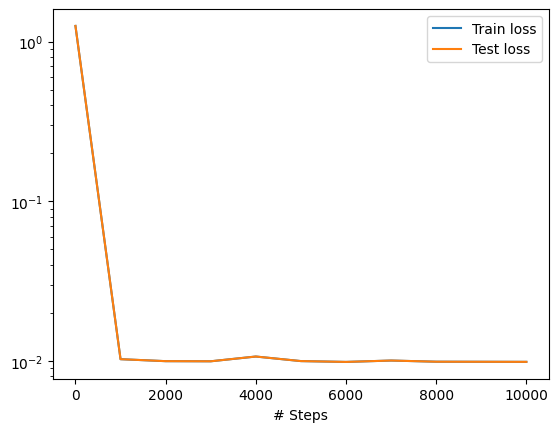

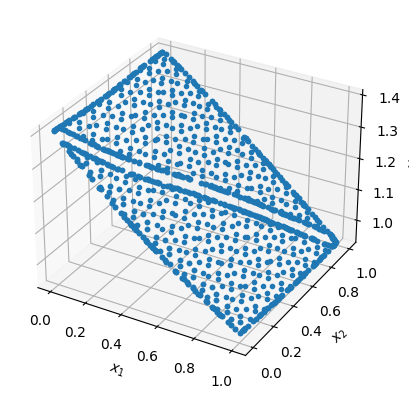

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


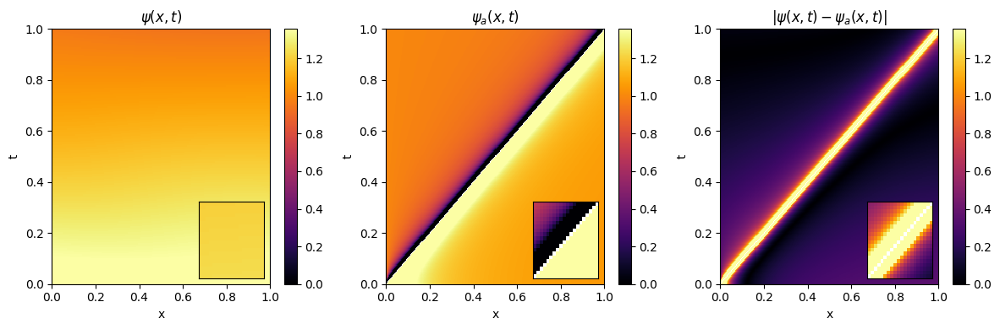

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


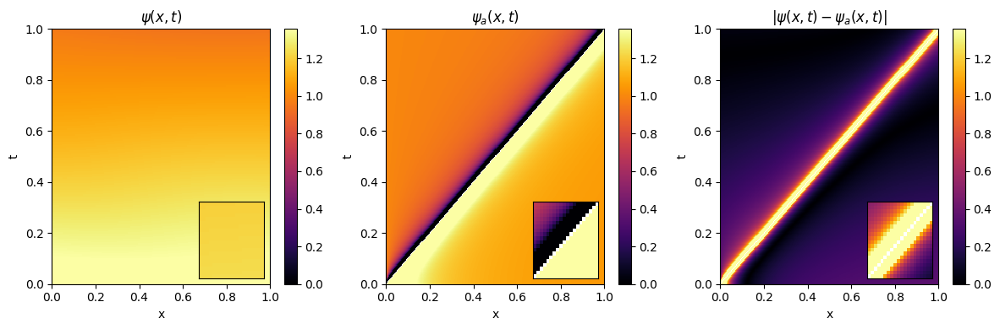

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


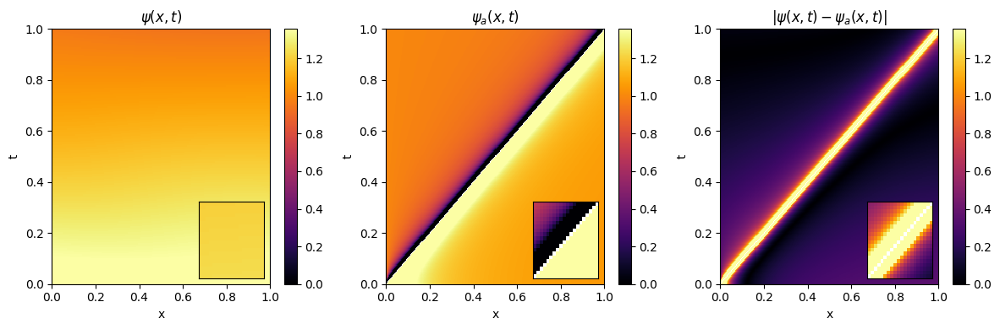

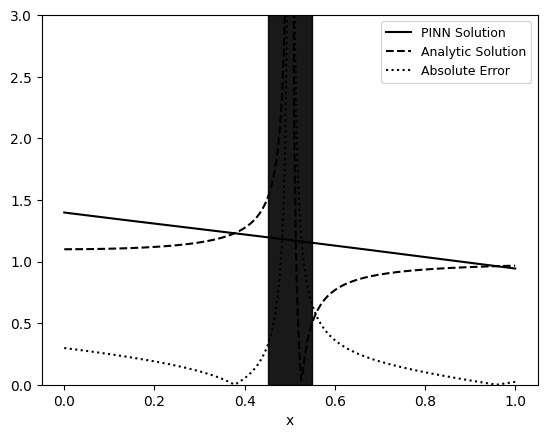

Compiling model...
Building feed-forward neural network...
'build' took 0.039934 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.563758 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.12e-03, 1.99e+00, 1.50e-01]    [2.12e-03, 1.99e+00, 1.50e-01]    []  
1000      [2.19e-04, 2.54e-01, 7.41e-03]    [2.19e-04, 2.54e-01, 7.41e-03]    []  
2000      [2.46e-04, 2.48e-01, 1.00e-02]    [2.46e-04, 2.48e-01, 1.00e-02]    []  
3000      [2.26e-04, 2.47e-01, 1.05e-02]    [2.26e-04, 2.47e-01, 1.05e-02]    []  
4000      [2.86e-04, 2.46e-01, 1.13e-02]    [2.86e-04, 2.46e-01, 1.13e-02]    []  
5000      [1.94e-04, 2.55e-01, 7.04e-03]    [1.94e-04, 2.55e-01, 7.04e-03]    []  
6000      [2.29e-04, 2.54e-01, 7.51e-03]    [2.29e-04, 2.54e-01, 7.51e-03]    []  
7000      [2.80e-04, 2.52e-01, 8.21e-03]    [2.80e-04, 2.52e-01, 8.21e-03]    []  
8000      [1.49e-04, 2.51e-01, 9.01e-03]    [1.49e-04, 2.51e-01, 9.01e-03]    []  
9000      [3.69e-04, 2.50e-01, 9.42e-03]    [3.69e-04, 2.50e-01, 9.42e-03]    []  
10000   

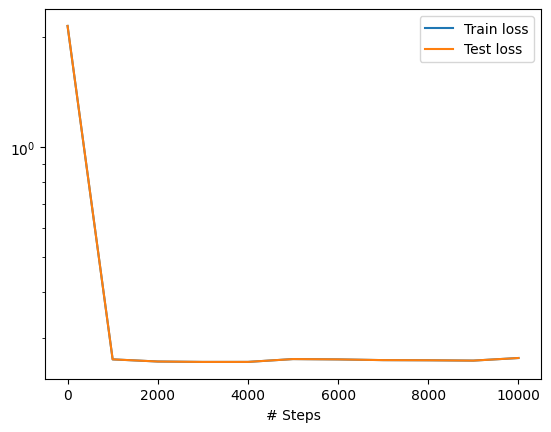

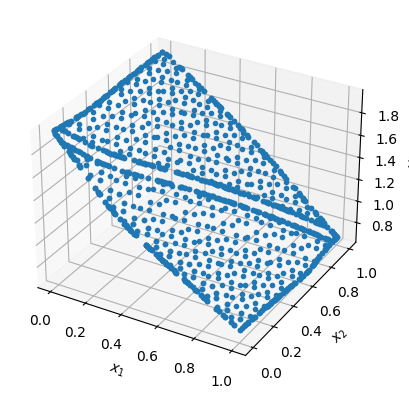

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


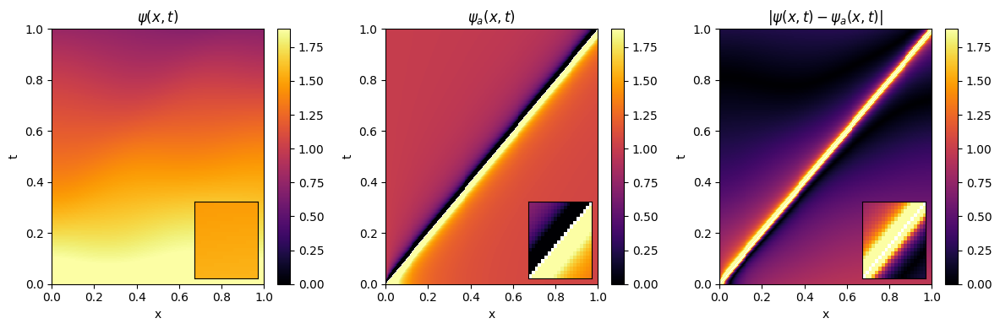

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


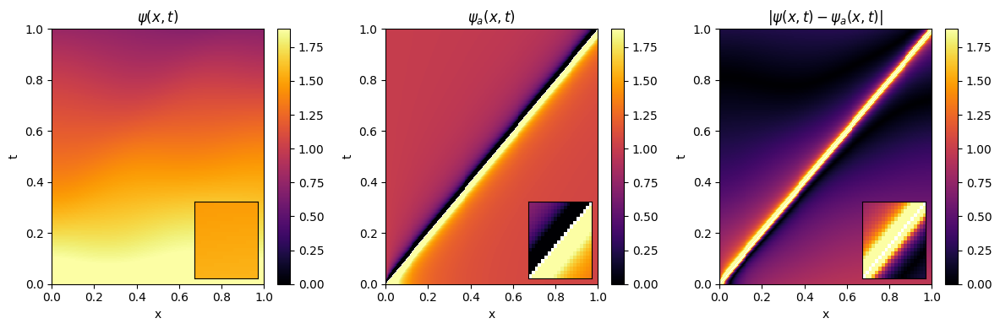

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


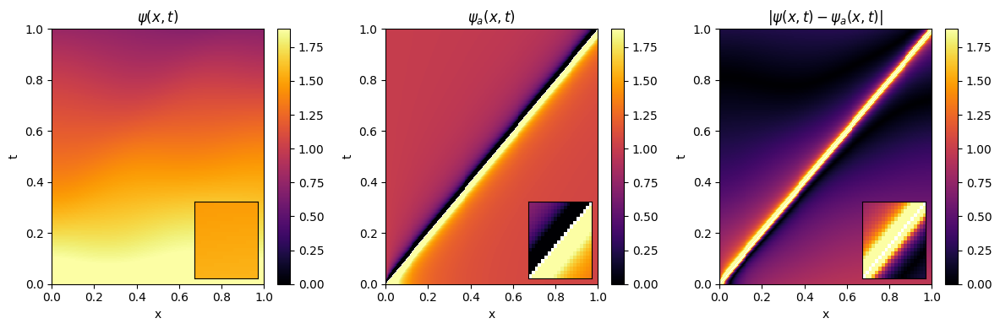

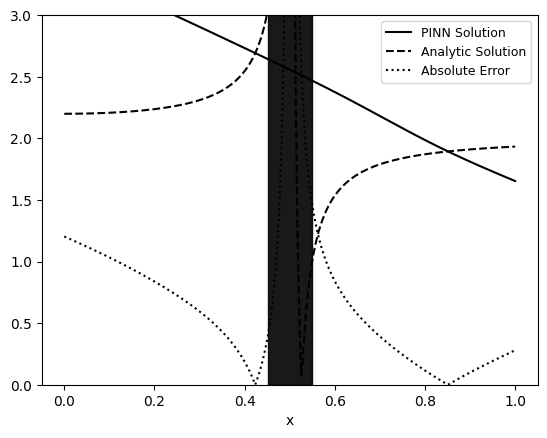

Compiling model...
Building feed-forward neural network...
'build' took 0.038036 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.593629 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.34e-03, 1.87e+00, 1.13e-03]    [1.34e-03, 1.87e+00, 1.13e-03]    []  
1000      [8.66e-05, 1.20e-01, 3.78e-03]    [8.66e-05, 1.20e-01, 3.78e-03]    []  
2000      [1.47e-04, 1.17e-01, 4.94e-03]    [1.47e-04, 1.17e-01, 4.94e-03]    []  
3000      [6.18e-05, 1.16e-01, 5.92e-03]    [6.18e-05, 1.16e-01, 5.92e-03]    []  
4000      [1.12e-04, 1.16e-01, 5.78e-03]    [1.12e-04, 1.16e-01, 5.78e-03]    []  
5000      [1.38e-04, 1.17e-01, 5.03e-03]    [1.38e-04, 1.17e-01, 5.03e-03]    []  
6000      [1.13e-04, 1.20e-01, 3.55e-03]    [1.13e-04, 1.20e-01, 3.55e-03]    []  
7000      [1.46e-04, 1.19e-01, 3.89e-03]    [1.46e-04, 1.19e-01, 3.89e-03]    []  
8000      [3.92e-03, 1.28e-01, 5.57e-03]    [3.92e-03, 1.28e-01, 5.57e-03]    []  
9000      [1.28e-04, 1.17e-01, 4.73e-03]    [1.28e-04, 1.17e-01, 4.73e-03]    []  
10000   

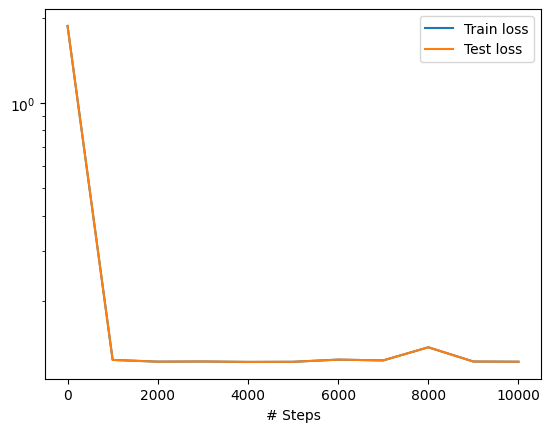

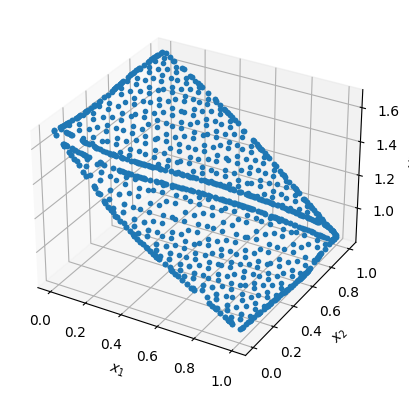

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


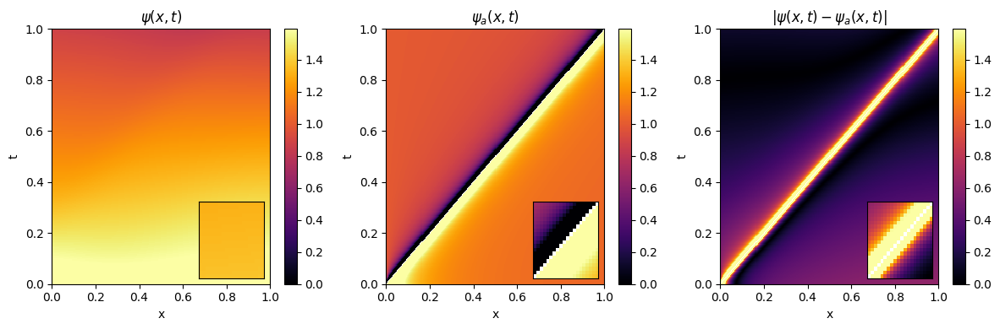

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


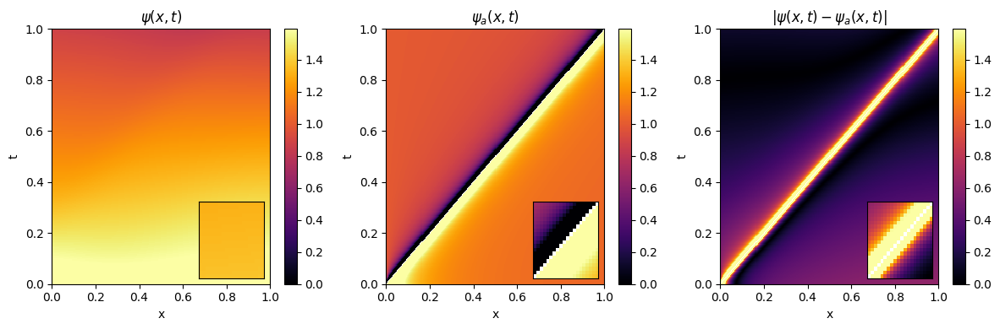

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


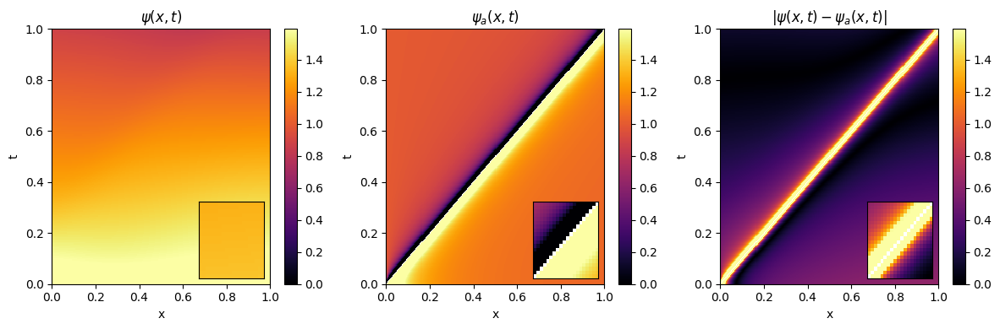

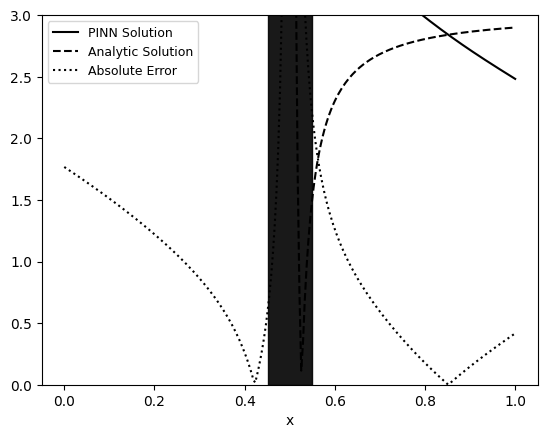

Average Behavior


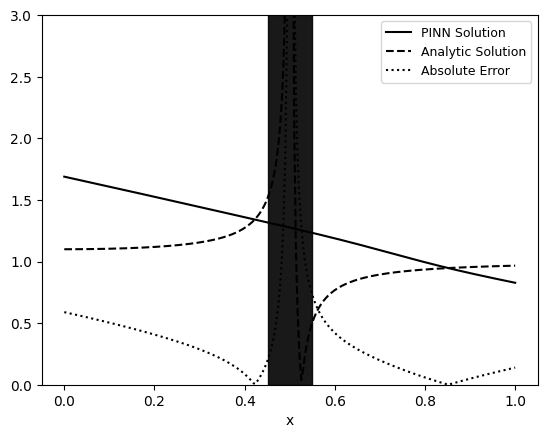

In [11]:

for i in range(sample_size):
    model_30_1 = generate_evolution_model(throat, 500, 500, 30, 1, lr, iterations);
    analytic_v_30_1 += plot_evolution_model(throat, model_30_1)[0];
    v_30_1 += plot_evolution_model(throat, model_30_1)[1];
    diff_30_1 += plot_evolution_model(throat, model_30_1)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_30_1, v_30_1, diff_30_1)
    
    
print("Average Behavior")
analytic_v_30_1 = analytic_v_30_1/sample_size
v_30_1 = v_30_1/sample_size 
diff_30_1 = diff_30_1/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_30_1, v_30_1, diff_30_1)



### Width = 10, Depth = 2

Compiling model...
Building feed-forward neural network...
'build' took 0.074770 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.954940 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.03e-03, 1.86e+00, 5.23e-02]    [4.03e-03, 1.86e+00, 5.23e-02]    []  
1000      [2.15e-03, 1.40e-01, 7.98e-03]    [2.15e-03, 1.40e-01, 7.98e-03]    []  
2000      [1.76e-03, 1.27e-01, 7.38e-03]    [1.76e-03, 1.27e-01, 7.38e-03]    []  
3000      [2.14e-07, 3.01e-01, 1.01e-07]    [2.14e-07, 3.01e-01, 1.01e-07]    []  
4000      [1.85e-03, 1.29e-01, 4.43e-03]    [1.85e-03, 1.29e-01, 4.43e-03]    []  
5000      [1.12e-03, 1.31e-01, 6.32e-03]    [1.12e-03, 1.31e-01, 6.32e-03]    []  
6000      [2.65e-03, 1.25e-01, 7.87e-03]    [2.65e-03, 1.25e-01, 7.87e-03]    []  
7000      [3.43e-03, 1.26e-01, 7.03e-03]    [3.43e-03, 1.26e-01, 7.03e-03]    []  
8000      [6.24e-04, 1.23e-01, 7.34e-03]    [6.24e-04, 1.23e-01, 7.34e-03]    []  
9000      [6.69e-04, 1.25e-01, 6.89e-03]    [6.69e-04, 1.25e-01, 6.89e-03]    []  
10000   

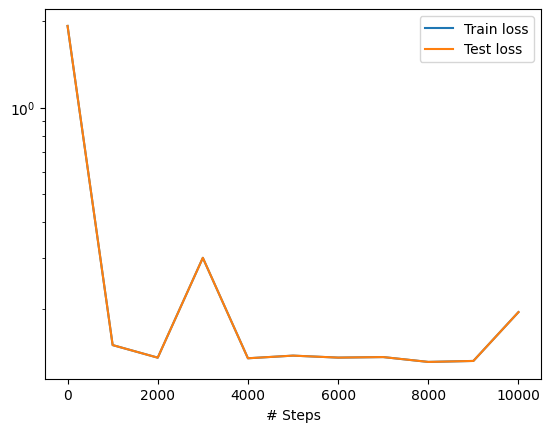

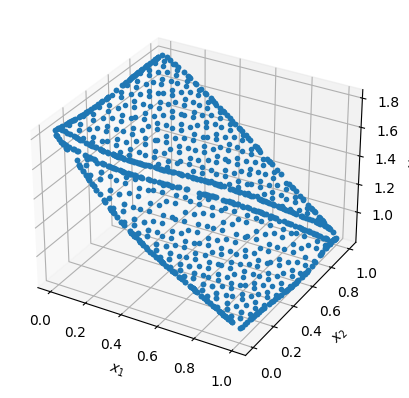

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


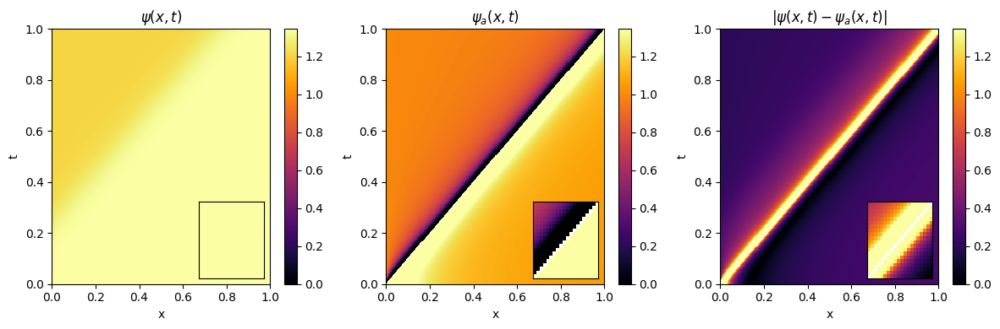

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


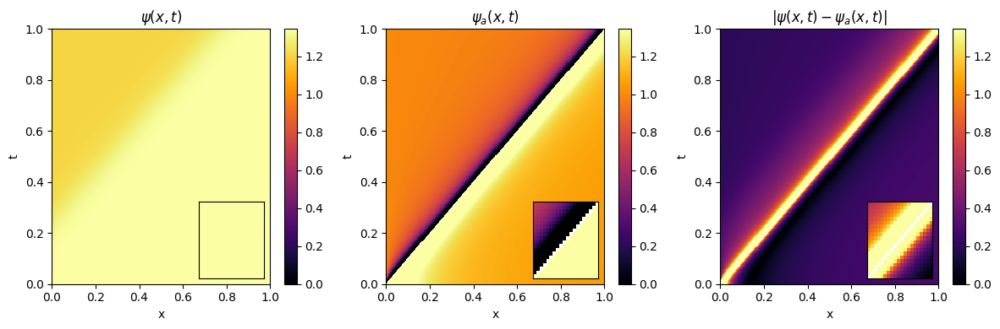

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


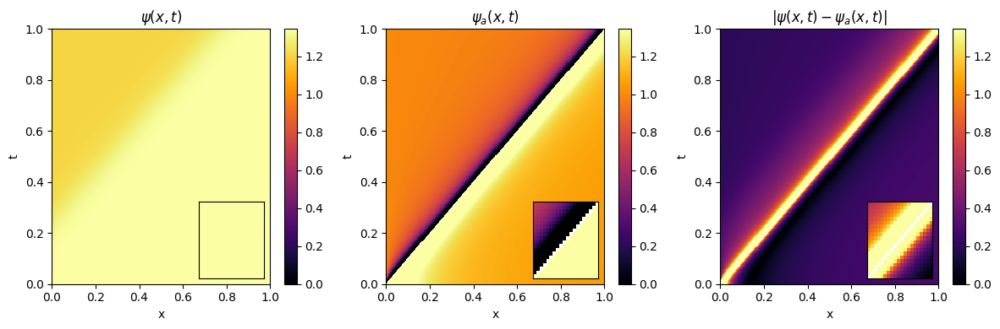

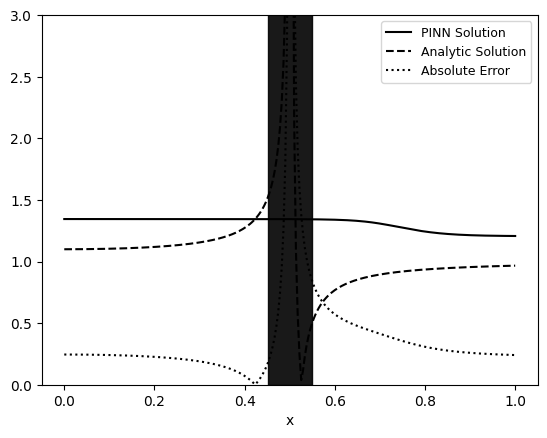

Compiling model...
Building feed-forward neural network...
'build' took 0.056329 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.785619 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [9.43e-03, 2.25e+00, 3.16e-03]    [9.43e-03, 2.25e+00, 3.16e-03]    []  
1000      [1.08e-03, 3.52e-01, 1.09e-02]    [1.08e-03, 3.52e-01, 1.09e-02]    []  
2000      [2.08e-03, 3.52e-01, 1.10e-02]    [2.08e-03, 3.52e-01, 1.10e-02]    []  
3000      [1.25e-03, 3.35e-01, 1.72e-02]    [1.25e-03, 3.35e-01, 1.72e-02]    []  
4000      [4.47e-06, 5.42e-01, 4.90e-06]    [4.47e-06, 5.42e-01, 4.90e-06]    []  
5000      [6.20e-03, 3.83e-01, 9.39e-03]    [6.20e-03, 3.83e-01, 9.39e-03]    []  
6000      [6.50e-03, 3.76e-01, 8.00e-03]    [6.50e-03, 3.76e-01, 8.00e-03]    []  
7000      [1.05e-02, 4.54e-01, 7.56e-03]    [1.05e-02, 4.54e-01, 7.56e-03]    []  
8000      [4.39e-03, 3.55e-01, 8.03e-03]    [4.39e-03, 3.55e-01, 8.03e-03]    []  
9000      [3.22e-03, 3.55e-01, 9.34e-03]    [3.22e-03, 3.55e-01, 9.34e-03]    []  
10000   

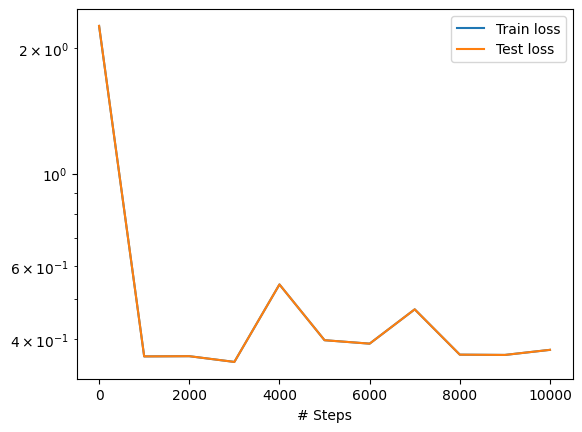

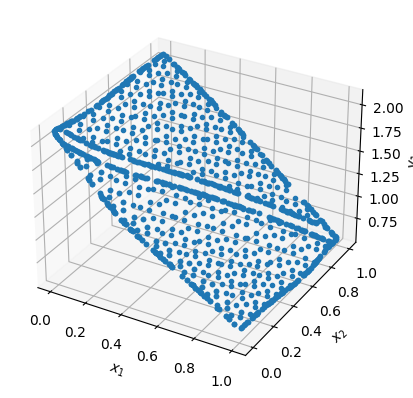

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


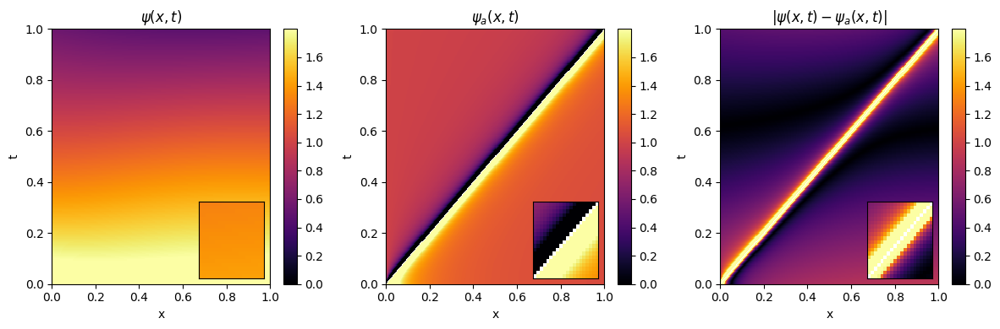

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


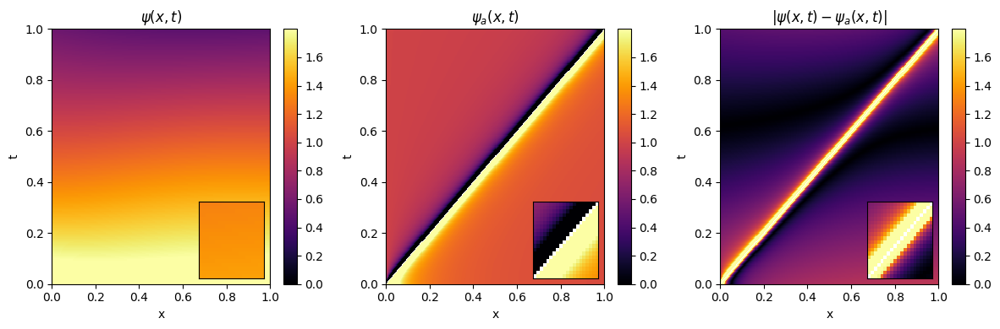

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


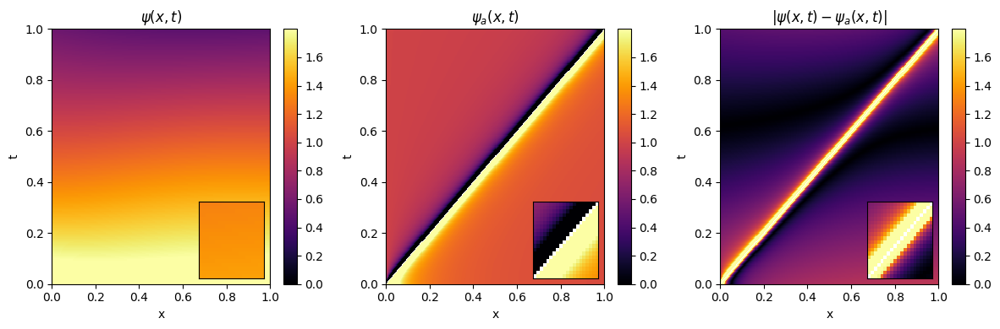

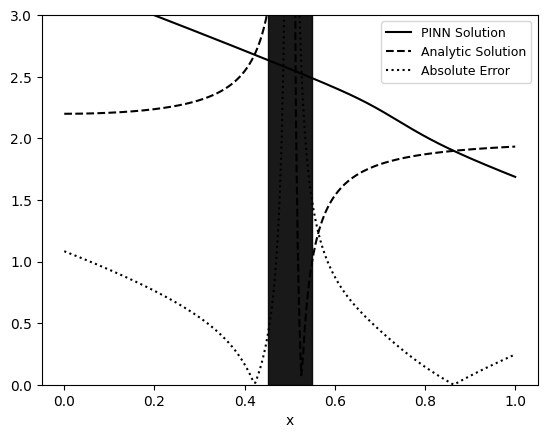

Compiling model...
Building feed-forward neural network...
'build' took 0.058330 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.800069 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.09e-02, 3.79e+00, 3.53e-01]    [2.09e-02, 3.79e+00, 3.53e-01]    []  
1000      [2.40e-03, 1.05e+00, 2.62e-02]    [2.40e-03, 1.05e+00, 2.62e-02]    []  
2000      [1.29e-03, 1.08e+00, 1.62e-02]    [1.29e-03, 1.08e+00, 1.62e-02]    []  
3000      [1.93e-03, 1.07e+00, 1.98e-02]    [1.93e-03, 1.07e+00, 1.98e-02]    []  
4000      [7.26e-03, 1.07e+00, 1.96e-02]    [7.26e-03, 1.07e+00, 1.96e-02]    []  
5000      [6.36e-04, 1.06e+00, 2.21e-02]    [6.36e-04, 1.06e+00, 2.21e-02]    []  
6000      [1.59e-07, 1.33e+00, 1.40e-07]    [1.59e-07, 1.33e+00, 1.40e-07]    []  
7000      [2.47e-11, 1.33e+00, 4.88e-12]    [2.47e-11, 1.33e+00, 4.88e-12]    []  
8000      [1.54e-11, 1.33e+00, 2.94e-11]    [1.54e-11, 1.33e+00, 2.94e-11]    []  
9000      [2.51e-03, 1.25e+00, 3.24e-02]    [2.51e-03, 1.25e+00, 3.24e-02]    []  
10000   

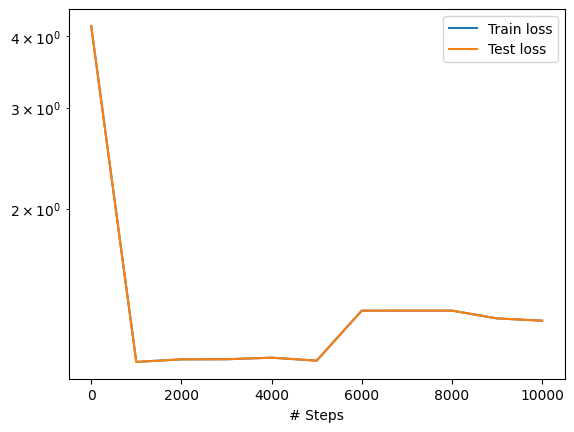

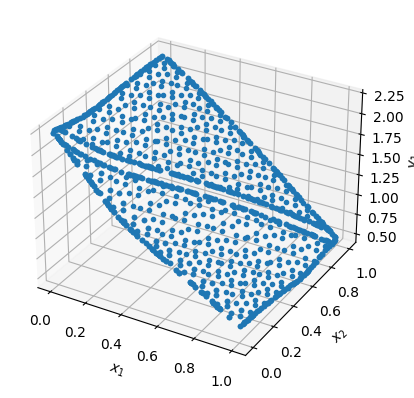

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


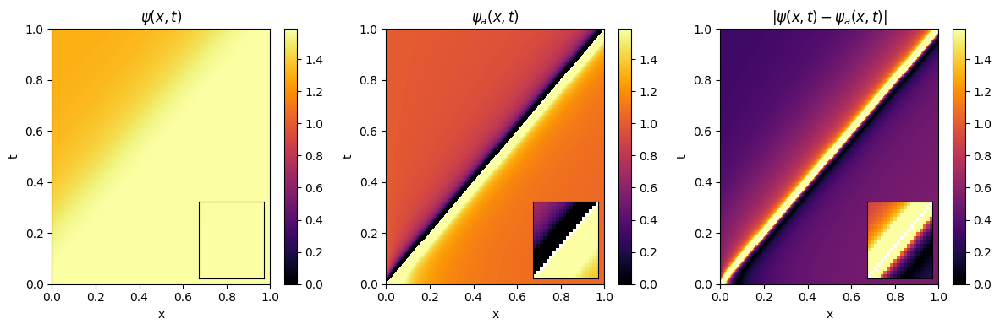

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


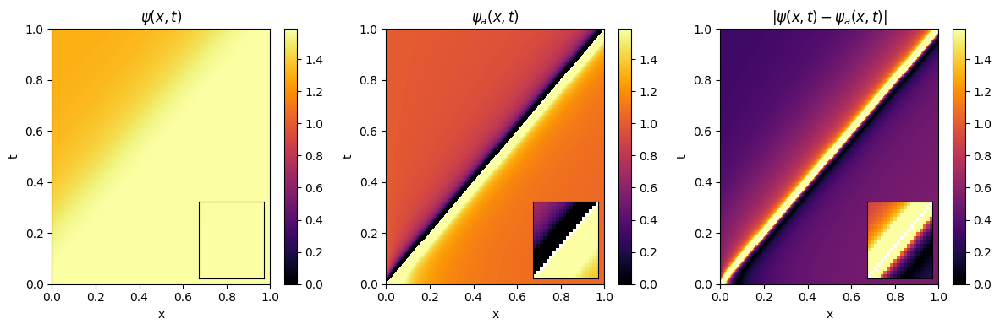

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


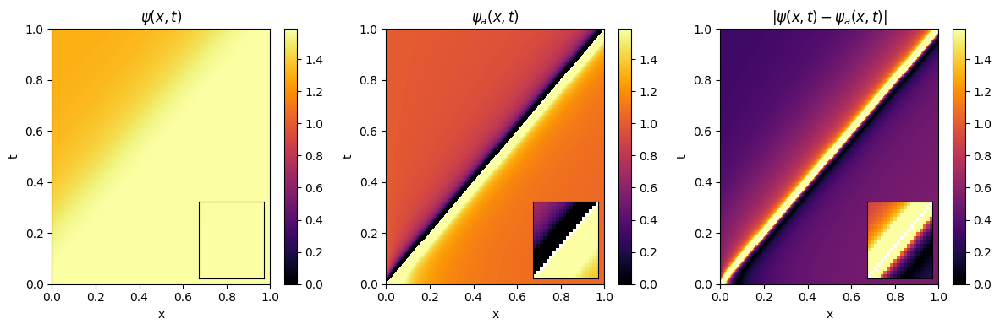

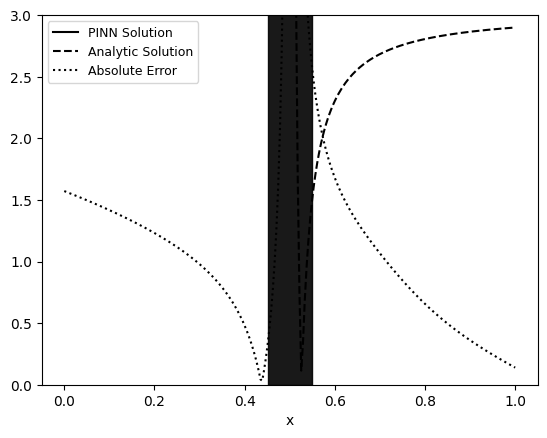

Average Behavior


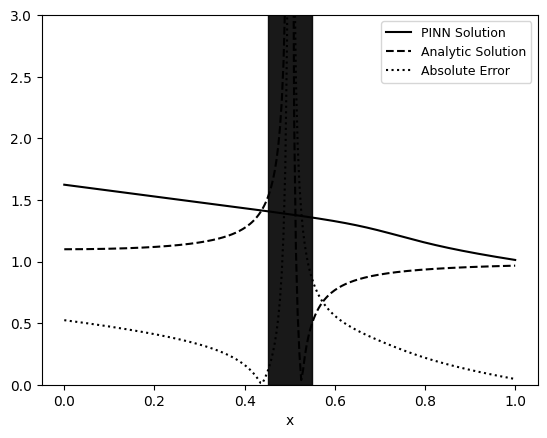

In [12]:

for i in range(sample_size):
    model_10_2 = generate_evolution_model(throat, 500, 500, 10, 2, lr, iterations);
    analytic_v_10_2 += plot_evolution_model(throat, model_10_2)[0];
    v_10_2 += plot_evolution_model(throat, model_10_2)[1];
    diff_10_2 += plot_evolution_model(throat, model_10_2)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_10_2, v_10_2, diff_10_2)
    
    
print("Average Behavior")
analytic_v_10_2 = analytic_v_10_2/sample_size
v_10_2 = v_10_2/sample_size 
diff_10_2 = diff_10_2/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_10_2, v_10_2, diff_10_2)


### Width = 10, Depth = 3

Compiling model...
Building feed-forward neural network...
'build' took 0.087462 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.014443 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.59e-02, 1.95e+00, 2.67e-01]    [1.59e-02, 1.95e+00, 2.67e-01]    []  
1000      [3.18e-04, 2.67e-01, 6.18e-03]    [3.18e-04, 2.67e-01, 6.18e-03]    []  
2000      [8.42e-04, 2.66e-01, 8.13e-03]    [8.42e-04, 2.66e-01, 8.13e-03]    []  
3000      [4.88e-04, 2.64e-01, 7.11e-03]    [4.88e-04, 2.64e-01, 7.11e-03]    []  
4000      [3.93e-09, 3.65e-01, 1.93e-10]    [3.93e-09, 3.65e-01, 1.93e-10]    []  
5000      [5.95e-03, 3.29e-01, 6.58e-03]    [5.95e-03, 3.29e-01, 6.58e-03]    []  
6000      [1.42e-10, 3.65e-01, 2.39e-11]    [1.42e-10, 3.65e-01, 2.39e-11]    []  
7000      [6.34e-10, 3.65e-01, 1.08e-10]    [6.34e-10, 3.65e-01, 1.08e-10]    []  
8000      [1.96e-13, 3.65e-01, 1.57e-14]    [1.96e-13, 3.65e-01, 1.57e-14]    []  
9000      [1.70e-13, 3.65e-01, 1.34e-14]    [1.70e-13, 3.65e-01, 1.34e-14]    []  
10000   

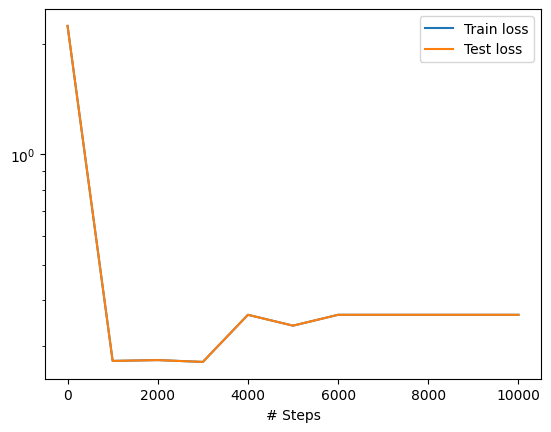

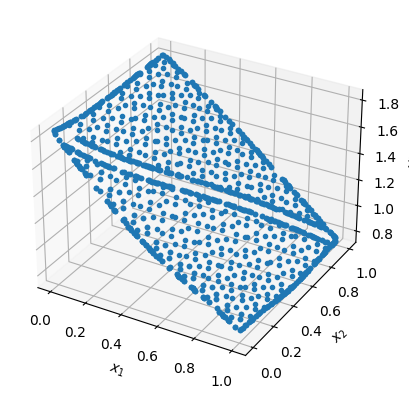

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


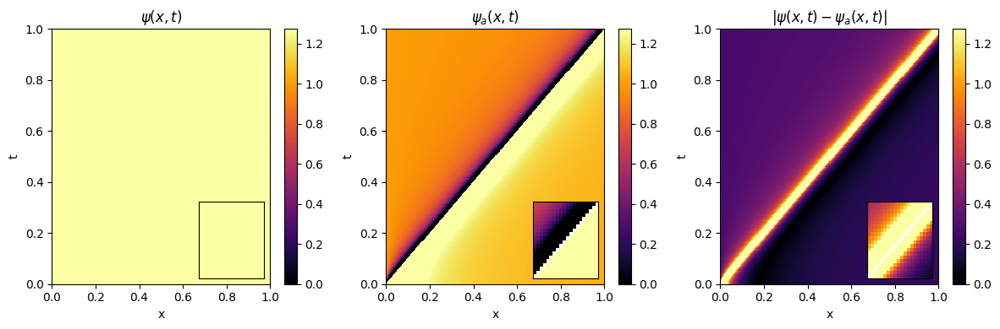

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


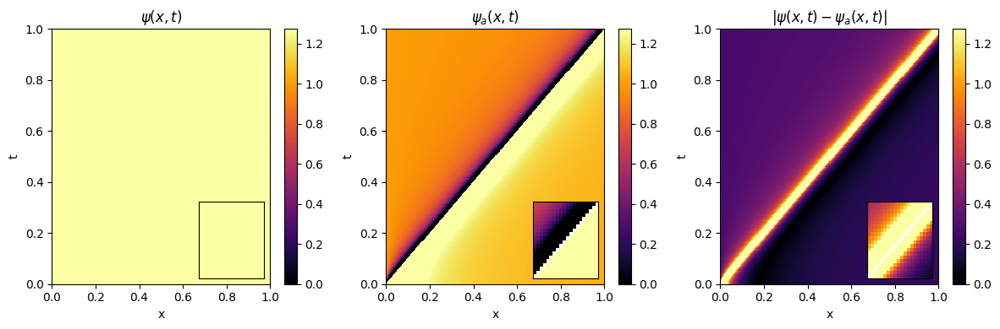

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


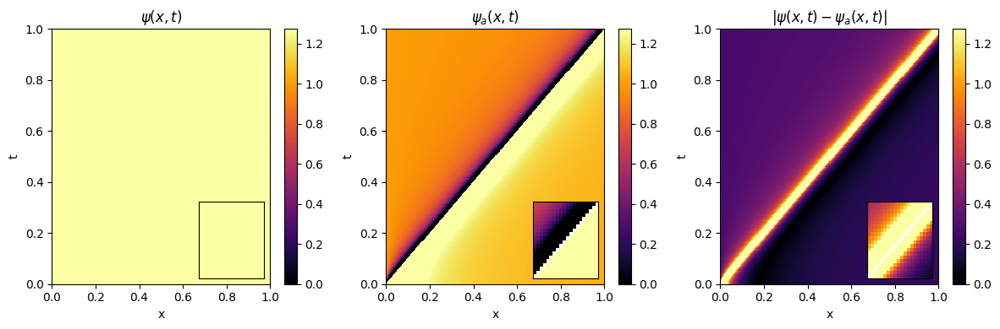

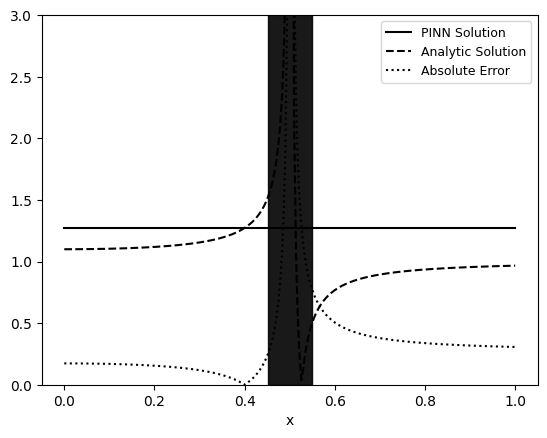

Compiling model...
Building feed-forward neural network...
'build' took 0.068100 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.259540 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [8.85e-03, 3.16e+00, 5.42e-02]    [8.85e-03, 3.16e+00, 5.42e-02]    []  
1000      [3.20e-09, 1.36e+00, 2.12e-09]    [3.20e-09, 1.36e+00, 2.12e-09]    []  
2000      [1.10e-09, 1.36e+00, 1.36e-10]    [1.10e-09, 1.36e+00, 1.36e-10]    []  
3000      [1.47e-08, 1.36e+00, 2.35e-09]    [1.47e-08, 1.36e+00, 2.35e-09]    []  
4000      [1.86e-13, 1.36e+00, 8.05e-13]    [1.86e-13, 1.36e+00, 8.05e-13]    []  
5000      [1.35e-13, 1.36e+00, 5.53e-13]    [1.35e-13, 1.36e+00, 5.53e-13]    []  
6000      [9.18e-14, 1.36e+00, 3.39e-13]    [9.18e-14, 1.36e+00, 3.39e-13]    []  
7000      [5.96e-14, 1.36e+00, 1.86e-13]    [5.96e-14, 1.36e+00, 1.86e-13]    []  
8000      [3.78e-14, 1.36e+00, 9.25e-14]    [3.78e-14, 1.36e+00, 9.25e-14]    []  
9000      [2.44e-14, 1.36e+00, 4.43e-14]    [2.44e-14, 1.36e+00, 4.43e-14]    []  
10000   

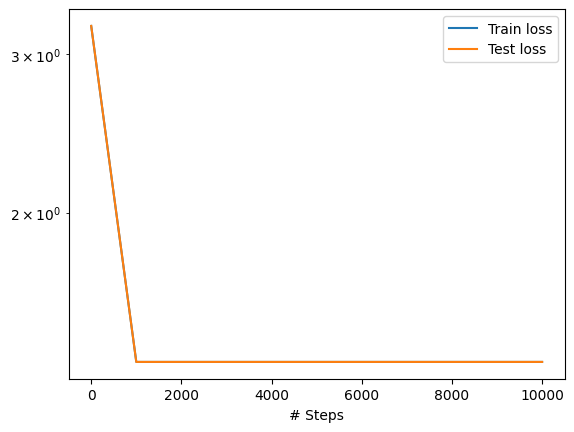

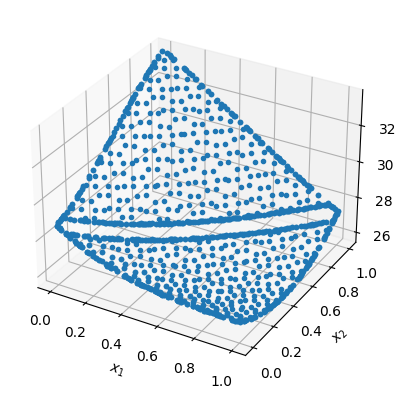

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


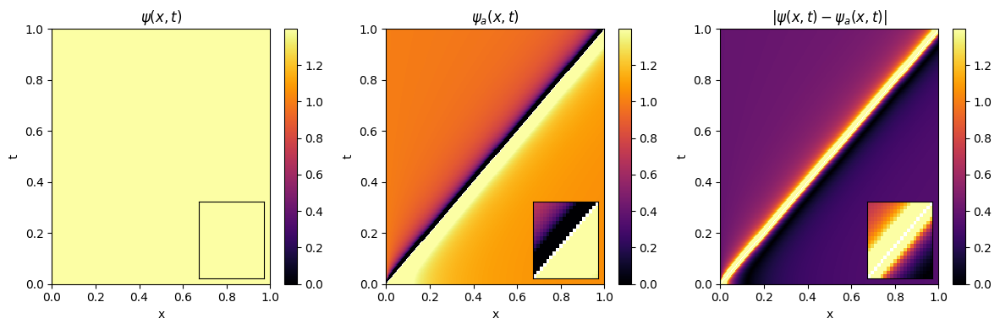

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


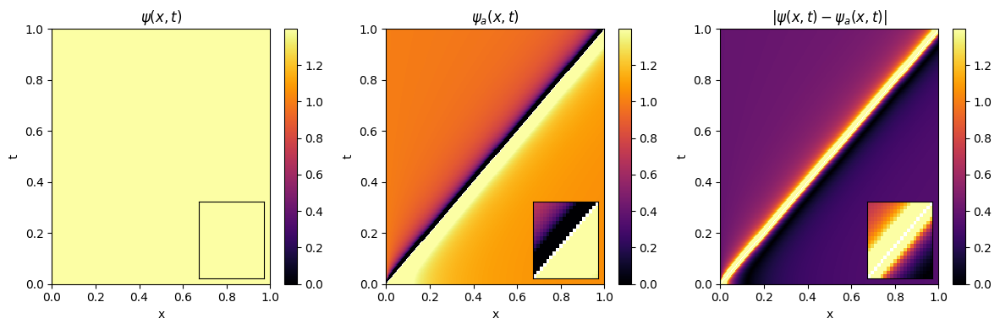

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


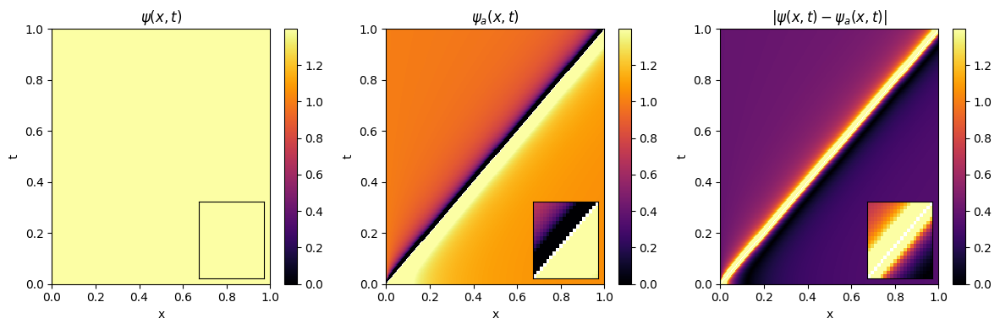

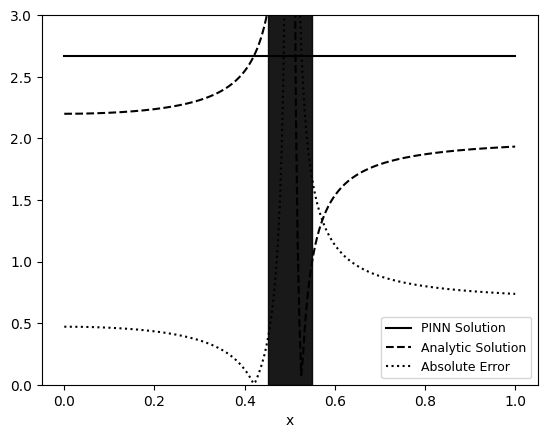

Compiling model...
Building feed-forward neural network...
'build' took 0.116080 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.480405 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.67e-02, 1.19e+00, 2.16e-02]    [4.67e-02, 1.19e+00, 2.16e-02]    []  
1000      [2.42e-03, 2.66e-01, 7.65e-03]    [2.42e-03, 2.66e-01, 7.65e-03]    []  
2000      [4.41e-04, 2.65e-01, 8.19e-03]    [4.41e-04, 2.65e-01, 8.19e-03]    []  
3000      [2.38e-02, 2.99e-01, 1.04e-02]    [2.38e-02, 2.99e-01, 1.04e-02]    []  
4000      [2.54e-06, 3.62e-01, 2.20e-07]    [2.54e-06, 3.62e-01, 2.20e-07]    []  
5000      [2.63e-12, 3.61e-01, 3.04e-14]    [2.63e-12, 3.61e-01, 3.04e-14]    []  
6000      [2.96e-12, 3.61e-01, 3.19e-14]    [2.96e-12, 3.61e-01, 3.19e-14]    []  
7000      [1.43e-11, 3.61e-01, 1.94e-13]    [1.43e-11, 3.61e-01, 1.94e-13]    []  
8000      [1.06e-08, 3.61e-01, 3.90e-11]    [1.06e-08, 3.61e-01, 3.90e-11]    []  
9000      [1.04e-12, 3.61e-01, 9.09e-13]    [1.04e-12, 3.61e-01, 9.09e-13]    []  
10000   

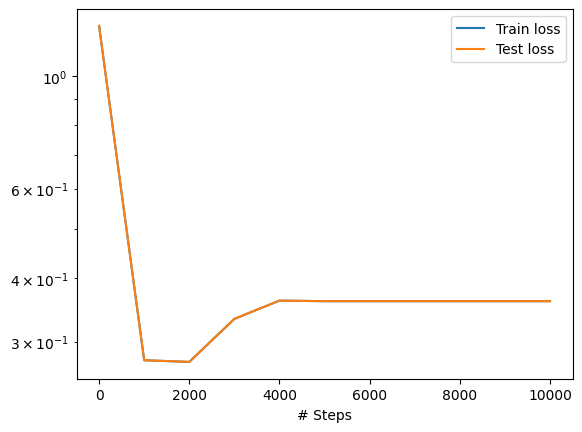

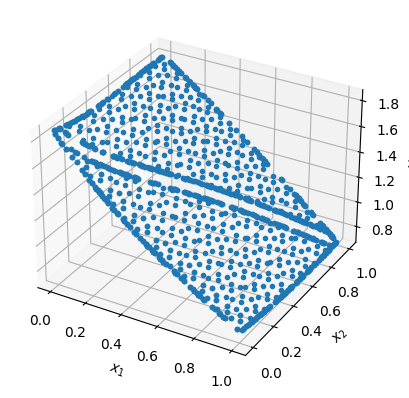

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


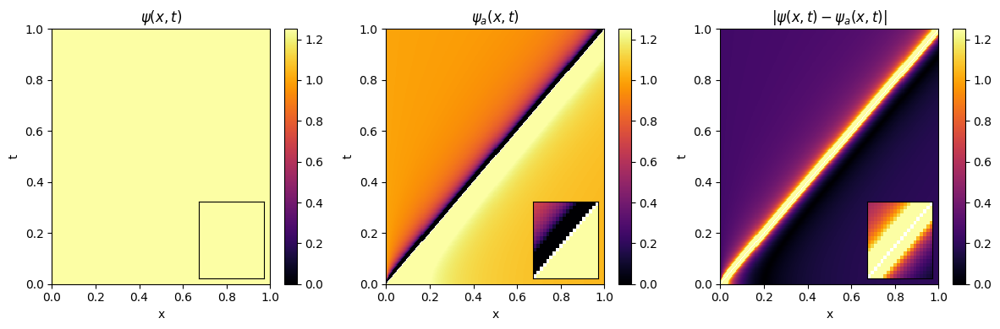

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


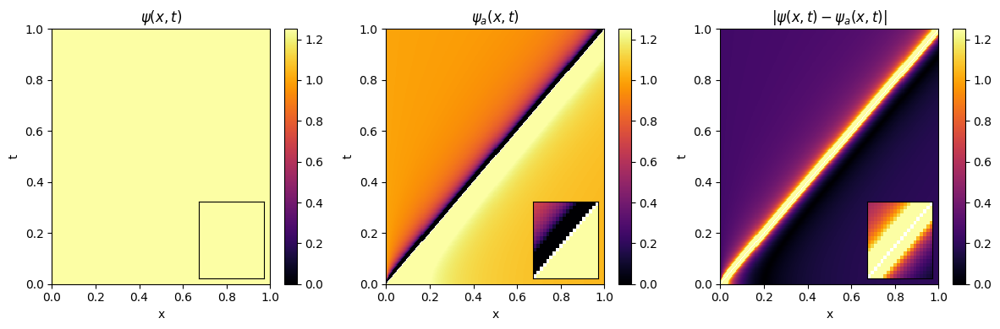

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


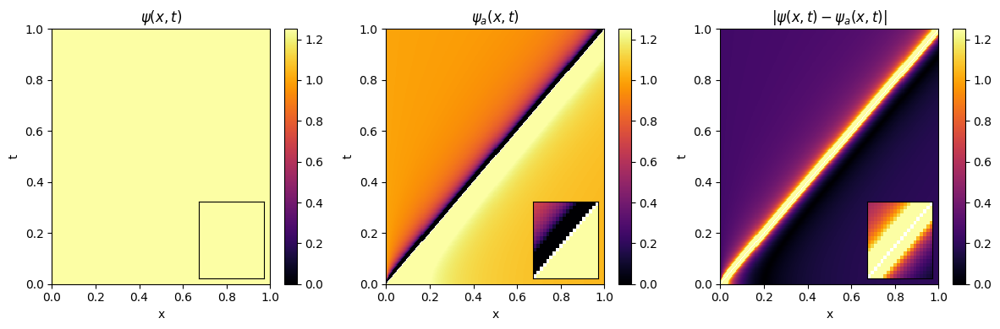

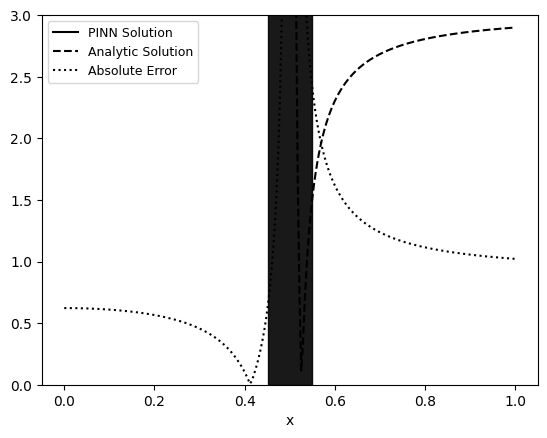

Average Behavior


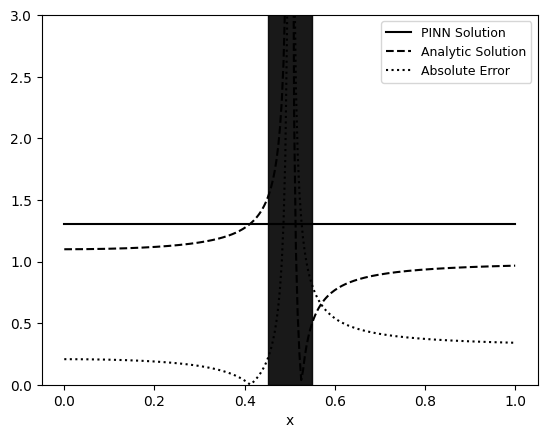

In [13]:


for i in range(sample_size):
    model_10_3 = generate_evolution_model(throat, 500, 500, 10, 3, lr, iterations);
    analytic_v_10_3 += plot_evolution_model(throat, model_10_3)[0];
    v_10_3 += plot_evolution_model(throat, model_10_3)[1];
    diff_10_3 += plot_evolution_model(throat, model_10_3)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_10_3, v_10_3, diff_10_3)
    
    
print("Average Behavior")
analytic_v_10_3 = analytic_v_10_3/sample_size
v_10_3 = v_10_3/sample_size 
diff_10_3 = diff_10_3/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_10_3, v_10_3, diff_10_3)



### Effects of Network Size to Error

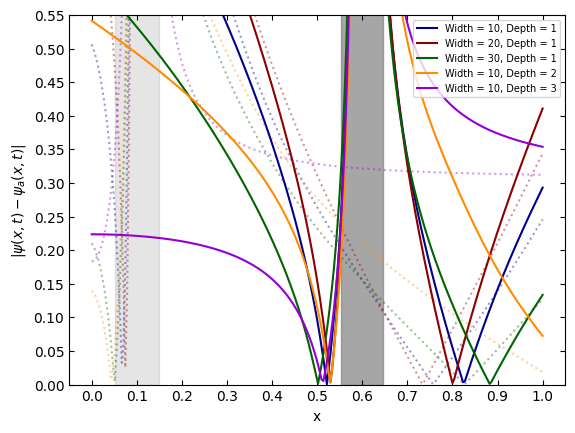

<Figure size 640x480 with 0 Axes>

In [16]:
# Define the x-axis values
t = 0.1
a = 0.05
x = np.linspace(0, 1, len(diff_10_1))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.2, color='gray')

# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-']

ax.plot(x, np.where((abs((v_10_1.T[:, t] - analytic_v_10_1[:, t]))) < threshold,
                    (abs((v_10_1.T[:, t] - analytic_v_10_1[:, t]))), np.nan),
       linestyle=line_styles[2], color='darkblue', alpha=0.4)

ax.plot(x, np.where((abs((v_20_1.T[:, t] - analytic_v_20_1[:, t]))) < threshold,
                    (abs((v_20_1.T[:, t] - analytic_v_20_1[:, t]))), np.nan),
         linestyle=line_styles[2], color='darkred', alpha=0.4)

ax.plot(x, np.where((abs((v_30_1.T[:, t] - analytic_v_30_1[:, t]))) < threshold,
                    (abs((v_30_1.T[:, t] - analytic_v_30_1[:, t]))), np.nan),
         linestyle=line_styles[2], color='darkgreen', alpha=0.4)

ax.plot(x, np.where((abs((v_10_2.T[:, t] - analytic_v_10_2[:, t]))) < threshold,
                    (abs((v_10_2.T[:, t] - analytic_v_10_2[:, t]))), np.nan),
         linestyle=line_styles[2], color='darkorange', alpha=0.4)

ax.plot(x, np.where((abs((v_10_3.T[:, t] - analytic_v_10_3[:, t]))) < threshold,
                    (abs((v_10_3.T[:, t] - analytic_v_10_3[:, t]))), np.nan),
        linestyle=line_styles[2], color='darkviolet', alpha=0.4)

t = 0.6

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')

t = round(t * 255)

ax.plot(x, np.where((abs((v_10_1.T[:, t] - analytic_v_10_1[:, t]))) < threshold,
                    (abs((v_10_1.T[:, t] - analytic_v_10_1[:, t]))), np.nan),
        label="Width = 10, Depth = 1", linestyle=line_styles[0], color='darkblue')

ax.plot(x, np.where((abs((v_20_1.T[:, t] - analytic_v_20_1[:, t]))) < threshold,
                    (abs((v_20_1.T[:, t] - analytic_v_20_1[:, t]))), np.nan),
        label="Width = 20, Depth = 1", linestyle=line_styles[0], color='darkred')

ax.plot(x, np.where((abs((v_30_1.T[:, t] - analytic_v_30_1[:, t]))) < threshold,
                    (abs((v_30_1.T[:, t] - analytic_v_30_1[:, t]))), np.nan),
        label="Width = 30, Depth = 1", linestyle=line_styles[0], color='darkgreen')

ax.plot(x, np.where((abs((v_10_2.T[:, t] - analytic_v_10_2[:, t]))) < threshold,
                    (abs((v_10_2.T[:, t] - analytic_v_10_2[:, t]))), np.nan),
        label="Width = 10, Depth = 2", linestyle=line_styles[0], color='darkorange')

ax.plot(x, np.where((abs((v_10_3.T[:, t] - analytic_v_10_3[:, t]))) < threshold,
                    (abs((v_10_3.T[:, t] - analytic_v_10_3[:, t]))), np.nan),
        label="Width = 10, Depth = 3", linestyle=line_styles[0], color='darkviolet')

# Set the title and labels
# ax.set_title("PINN-excised solutions")
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.5)

# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.6, 0.05))

# Add tick marks on top and right axes
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True)

# Add a legend
legend = ax.legend(fontsize=7)

# Show the plot
plt.show()

# Save the plot as PNG
plt.savefig('plot_nn_size.png', dpi=500, bbox_inches='tight')


### Domain and Boundary Training Points Study

### Domain = 100, Boundary = 100

Compiling model...
Building feed-forward neural network...
'build' took 0.086675 s

'compile' took 0.951967 s

Initializing variables...
Training model...

0         [6.69e-02, 4.01e+00, 5.14e-04]    [6.69e-02, 4.01e+00, 5.14e-04]    []  
1000      [2.68e-03, 1.15e+00, 2.87e-02]    [2.68e-03, 1.15e+00, 2.87e-02]    []  
2000      [8.34e-06, 1.52e+00, 1.05e-07]    [8.34e-06, 1.52e+00, 1.05e-07]    []  
3000      [1.40e-06, 1.52e+00, 3.04e-08]    [1.40e-06, 1.52e+00, 3.04e-08]    []  
4000      [5.64e-08, 1.52e+00, 8.27e-10]    [5.64e-08, 1.52e+00, 8.27e-10]    []  
5000      [1.15e-08, 1.52e+00, 1.28e-10]    [1.15e-08, 1.52e+00, 1.28e-10]    []  
6000      [1.83e-07, 1.52e+00, 2.06e-09]    [1.83e-07, 1.52e+00, 2.06e-09]    []  
7000      [1.73e-12, 1.52e+00, 3.95e-14]    [1.73e-12, 1.52e+00, 3.95e-14]    []  
8000      [3.06e-12, 1.52e+00, 7.56e-14]    [3.06e-12, 1.52e+00, 7.56e-14]    []  
9000      [7.43e-12, 1.52e+00, 1.89e-13]    [7.43e-12, 1.52e+00, 1.89e-13]    []  
10000     [1.9

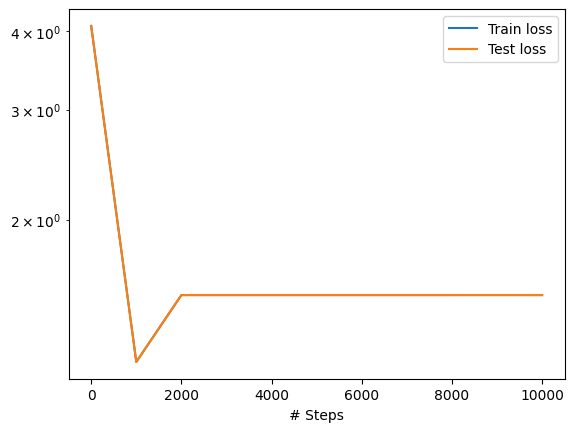

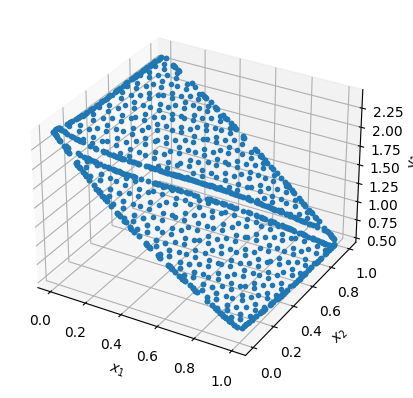

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


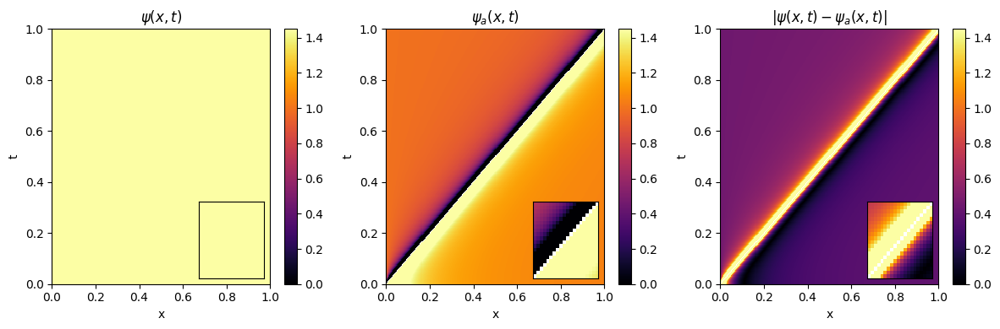

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


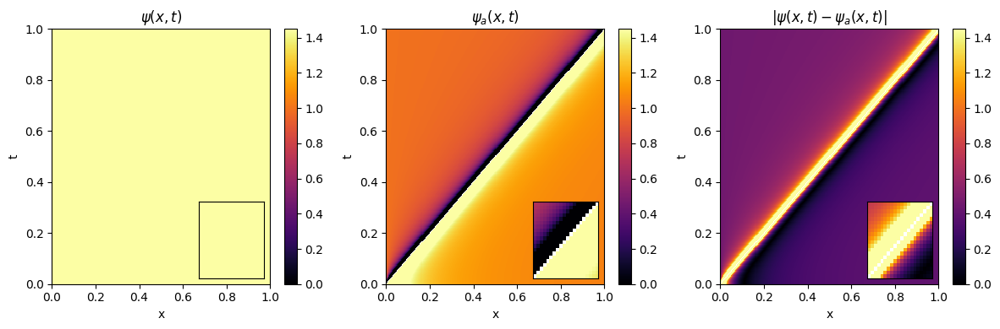

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


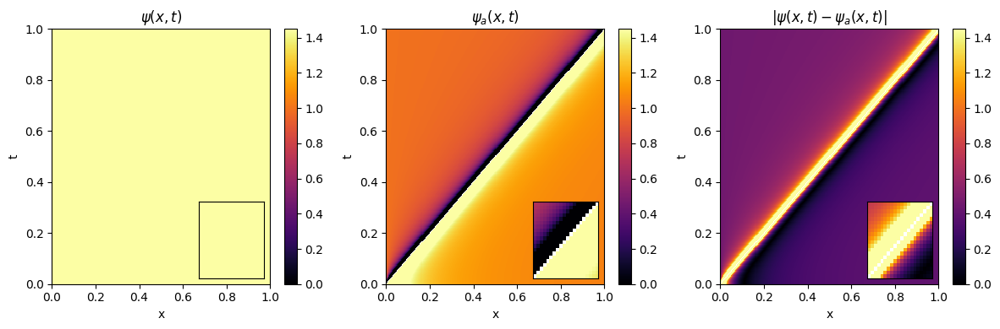

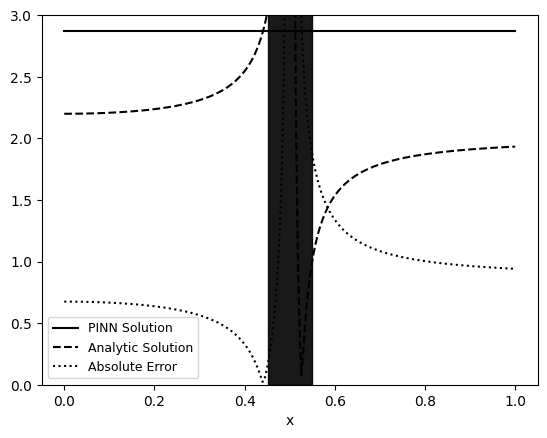

Compiling model...
Building feed-forward neural network...
'build' took 0.057818 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.974041 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.05e-02, 2.62e+00, 2.90e-03]    [1.05e-02, 2.62e+00, 2.90e-03]    []  
1000      [1.01e-07, 5.29e-01, 2.16e-08]    [1.01e-07, 5.29e-01, 2.16e-08]    []  
2000      [7.80e-11, 5.29e-01, 1.92e-11]    [7.80e-11, 5.29e-01, 1.92e-11]    []  
3000      [1.02e-10, 5.29e-01, 2.48e-11]    [1.02e-10, 5.29e-01, 2.48e-11]    []  
4000      [1.44e-10, 5.63e-01, 3.50e-11]    [1.44e-10, 5.63e-01, 3.50e-11]    []  
5000      [6.68e-08, 5.29e-01, 1.79e-08]    [6.68e-08, 5.29e-01, 1.79e-08]    []  
6000      [1.21e-09, 5.29e-01, 8.74e-11]    [1.21e-09, 5.29e-01, 8.74e-11]    []  
7000      [4.16e-10, 5.29e-01, 7.92e-11]    [4.16e-10, 5.29e-01, 7.92e-11]    []  
8000      [3.00e-17, 5.29e-01, 3.36e-18]    [3.00e-17, 5.29e-01, 3.36e-18]    []  
9000      [2.89e-17, 5.29e-01, 3.29e-18]    [2.89e-17, 5.29e-01, 3.29e-18]    []  
10000   

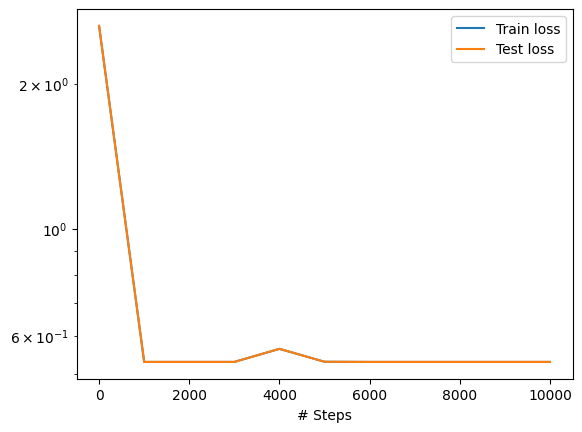

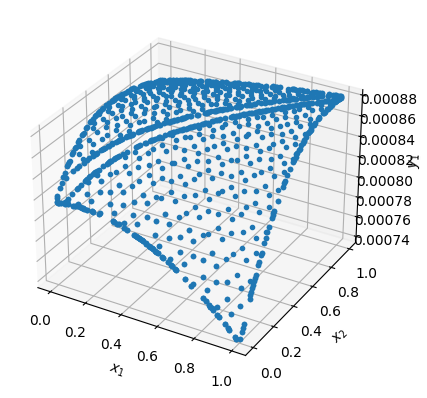

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


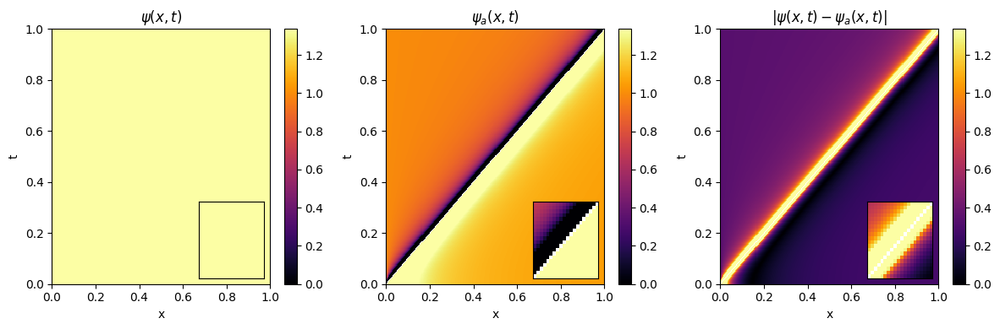

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


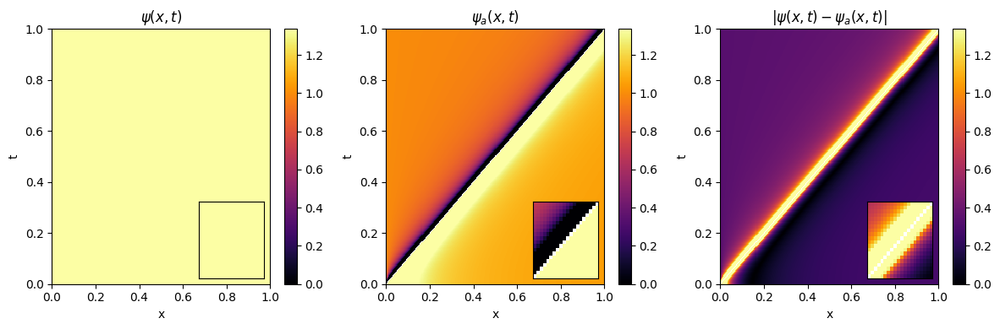

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


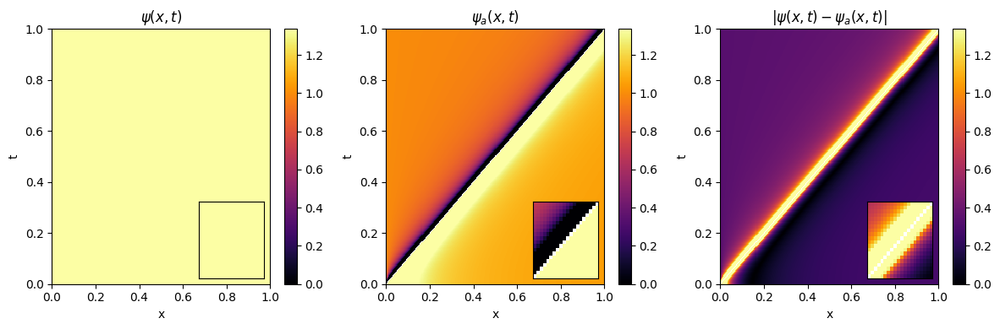

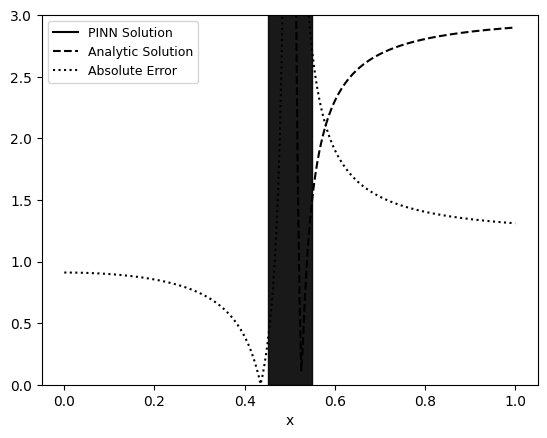

Compiling model...
Building feed-forward neural network...
'build' took 0.057822 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.960624 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.53e-03, 3.29e+00, 9.63e-03]    [2.53e-03, 3.29e+00, 9.63e-03]    []  
1000      [1.75e-03, 1.08e+00, 2.35e-02]    [1.75e-03, 1.08e+00, 2.35e-02]    []  
2000      [6.99e-03, 1.33e+00, 3.78e-02]    [6.99e-03, 1.33e+00, 3.78e-02]    []  
3000      [7.59e-04, 1.33e+00, 3.45e-02]    [7.59e-04, 1.33e+00, 3.45e-02]    []  
4000      [6.13e-05, 1.44e+00, 1.96e-07]    [6.13e-05, 1.44e+00, 1.96e-07]    []  
5000      [1.38e-11, 1.44e+00, 5.77e-13]    [1.38e-11, 1.44e+00, 5.77e-13]    []  
6000      [1.13e-11, 1.44e+00, 4.85e-13]    [1.13e-11, 1.44e+00, 4.85e-13]    []  
7000      [8.58e-12, 1.44e+00, 3.84e-13]    [8.58e-12, 1.44e+00, 3.84e-13]    []  
8000      [5.92e-12, 1.44e+00, 2.84e-13]    [5.92e-12, 1.44e+00, 2.84e-13]    []  
9000      [3.69e-12, 1.44e+00, 2.00e-13]    [3.69e-12, 1.44e+00, 2.00e-13]    []  
10000   

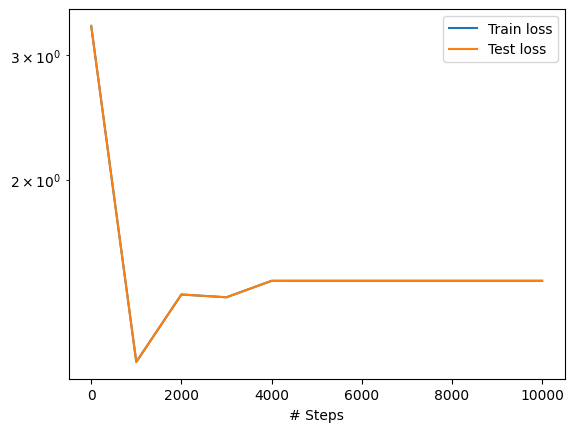

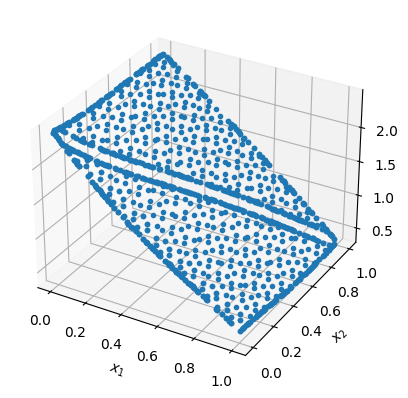

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


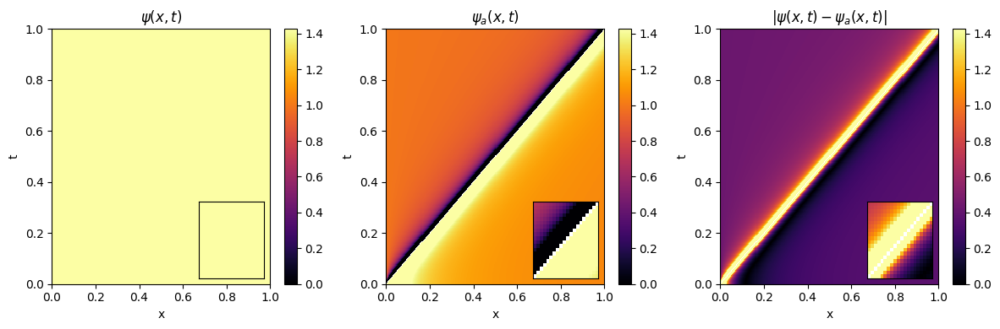

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


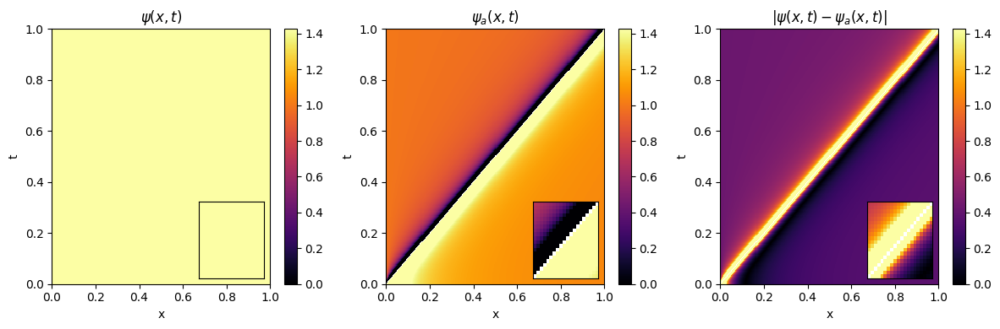

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


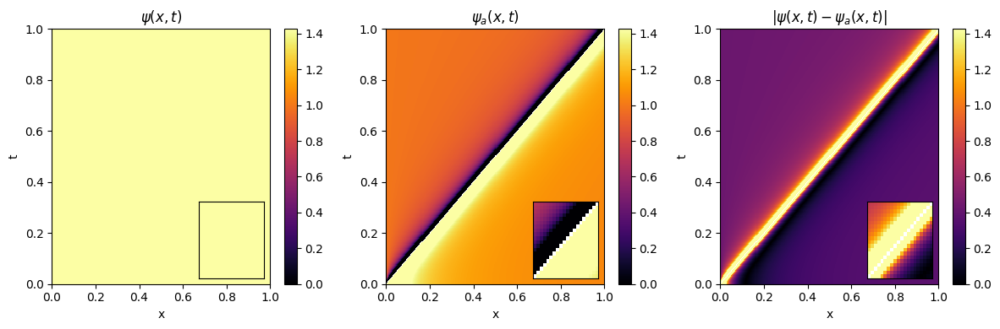

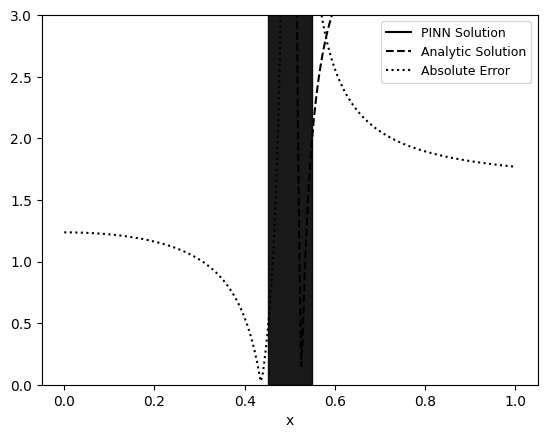

Average Behavior


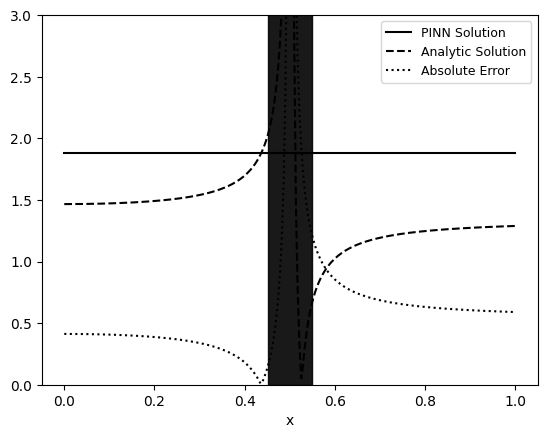

In [17]:

for i in range(sample_size):
    model_100_100 = generate_evolution_model(throat, 100, 100, 10, 3, lr, iterations);
    analytic_v_100_100 += plot_evolution_model(throat, model_100_100)[0];
    v_100_100 += plot_evolution_model(throat, model_100_100)[1];
    diff_100_100 += plot_evolution_model(throat, model_100_100)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_100_100, v_100_100, diff_100_100)
    
    
print("Average Behavior")
analytic_v_100_100 = analytic_v_100_100/sample_size
v_100_100 = v_100_100/sample_size 
diff_100_100 = diff_100_100/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_100_100, v_100_100, diff_100_100)


### Domain = 200, Boundary = 100

Compiling model...
Building feed-forward neural network...
'build' took 0.058054 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.985131 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [7.25e-03, 3.29e+00, 1.03e-02]    [7.25e-03, 3.29e+00, 1.03e-02]    []  
1000      [1.66e-03, 1.12e+00, 2.09e-02]    [1.66e-03, 1.12e+00, 2.09e-02]    []  
2000      [1.19e-03, 1.12e+00, 1.95e-02]    [1.19e-03, 1.12e+00, 1.95e-02]    []  
3000      [1.69e-02, 1.38e+00, 1.27e-03]    [1.69e-02, 1.38e+00, 1.27e-03]    []  
4000      [1.63e-12, 1.42e+00, 4.66e-14]    [1.63e-12, 1.42e+00, 4.66e-14]    []  
5000      [2.87e-12, 1.42e+00, 8.06e-14]    [2.87e-12, 1.42e+00, 8.06e-14]    []  
6000      [8.56e-12, 1.42e+00, 2.77e-13]    [8.56e-12, 1.42e+00, 2.77e-13]    []  
7000      [7.77e-10, 1.42e+00, 1.06e-10]    [7.77e-10, 1.42e+00, 1.06e-10]    []  
8000      [2.43e-13, 1.42e+00, 2.50e-15]    [2.43e-13, 1.42e+00, 2.50e-15]    []  
9000      [1.86e-13, 1.42e+00, 9.62e-15]    [1.86e-13, 1.42e+00, 9.62e-15]    []  
10000   

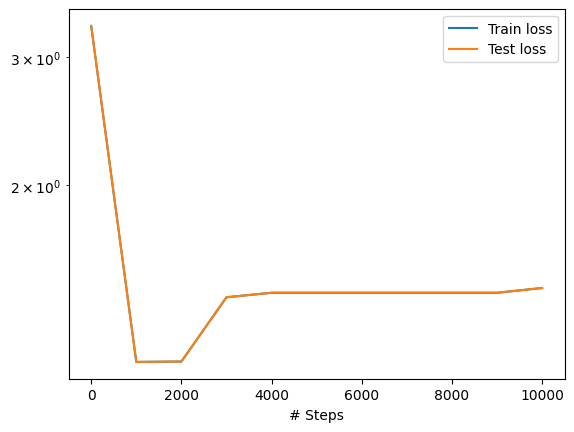

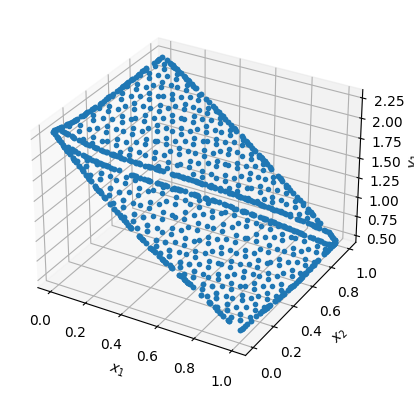

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


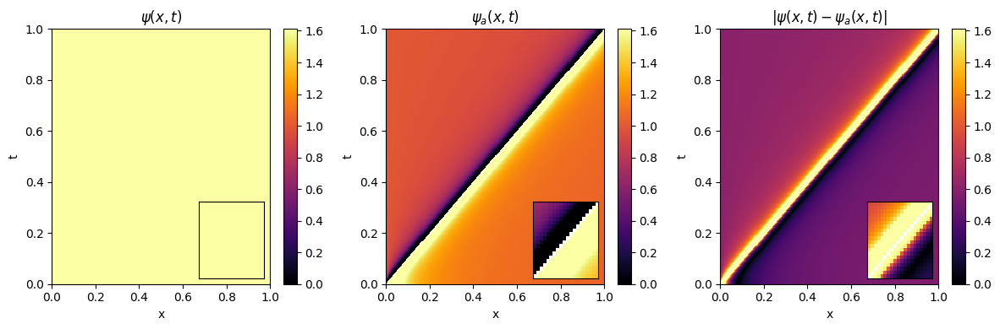

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


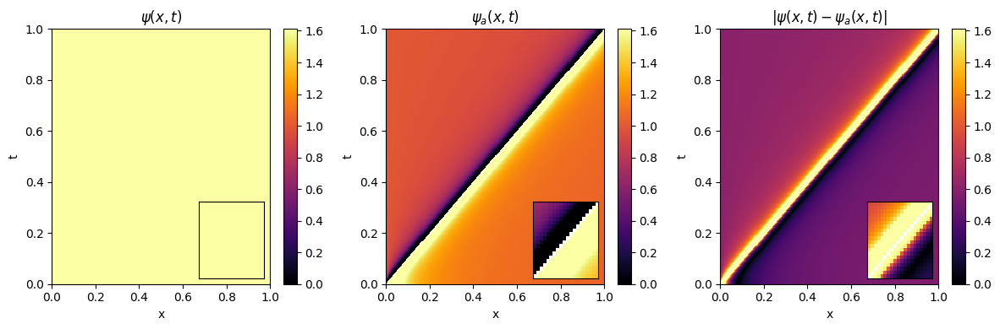

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


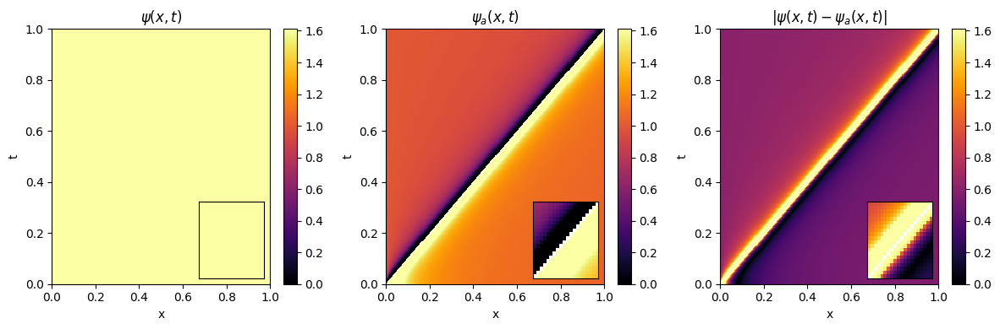

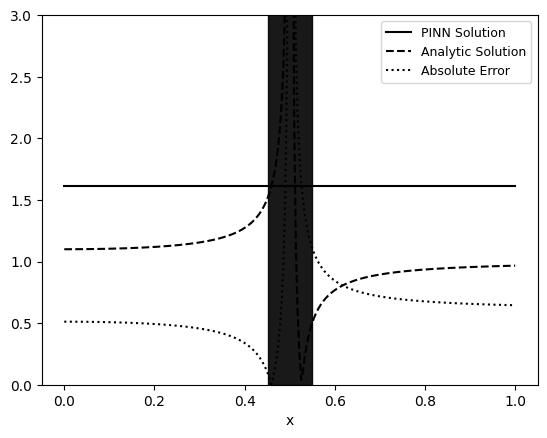

Compiling model...
Building feed-forward neural network...
'build' took 0.058431 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 0.997122 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [3.11e-02, 4.77e+00, 7.39e-02]    [3.11e-02, 4.77e+00, 7.39e-02]    []  
1000      [4.01e-03, 1.47e+00, 8.77e-04]    [4.01e-03, 1.47e+00, 8.77e-04]    []  
2000      [4.65e-09, 1.43e+00, 7.37e-10]    [4.65e-09, 1.43e+00, 7.37e-10]    []  
3000      [1.47e-08, 1.43e+00, 2.75e-10]    [1.47e-08, 1.43e+00, 2.75e-10]    []  
4000      [4.84e-04, 1.42e+00, 1.01e-04]    [4.84e-04, 1.42e+00, 1.01e-04]    []  
5000      [5.30e-16, 1.43e+00, 6.86e-16]    [5.30e-16, 1.43e+00, 6.86e-16]    []  
6000      [5.41e-16, 1.43e+00, 6.94e-16]    [5.41e-16, 1.43e+00, 6.94e-16]    []  
7000      [5.66e-16, 1.43e+00, 7.12e-16]    [5.66e-16, 1.43e+00, 7.12e-16]    []  
8000      [6.13e-16, 1.43e+00, 7.46e-16]    [6.13e-16, 1.43e+00, 7.46e-16]    []  
9000      [6.95e-16, 1.43e+00, 8.05e-16]    [6.95e-16, 1.43e+00, 8.05e-16]    []  
10000   

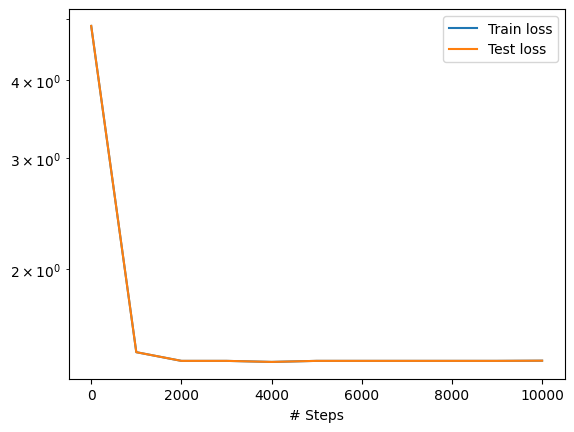

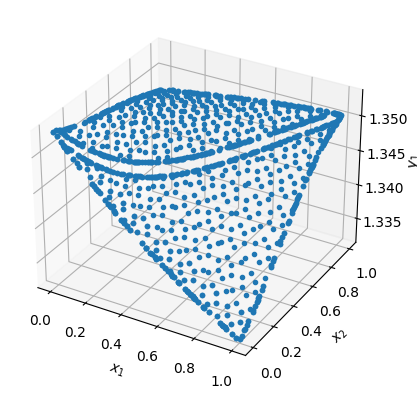

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


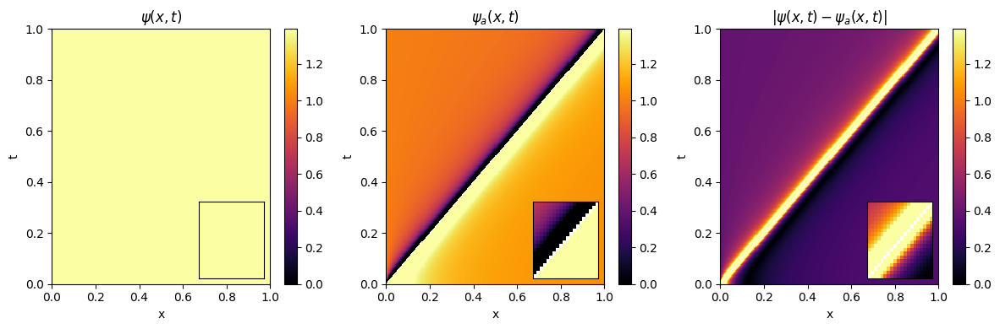

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


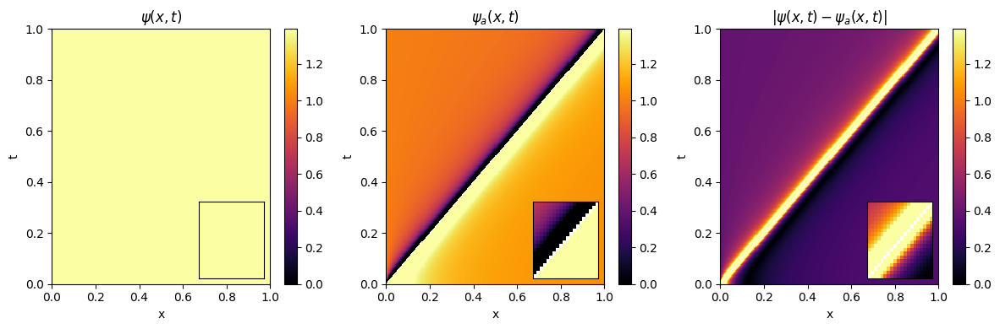

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


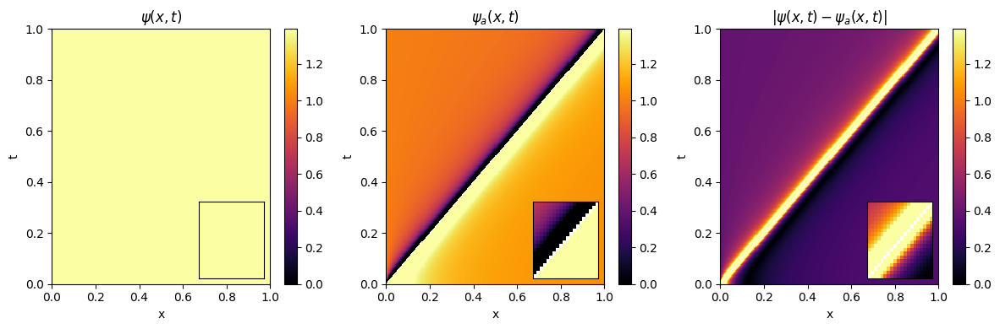

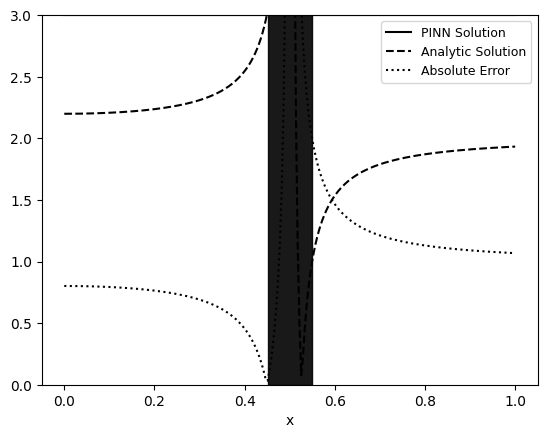

Compiling model...
Building feed-forward neural network...
'build' took 0.060714 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.051609 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.52e-01, 2.90e+00, 1.27e-01]    [1.52e-01, 2.90e+00, 1.27e-01]    []  
1000      [4.57e-04, 7.06e-02, 2.74e-03]    [4.57e-04, 7.06e-02, 2.74e-03]    []  
2000      [1.96e-04, 6.77e-02, 3.45e-03]    [1.96e-04, 6.77e-02, 3.45e-03]    []  
3000      [2.15e-12, 1.13e-01, 2.56e-14]    [2.15e-12, 1.13e-01, 2.56e-14]    []  
4000      [2.02e-12, 1.13e-01, 2.48e-14]    [2.02e-12, 1.13e-01, 2.48e-14]    []  
5000      [1.94e-12, 1.13e-01, 2.49e-14]    [1.94e-12, 1.13e-01, 2.49e-14]    []  
6000      [1.90e-12, 1.13e-01, 2.64e-14]    [1.90e-12, 1.13e-01, 2.64e-14]    []  
7000      [1.93e-12, 1.13e-01, 3.09e-14]    [1.93e-12, 1.13e-01, 3.09e-14]    []  
8000      [2.15e-12, 1.13e-01, 4.43e-14]    [2.15e-12, 1.13e-01, 4.43e-14]    []  
9000      [3.71e-12, 1.13e-01, 1.32e-13]    [3.71e-12, 1.13e-01, 1.32e-13]    []  
10000   

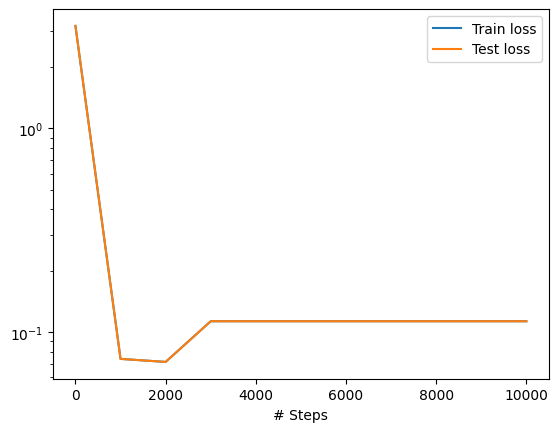

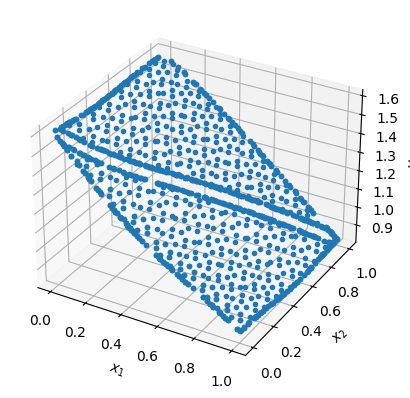

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


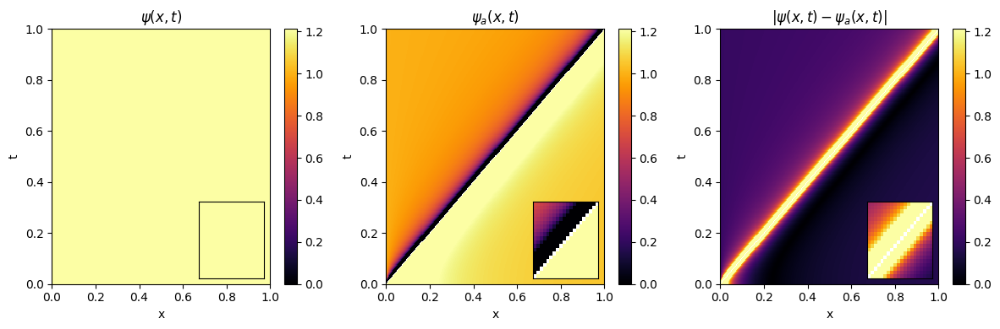

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


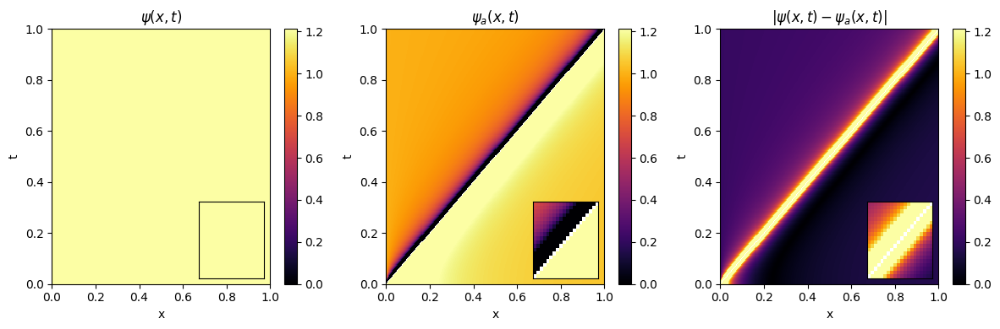

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


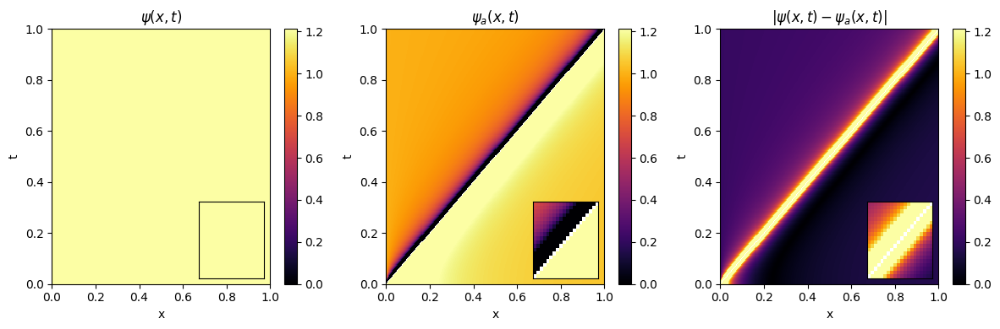

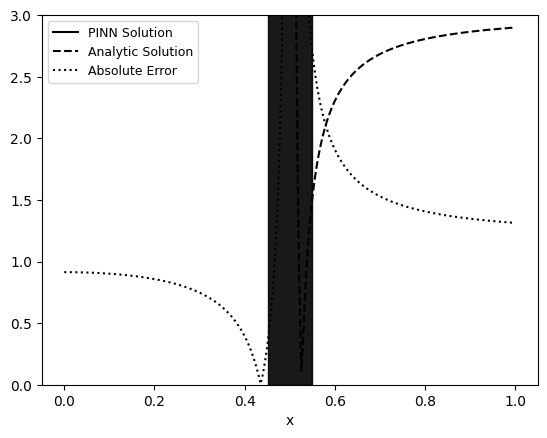

Average Behavior


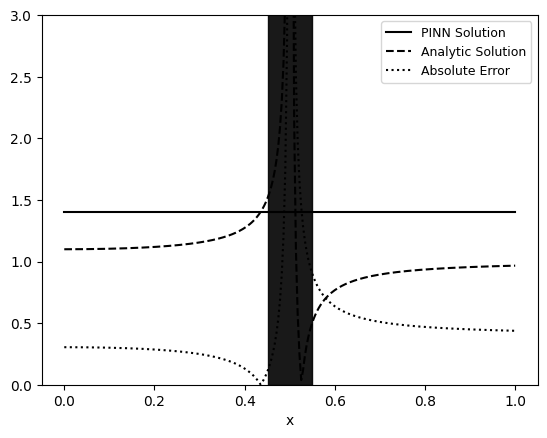

In [18]:

for i in range(sample_size):
    model_200_100 = generate_evolution_model(throat, 200, 100, 10, 3, lr, iterations);
    analytic_v_200_100 += plot_evolution_model(throat, model_200_100)[0];
    v_200_100 += plot_evolution_model(throat, model_200_100)[1];
    diff_200_100 += plot_evolution_model(throat, model_200_100)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_200_100, v_200_100, diff_200_100)
    
    
print("Average Behavior")
analytic_v_200_100 = analytic_v_200_100/sample_size
v_200_100 = v_200_100/sample_size 
diff_200_100 = diff_200_100/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_200_100, v_200_100, diff_200_100)


### Domain = 500, Boundary = 100

Compiling model...
Building feed-forward neural network...
'build' took 0.062101 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.572739 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.78e-01, 3.17e+00, 6.27e-01]    [2.78e-01, 3.17e+00, 6.27e-01]    []  
1000      [1.18e-02, 1.20e+00, 2.42e-02]    [1.18e-02, 1.20e+00, 2.42e-02]    []  
2000      [3.68e-02, 1.34e+00, 9.84e-03]    [3.68e-02, 1.34e+00, 9.84e-03]    []  
3000      [1.90e-10, 1.56e+00, 2.39e-11]    [1.90e-10, 1.56e+00, 2.39e-11]    []  
4000      [4.45e-11, 1.58e+00, 6.40e-12]    [4.45e-11, 1.58e+00, 6.40e-12]    []  
5000      [1.98e-11, 1.56e+00, 3.31e-12]    [1.98e-11, 1.56e+00, 3.31e-12]    []  
6000      [3.08e-11, 1.56e+00, 4.99e-12]    [3.08e-11, 1.56e+00, 4.99e-12]    []  
7000      [6.49e-11, 1.56e+00, 1.04e-10]    [6.49e-11, 1.56e+00, 1.04e-10]    []  
8000      [1.13e-12, 1.56e+00, 2.03e-15]    [1.13e-12, 1.56e+00, 2.03e-15]    []  
9000      [3.02e-13, 1.56e+00, 4.82e-15]    [3.02e-13, 1.56e+00, 4.82e-15]    []  
10000   

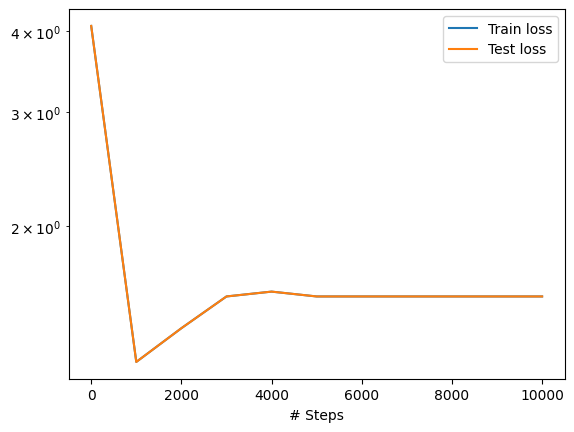

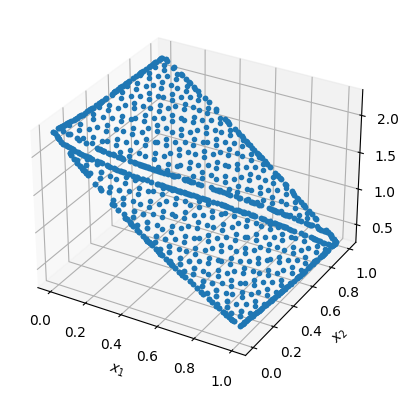

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


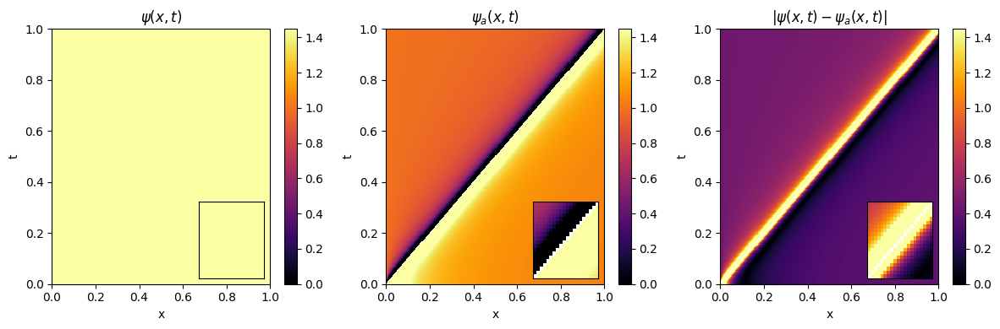

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


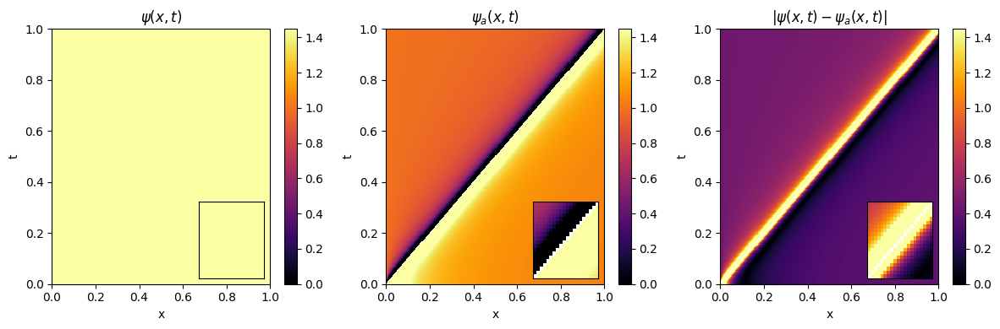

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


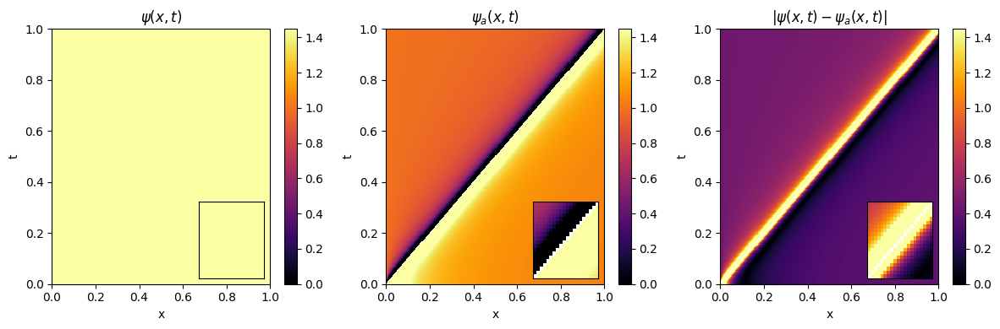

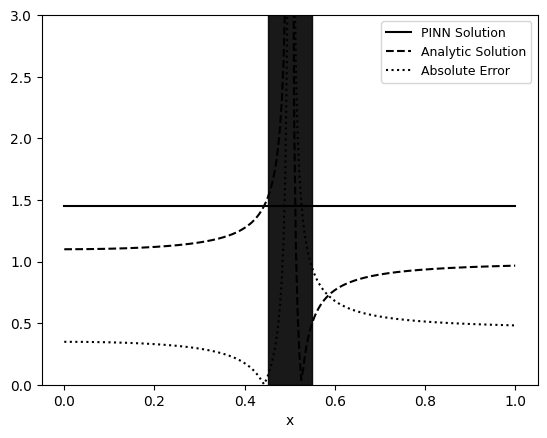

Compiling model...
Building feed-forward neural network...
'build' took 0.065903 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.290848 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.98e-03, 2.43e+00, 3.08e-02]    [2.98e-03, 2.43e+00, 3.08e-02]    []  
1000      [7.11e-04, 6.17e-02, 2.03e-03]    [7.11e-04, 6.17e-02, 2.03e-03]    []  
2000      [1.28e-03, 6.93e-02, 3.98e-03]    [1.28e-03, 6.93e-02, 3.98e-03]    []  
3000      [2.86e-04, 9.81e-02, 6.29e-04]    [2.86e-04, 9.81e-02, 6.29e-04]    []  
4000      [1.44e-12, 1.04e-01, 4.92e-12]    [1.44e-12, 1.04e-01, 4.92e-12]    []  
5000      [1.49e-12, 1.04e-01, 1.86e-12]    [1.49e-12, 1.04e-01, 1.86e-12]    []  
6000      [1.77e-12, 1.07e-01, 2.08e-12]    [1.77e-12, 1.07e-01, 2.08e-12]    []  
7000      [3.15e-10, 1.04e-01, 3.41e-12]    [3.15e-10, 1.04e-01, 3.41e-12]    []  
8000      [2.84e-13, 1.04e-01, 6.93e-13]    [2.84e-13, 1.04e-01, 6.93e-13]    []  
9000      [3.53e-14, 1.04e-01, 5.29e-14]    [3.53e-14, 1.04e-01, 5.29e-14]    []  
10000   

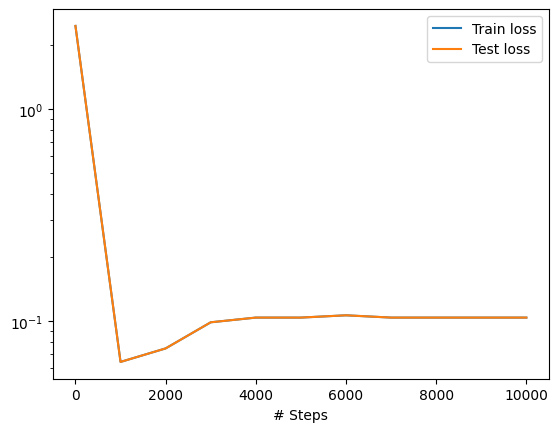

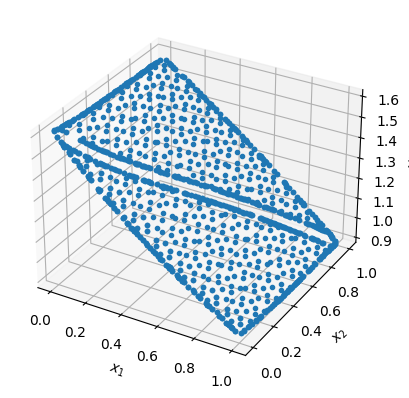

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


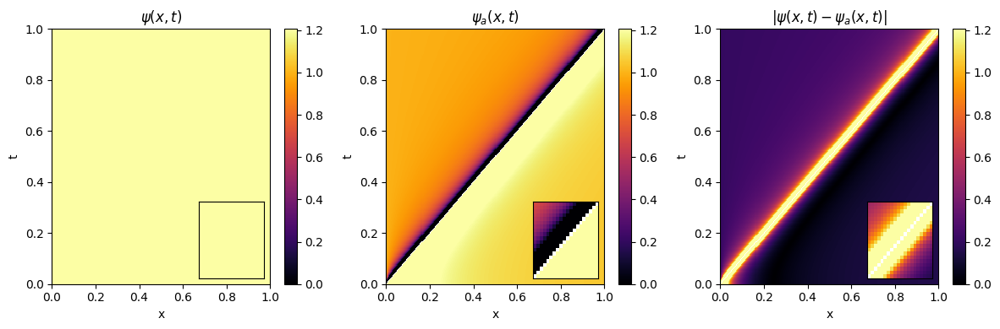

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


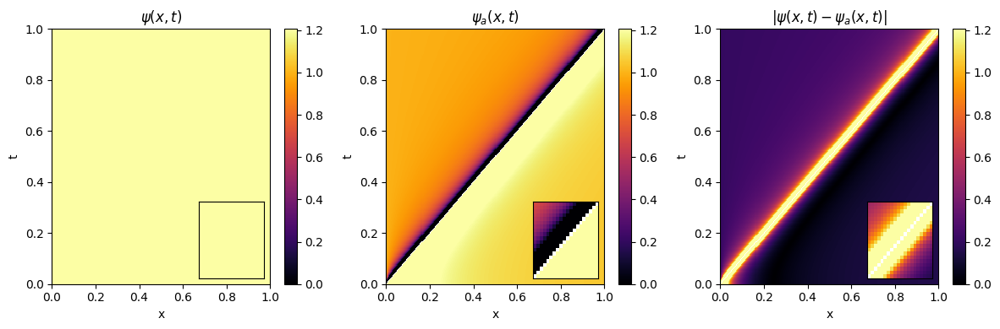

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


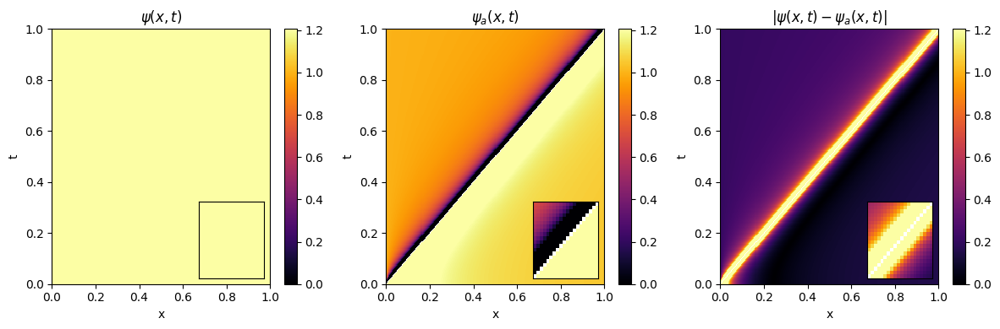

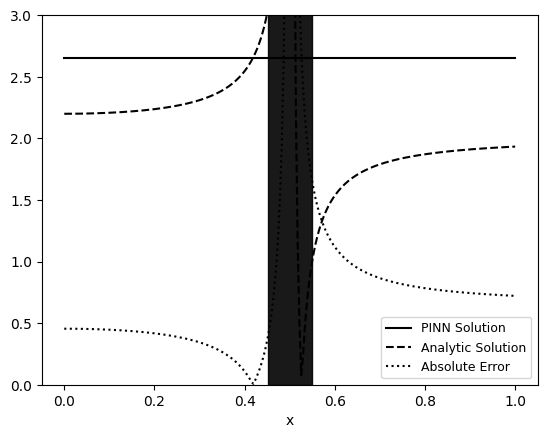

Compiling model...
Building feed-forward neural network...
'build' took 0.068292 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.994289 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [8.61e-02, 1.78e+00, 1.35e-03]    [8.61e-02, 1.78e+00, 1.35e-03]    []  
1000      [3.21e-03, 4.02e-02, 1.36e-03]    [3.21e-03, 4.02e-02, 1.36e-03]    []  
2000      [1.89e-04, 4.01e-02, 1.48e-03]    [1.89e-04, 4.01e-02, 1.48e-03]    []  
3000      [2.54e-04, 4.29e-02, 1.65e-03]    [2.54e-04, 4.29e-02, 1.65e-03]    []  
4000      [9.46e-12, 7.10e-02, 1.96e-12]    [9.46e-12, 7.10e-02, 1.96e-12]    []  
5000      [1.08e-11, 7.10e-02, 2.21e-12]    [1.08e-11, 7.10e-02, 2.21e-12]    []  
6000      [1.38e-11, 7.10e-02, 2.79e-12]    [1.38e-11, 7.10e-02, 2.79e-12]    []  
7000      [2.66e-11, 7.10e-02, 5.16e-12]    [2.66e-11, 7.10e-02, 5.16e-12]    []  
8000      [4.29e-10, 7.11e-02, 7.13e-11]    [4.29e-10, 7.11e-02, 7.13e-11]    []  
9000      [2.91e-16, 7.17e-02, 1.12e-14]    [2.91e-16, 7.17e-02, 1.12e-14]    []  
10000   

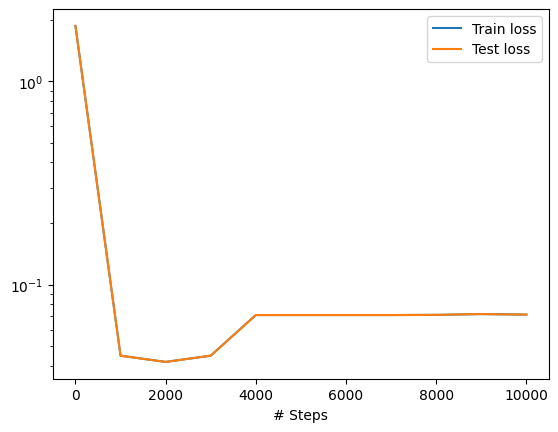

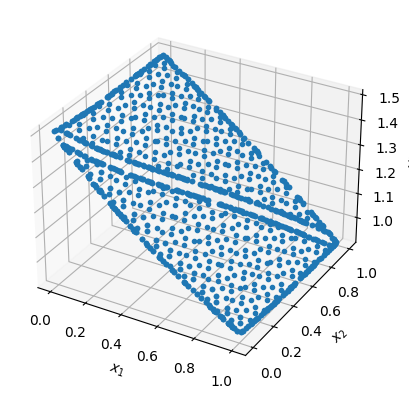

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


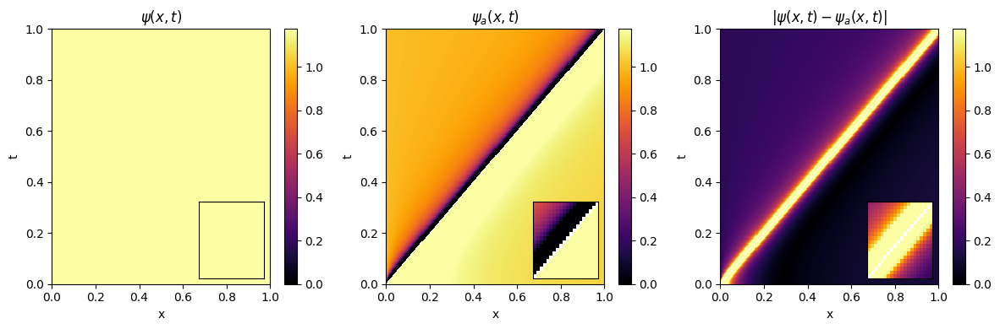

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


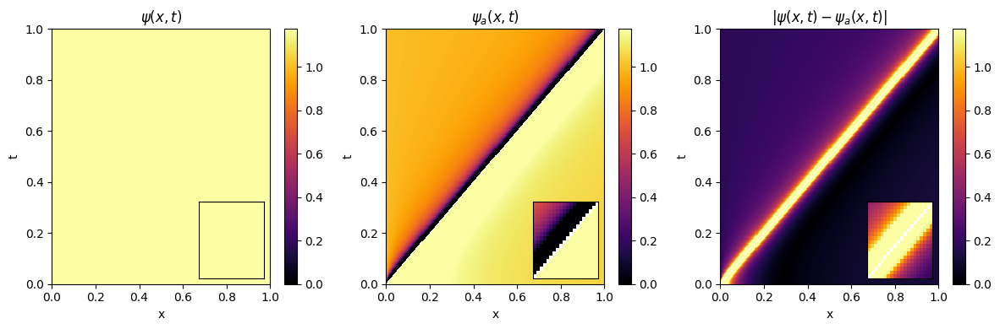

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


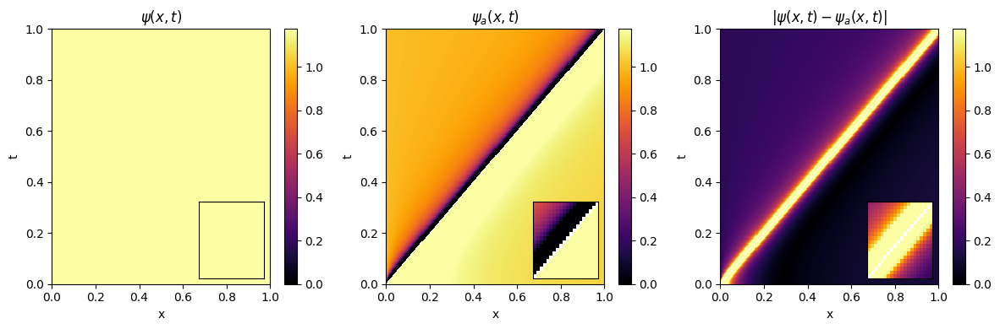

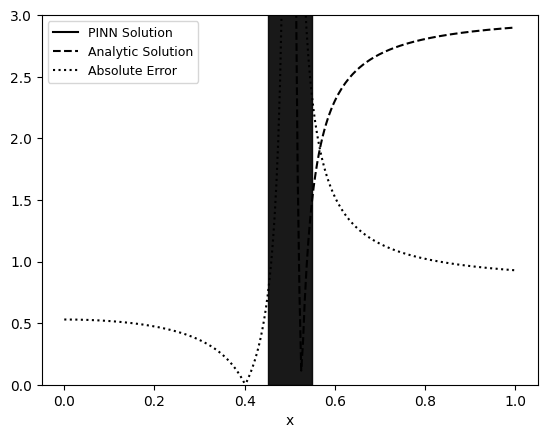

Average Behavior


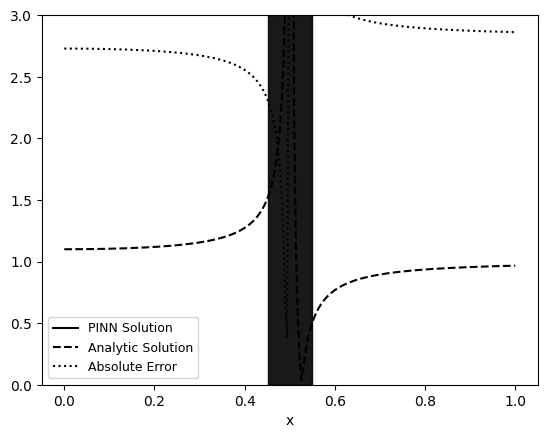

In [19]:

for i in range(sample_size):
    model_500_100 = generate_evolution_model(throat, 500, 100, 10, 3, lr, iterations);
    analytic_v_500_100 += plot_evolution_model(throat, model_500_100)[0];
    v_500_100 += plot_evolution_model(throat, model_500_100)[1];
    diff_500_100 += plot_evolution_model(throat, model_500_100)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_500_100, v_500_100, diff_500_100)
    
    
print("Average Behavior")
analytic_v_500_100 = analytic_v_500_100/sample_size
v_100_100 = v_500_100/sample_size 
diff_100_100 = diff_500_100/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_500_100, v_500_100, diff_500_100)


### Domain = 100, Boundary = 200

Compiling model...
Building feed-forward neural network...
'build' took 0.062646 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.191607 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.37e-01, 2.82e+00, 6.24e-01]    [2.37e-01, 2.82e+00, 6.24e-01]    []  
1000      [2.19e-02, 1.32e+00, 2.17e-02]    [2.19e-02, 1.32e+00, 2.17e-02]    []  
2000      [1.53e-10, 1.39e+00, 5.39e-10]    [1.53e-10, 1.39e+00, 5.39e-10]    []  
3000      [1.25e-06, 1.39e+00, 4.13e-08]    [1.25e-06, 1.39e+00, 4.13e-08]    []  
4000      [6.67e-12, 1.39e+00, 8.37e-13]    [6.67e-12, 1.39e+00, 8.37e-13]    []  
5000      [7.32e-12, 1.39e+00, 4.56e-13]    [7.32e-12, 1.39e+00, 4.56e-13]    []  
6000      [1.16e-11, 1.39e+00, 2.63e-13]    [1.16e-11, 1.39e+00, 2.63e-13]    []  
7000      [8.40e-11, 1.39e+00, 6.63e-13]    [8.40e-11, 1.39e+00, 6.63e-13]    []  
8000      [2.36e-14, 1.39e+00, 6.09e-17]    [2.36e-14, 1.39e+00, 6.09e-17]    []  
9000      [2.36e-14, 1.39e+00, 6.14e-17]    [2.36e-14, 1.39e+00, 6.14e-17]    []  
10000   

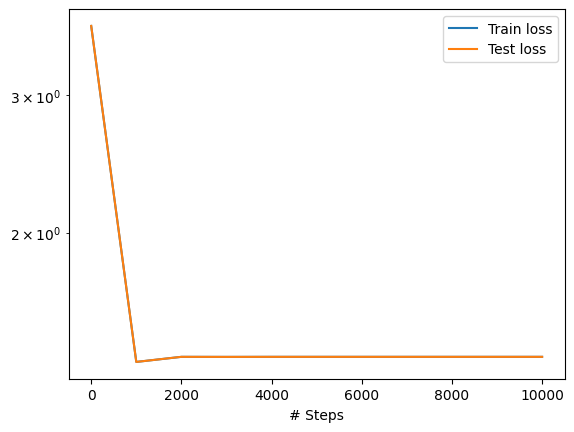

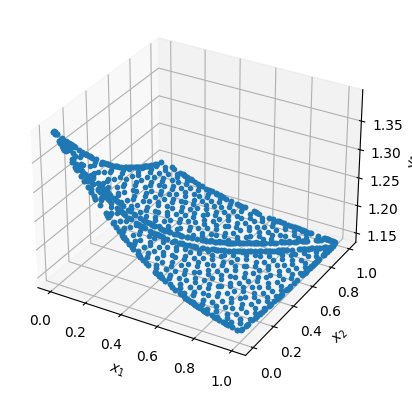

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


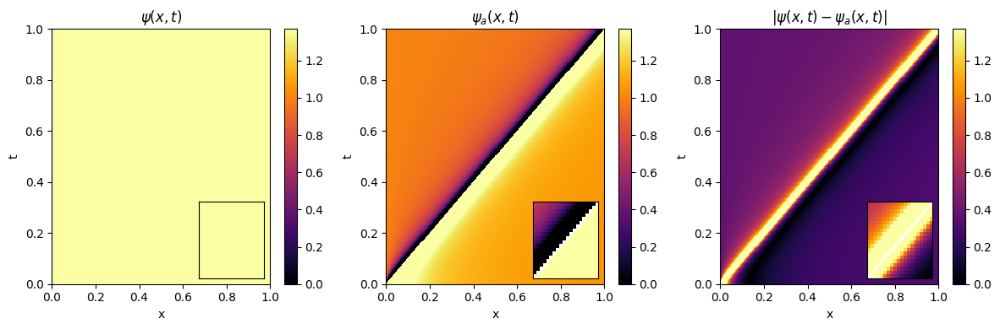

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


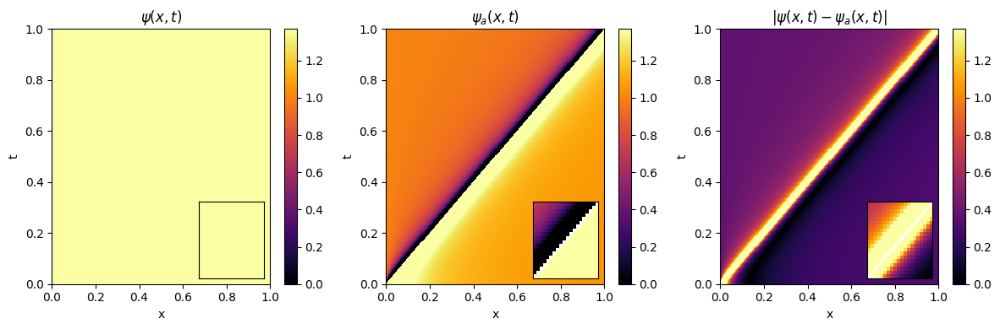

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


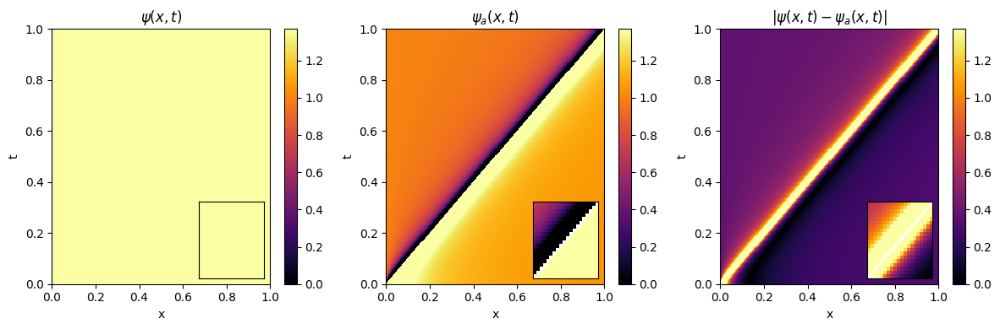

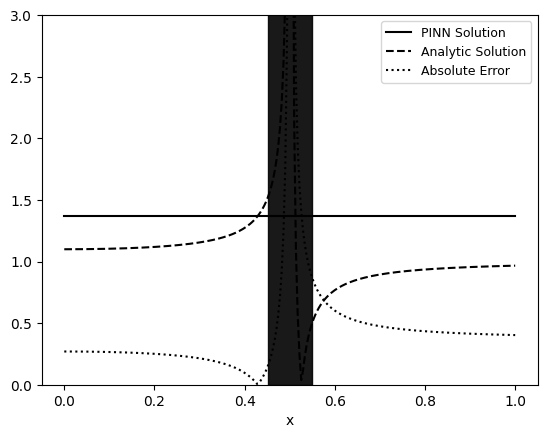

Compiling model...
Building feed-forward neural network...
'build' took 0.065526 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.335906 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.36e-02, 3.26e+00, 1.06e-01]    [2.36e-02, 3.26e+00, 1.06e-01]    []  
1000      [8.87e-04, 1.06e+00, 1.87e-02]    [8.87e-04, 1.06e+00, 1.87e-02]    []  
2000      [8.44e-04, 1.06e+00, 1.91e-02]    [8.44e-04, 1.06e+00, 1.91e-02]    []  
3000      [1.55e-08, 1.33e+00, 9.38e-10]    [1.55e-08, 1.33e+00, 9.38e-10]    []  
4000      [8.25e-11, 1.33e+00, 1.13e-10]    [8.25e-11, 1.33e+00, 1.13e-10]    []  
5000      [6.01e-11, 1.33e+00, 2.35e-10]    [6.01e-11, 1.33e+00, 2.35e-10]    []  
6000      [1.80e-09, 1.33e+00, 7.45e-12]    [1.80e-09, 1.33e+00, 7.45e-12]    []  
7000      [1.54e-06, 1.33e+00, 1.83e-09]    [1.54e-06, 1.33e+00, 1.83e-09]    []  
8000      [4.10e-17, 1.33e+00, 2.84e-19]    [4.10e-17, 1.33e+00, 2.84e-19]    []  
9000      [4.51e-17, 1.33e+00, 3.09e-19]    [4.51e-17, 1.33e+00, 3.09e-19]    []  
10000   

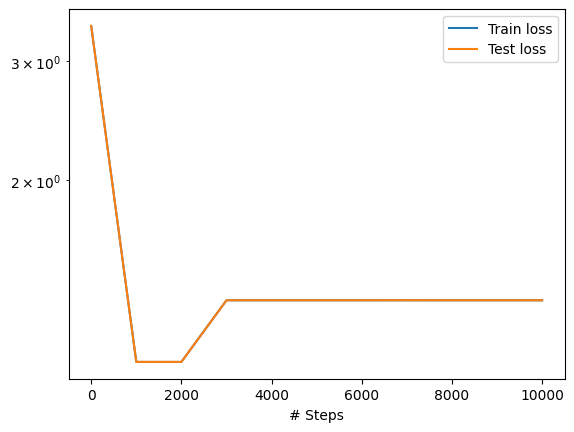

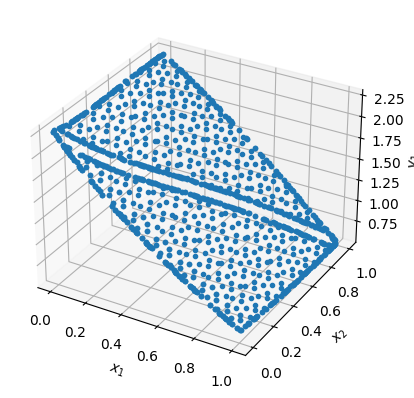

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


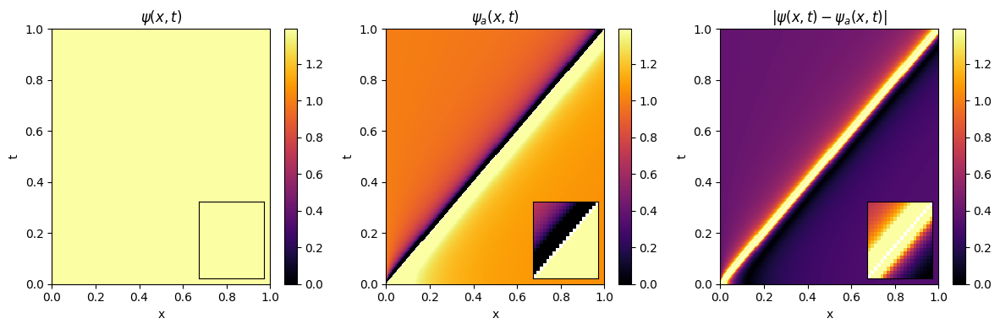

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


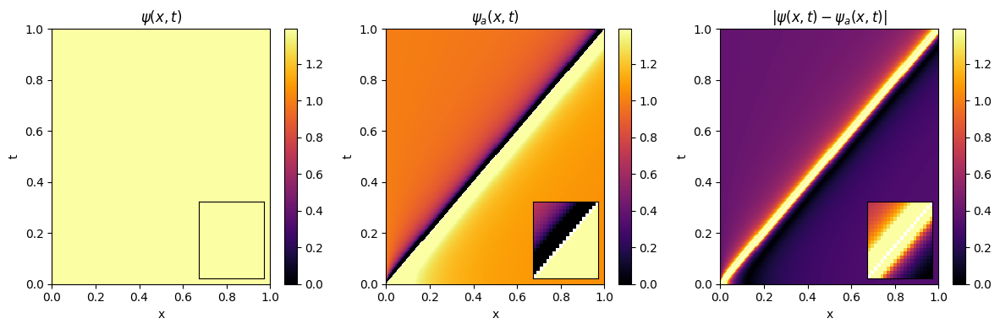

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


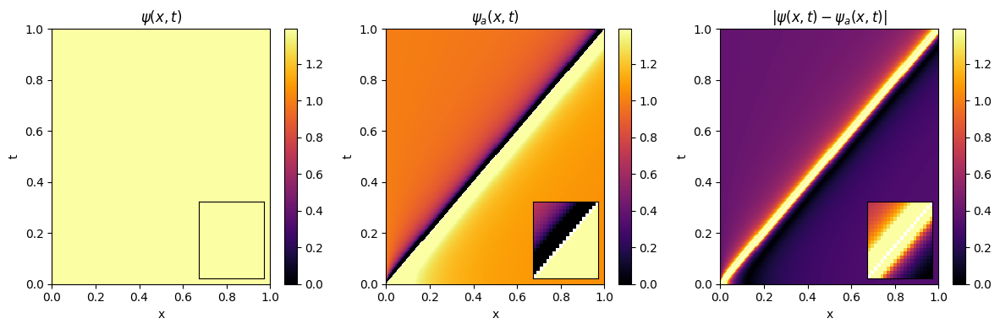

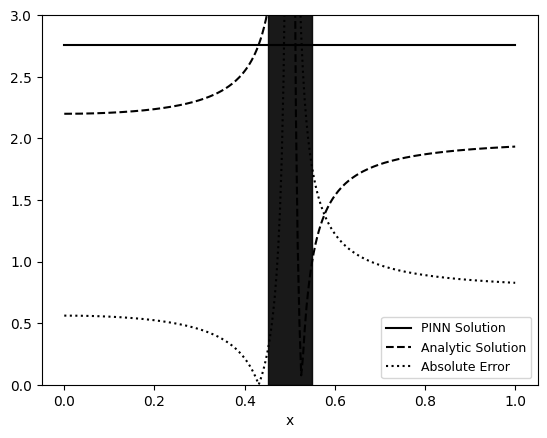

Compiling model...
Building feed-forward neural network...
'build' took 0.071163 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.543731 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.35e-01, 2.81e+00, 5.96e-01]    [2.35e-01, 2.81e+00, 5.96e-01]    []  
1000      [1.09e-02, 1.32e+00, 3.46e-03]    [1.09e-02, 1.32e+00, 3.46e-03]    []  
2000      [6.48e-03, 1.15e+00, 2.03e-02]    [6.48e-03, 1.15e+00, 2.03e-02]    []  
3000      [3.09e-02, 1.30e+00, 4.15e-02]    [3.09e-02, 1.30e+00, 4.15e-02]    []  
4000      [9.60e-11, 1.38e+00, 3.72e-11]    [9.60e-11, 1.38e+00, 3.72e-11]    []  
5000      [1.55e-10, 1.38e+00, 2.07e-11]    [1.55e-10, 1.38e+00, 2.07e-11]    []  
6000      [5.65e-10, 1.38e+00, 1.95e-10]    [5.65e-10, 1.38e+00, 1.95e-10]    []  
7000      [1.27e-10, 1.38e+00, 1.98e-11]    [1.27e-10, 1.38e+00, 1.98e-11]    []  
8000      [2.13e-14, 1.38e+00, 1.97e-16]    [2.13e-14, 1.38e+00, 1.97e-16]    []  
9000      [1.78e-14, 1.38e+00, 1.61e-16]    [1.78e-14, 1.38e+00, 1.61e-16]    []  
10000   

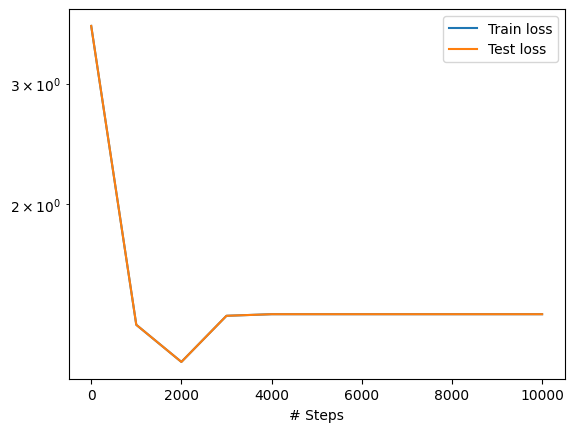

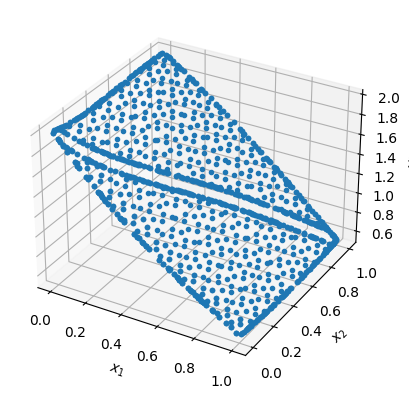

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


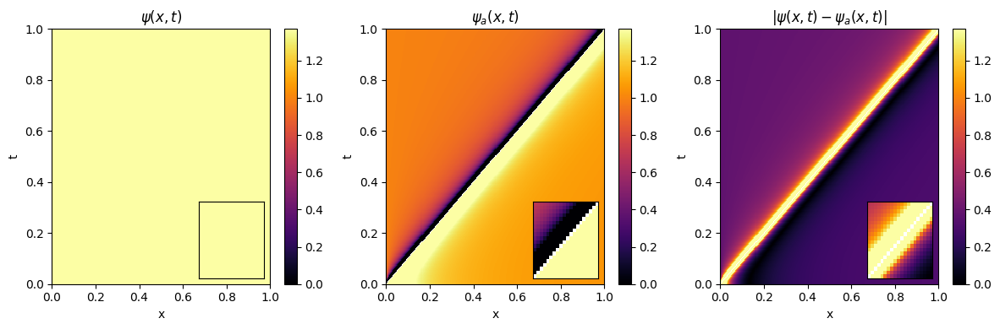

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


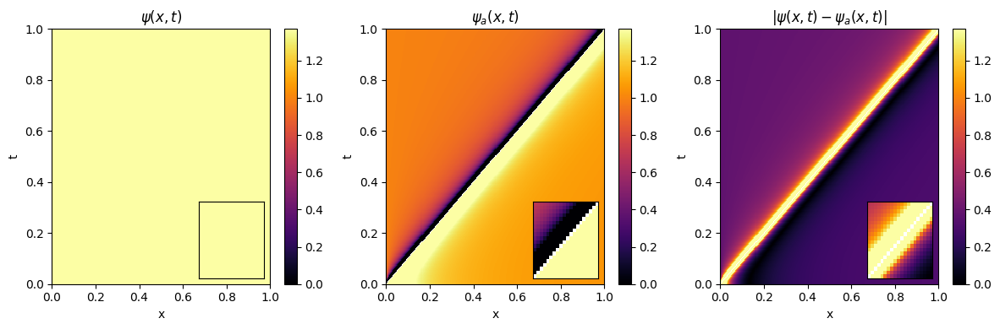

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


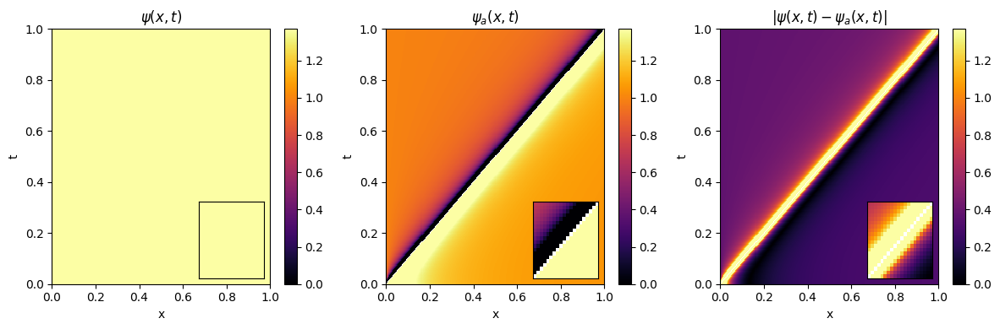

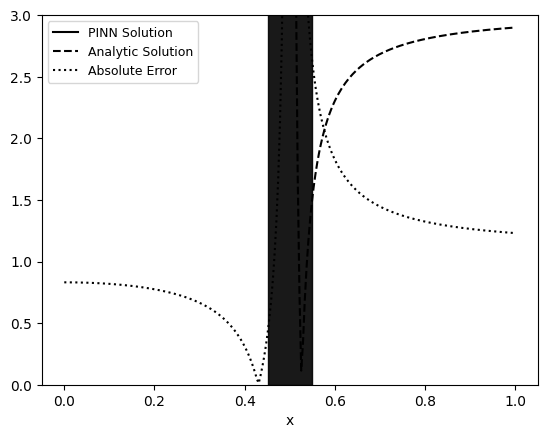

Average Behavior


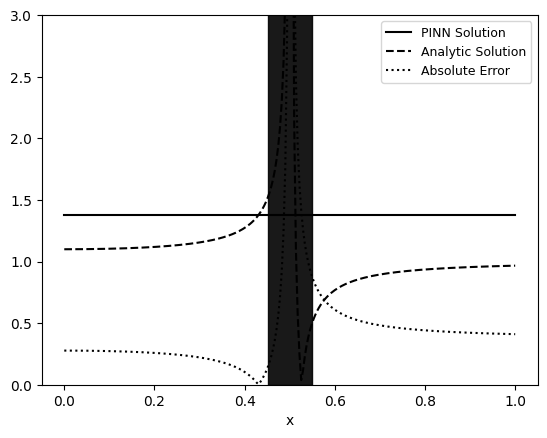

In [20]:

for i in range(sample_size):
    model_100_200 = generate_evolution_model(throat, 100, 200, 10, 3, lr, iterations);
    analytic_v_100_200 += plot_evolution_model(throat, model_100_200)[0];
    v_100_200 += plot_evolution_model(throat, model_100_200)[1];
    diff_100_200 += plot_evolution_model(throat, model_100_200)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_100_200, v_100_200, diff_100_200)
    
    
print("Average Behavior")
analytic_v_100_200 = analytic_v_100_200/sample_size
v_100_200 = v_100_200/sample_size 
diff_100_200 = diff_100_200/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_100_200, v_100_200, diff_100_200)


### Domain = 100, Boundary = 500

Compiling model...
Building feed-forward neural network...
'build' took 0.062826 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 2.057475 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.50e-01, 3.00e+00, 2.24e-01]    [2.50e-01, 3.00e+00, 2.24e-01]    []  
1000      [5.45e-03, 3.89e-01, 2.31e-04]    [5.45e-03, 3.89e-01, 2.31e-04]    []  
2000      [6.81e-09, 4.27e-01, 1.74e-09]    [6.81e-09, 4.27e-01, 1.74e-09]    []  
3000      [1.76e-10, 4.27e-01, 6.38e-11]    [1.76e-10, 4.27e-01, 6.38e-11]    []  
4000      [5.45e-11, 4.27e-01, 1.74e-11]    [5.45e-11, 4.27e-01, 1.74e-11]    []  
5000      [2.22e-11, 4.31e-01, 6.42e-12]    [2.22e-11, 4.31e-01, 6.42e-12]    []  
6000      [8.21e-12, 4.27e-01, 2.20e-12]    [8.21e-12, 4.27e-01, 2.20e-12]    []  
7000      [4.00e-12, 4.36e-01, 1.01e-12]    [4.00e-12, 4.36e-01, 1.01e-12]    []  
8000      [1.39e-12, 4.27e-01, 3.34e-13]    [1.39e-12, 4.27e-01, 3.34e-13]    []  
9000      [7.30e-13, 4.46e-01, 1.74e-13]    [7.30e-13, 4.46e-01, 1.74e-13]    []  
10000   

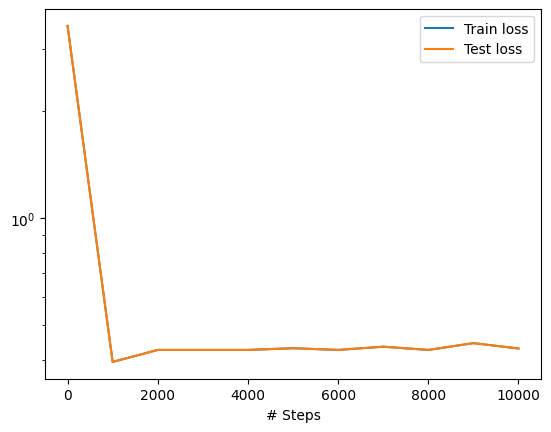

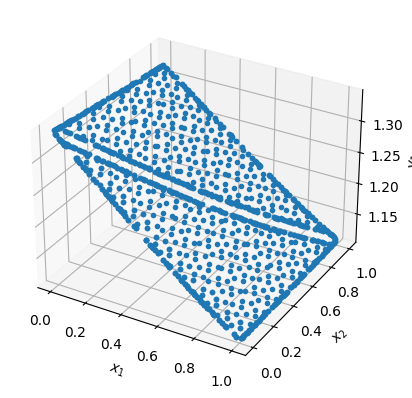

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


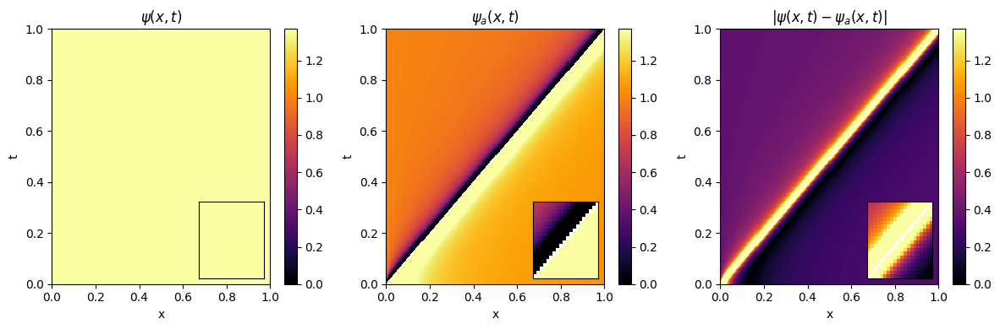

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


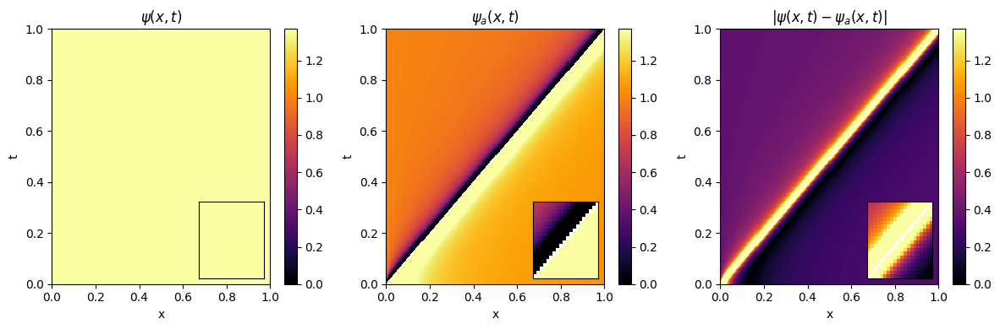

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


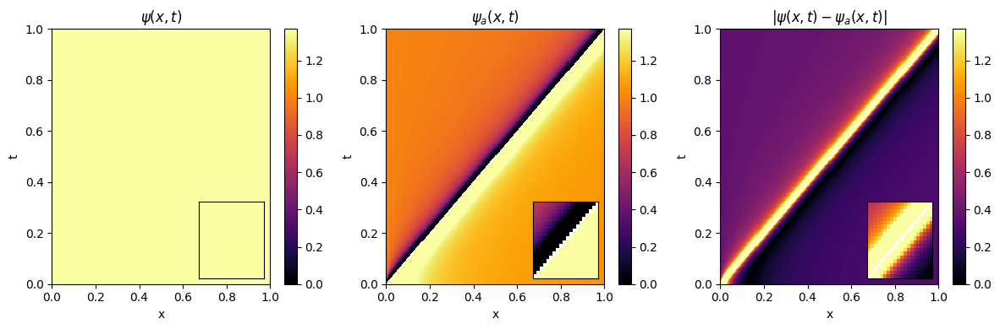

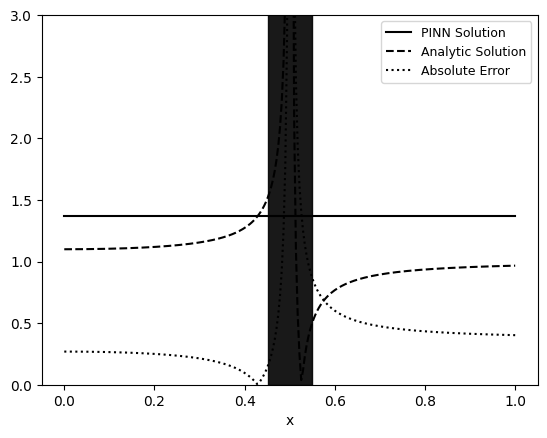

Compiling model...
Building feed-forward neural network...
'build' took 0.059476 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.298977 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [4.53e-03, 3.46e+00, 3.75e-02]    [4.53e-03, 3.46e+00, 3.75e-02]    []  
1000      [2.27e-07, 1.71e+00, 7.09e-08]    [2.27e-07, 1.71e+00, 7.09e-08]    []  
2000      [5.91e-03, 1.42e+00, 6.76e-02]    [5.91e-03, 1.42e+00, 6.76e-02]    []  
3000      [2.45e-10, 1.70e+00, 4.59e-11]    [2.45e-10, 1.70e+00, 4.59e-11]    []  
4000      [2.09e-10, 1.70e+00, 1.65e-11]    [2.09e-10, 1.70e+00, 1.65e-11]    []  
5000      [3.37e-10, 1.70e+00, 6.11e-11]    [3.37e-10, 1.70e+00, 6.11e-11]    []  
6000      [4.81e-12, 1.70e+00, 3.84e-13]    [4.81e-12, 1.70e+00, 3.84e-13]    []  
7000      [2.83e-20, 1.70e+00, 1.01e-19]    [2.83e-20, 1.70e+00, 1.01e-19]    []  
8000      [2.83e-20, 1.70e+00, 9.87e-20]    [2.83e-20, 1.70e+00, 9.87e-20]    []  
9000      [2.77e-20, 1.70e+00, 9.72e-20]    [2.77e-20, 1.70e+00, 9.72e-20]    []  
10000   

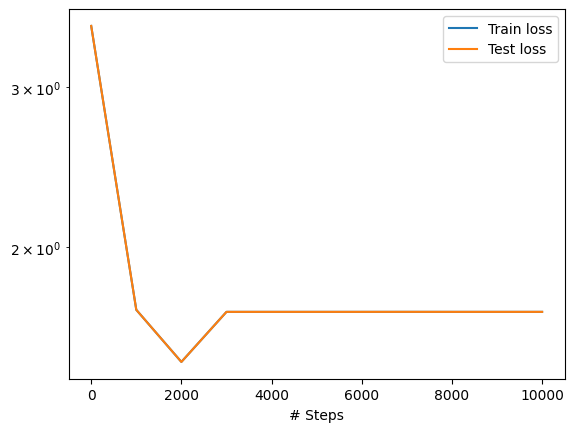

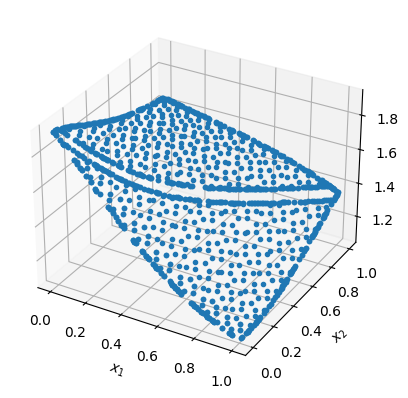

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


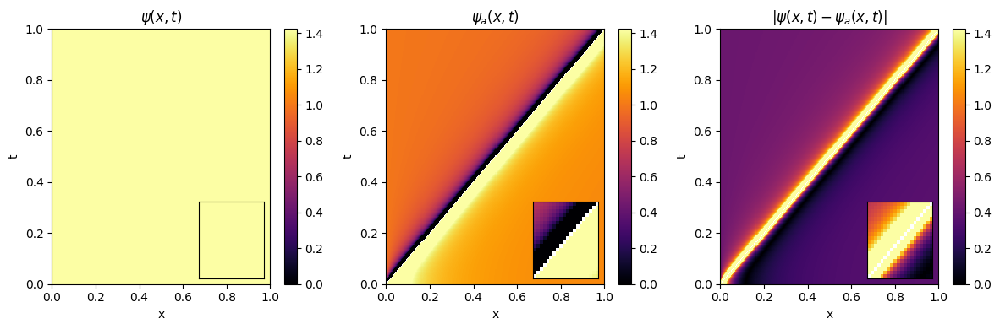

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


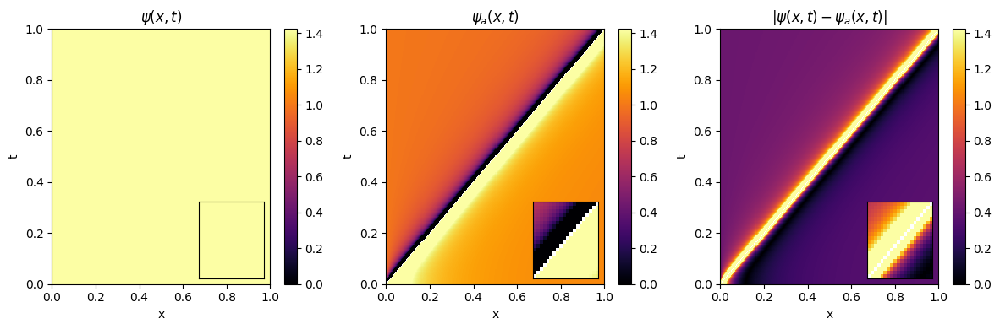

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


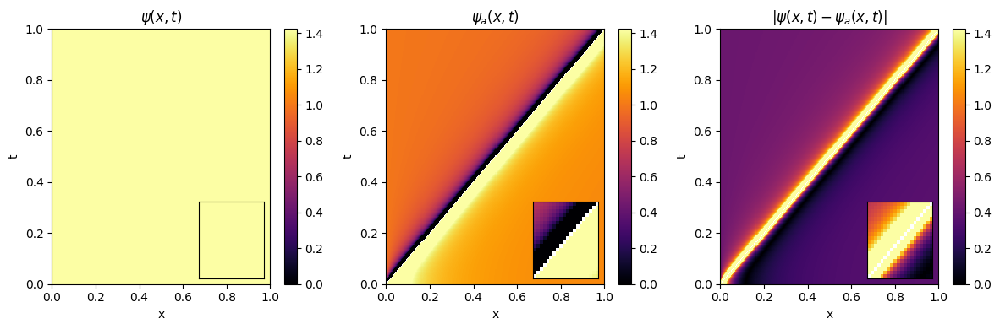

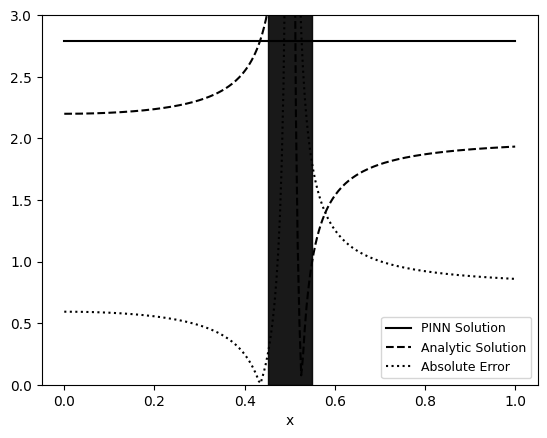

Compiling model...
Building feed-forward neural network...
'build' took 0.059108 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.848130 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [2.39e-01, 2.24e+00, 3.25e-01]    [2.39e-01, 2.24e+00, 3.25e-01]    []  
1000      [5.98e-03, 1.55e-01, 7.95e-03]    [5.98e-03, 1.55e-01, 7.95e-03]    []  
2000      [2.40e-04, 2.35e-01, 2.07e-02]    [2.40e-04, 2.35e-01, 2.07e-02]    []  
3000      [1.15e-09, 2.86e-01, 3.41e-11]    [1.15e-09, 2.86e-01, 3.41e-11]    []  
4000      [1.41e-09, 2.86e-01, 4.30e-11]    [1.41e-09, 2.86e-01, 4.30e-11]    []  
5000      [3.04e-09, 2.86e-01, 1.29e-10]    [3.04e-09, 2.86e-01, 1.29e-10]    []  
6000      [1.30e-12, 2.86e-01, 2.16e-14]    [1.30e-12, 2.86e-01, 2.16e-14]    []  
7000      [1.33e-12, 2.86e-01, 2.19e-14]    [1.33e-12, 2.86e-01, 2.19e-14]    []  
8000      [1.23e-12, 2.86e-01, 2.03e-14]    [1.23e-12, 2.86e-01, 2.03e-14]    []  
9000      [9.93e-13, 2.86e-01, 1.65e-14]    [9.93e-13, 2.86e-01, 1.65e-14]    []  
10000   

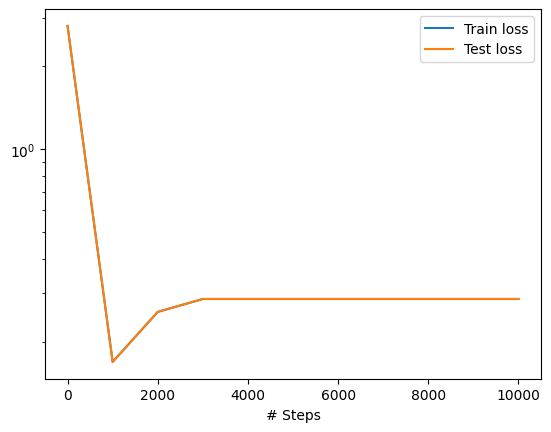

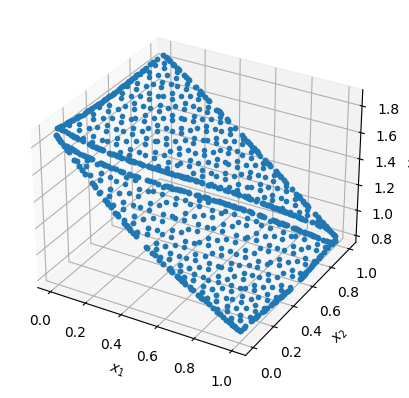

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


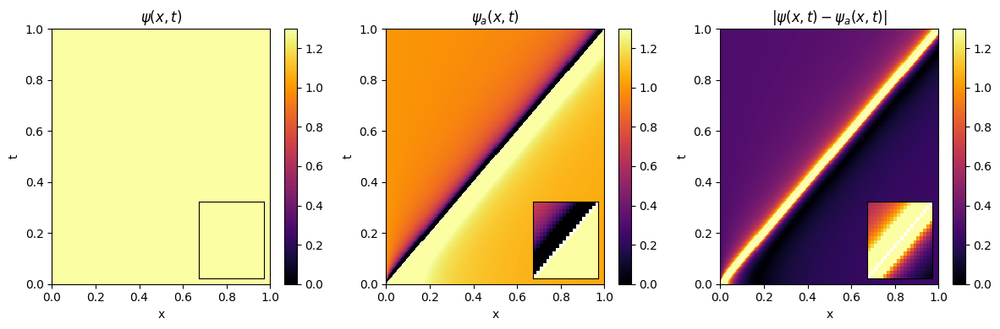

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


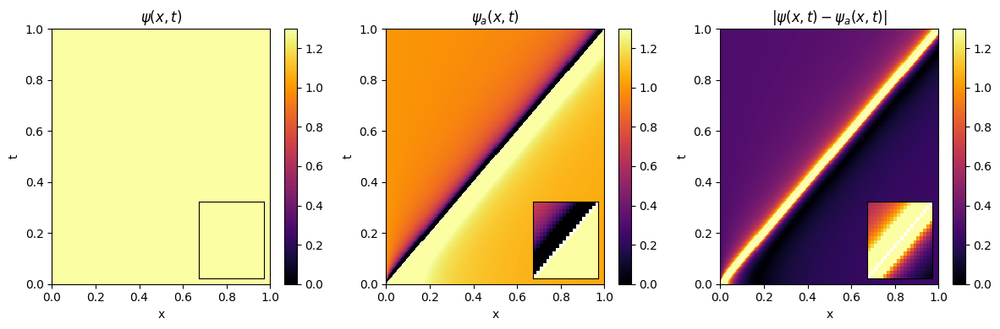

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


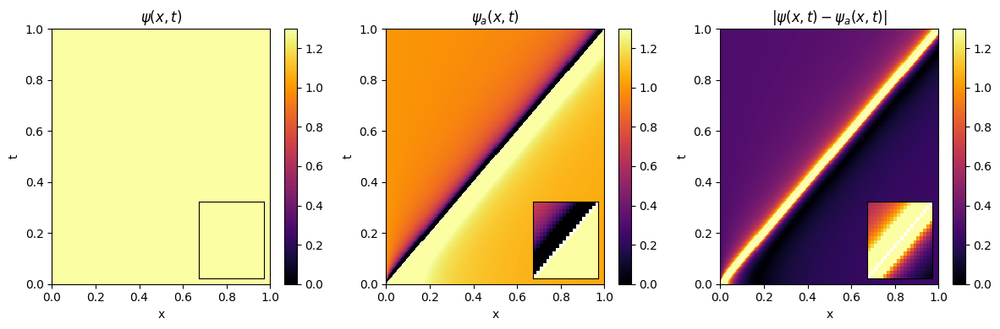

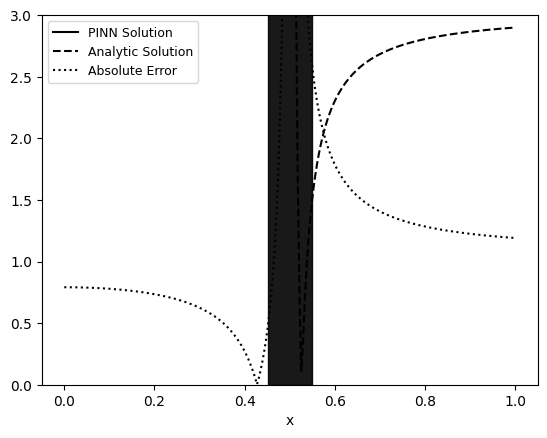

Average Behavior


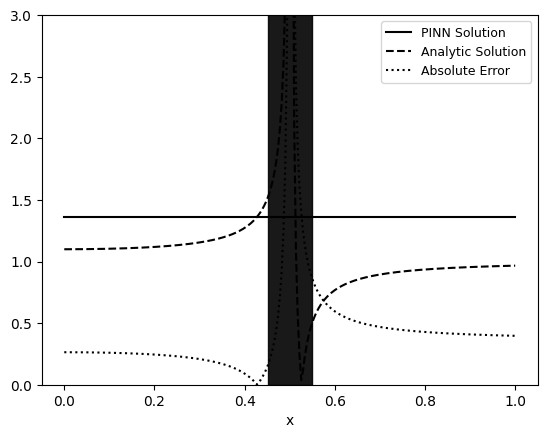

In [21]:

for i in range(sample_size):
    model_100_500 = generate_evolution_model(throat, 100, 500, 10, 3, lr, iterations);
    analytic_v_100_500 += plot_evolution_model(throat, model_100_500)[0];
    v_100_500 += plot_evolution_model(throat, model_100_500)[1];
    diff_100_500 += plot_evolution_model(throat, model_100_500)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_100_500, v_100_500, diff_100_500)
    
    
print("Average Behavior")
analytic_v_100_500 = analytic_v_100_500/sample_size
v_100_500 = v_100_500/sample_size 
diff_100_500 = diff_100_500/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_100_500, v_100_500, diff_100_500)


### Domain = 500, Boundary = 500

Compiling model...
Building feed-forward neural network...
'build' took 0.066281 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.516879 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [1.15e-02, 3.43e+00, 2.76e-01]    [1.15e-02, 3.43e+00, 2.76e-01]    []  
1000      [2.40e-02, 1.14e+00, 6.83e-02]    [2.40e-02, 1.14e+00, 6.83e-02]    []  
2000      [7.80e-07, 1.68e+00, 1.42e-07]    [7.80e-07, 1.68e+00, 1.42e-07]    []  
3000      [1.86e-12, 1.55e+00, 1.27e-14]    [1.86e-12, 1.55e+00, 1.27e-14]    []  
4000      [1.25e-12, 1.55e+00, 8.48e-15]    [1.25e-12, 1.55e+00, 8.48e-15]    []  
5000      [6.91e-13, 1.55e+00, 4.60e-15]    [6.91e-13, 1.55e+00, 4.60e-15]    []  
6000      [3.06e-13, 1.55e+00, 2.01e-15]    [3.06e-13, 1.55e+00, 2.01e-15]    []  
7000      [9.08e-14, 1.55e+00, 6.22e-16]    [9.08e-14, 1.55e+00, 6.22e-16]    []  
8000      [8.83e-15, 1.55e+00, 2.42e-16]    [8.83e-15, 1.55e+00, 2.42e-16]    []  
9000      [1.38e-14, 1.55e+00, 5.05e-16]    [1.38e-14, 1.55e+00, 5.05e-16]    []  
10000   

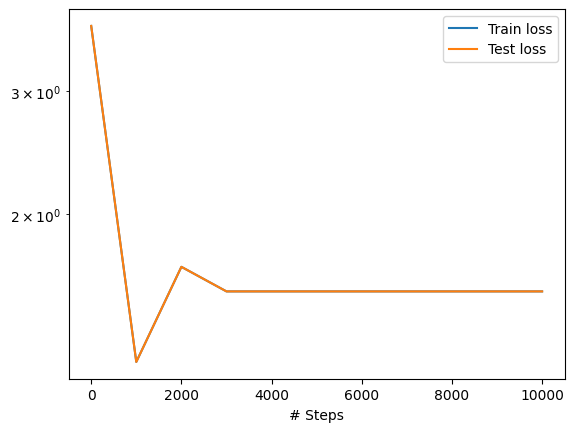

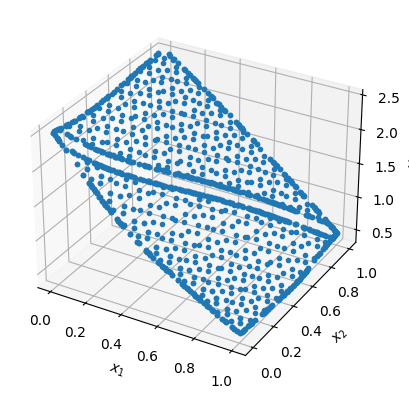

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


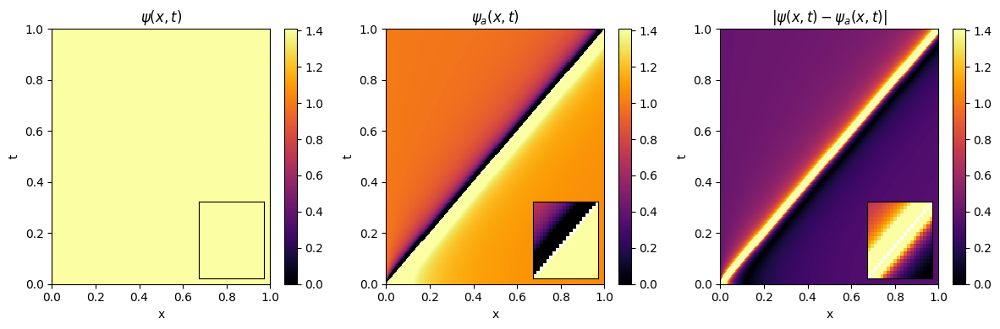

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


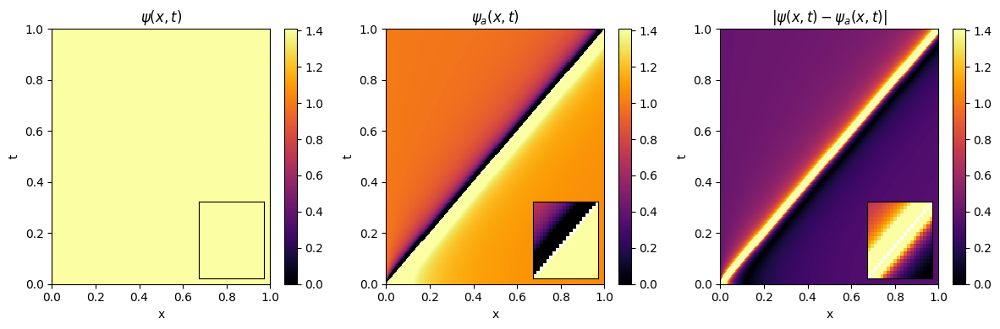

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


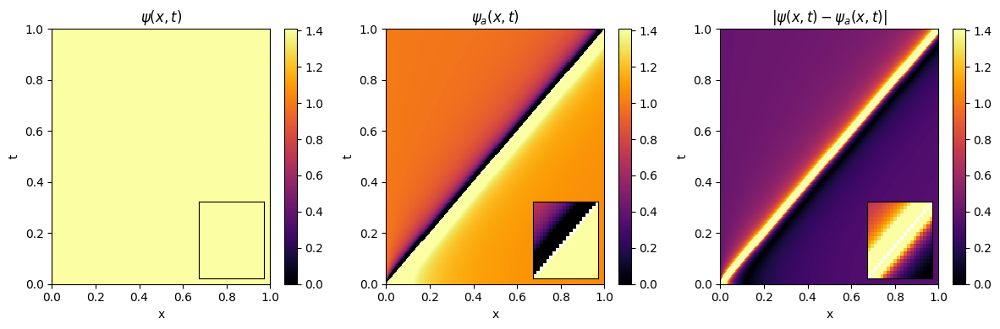

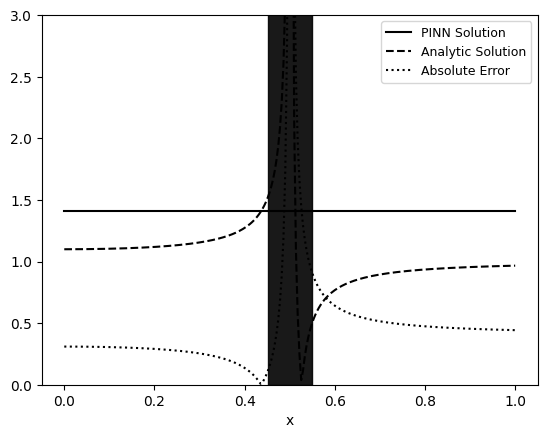

Compiling model...
Building feed-forward neural network...
'build' took 0.062072 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.390771 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [5.08e-02, 2.96e+00, 7.37e-03]    [5.08e-02, 2.96e+00, 7.37e-03]    []  
1000      [1.52e-02, 1.21e+00, 1.04e-02]    [1.52e-02, 1.21e+00, 1.04e-02]    []  
2000      [2.08e-02, 1.20e+00, 2.64e-02]    [2.08e-02, 1.20e+00, 2.64e-02]    []  
3000      [2.54e-03, 1.14e+00, 2.15e-02]    [2.54e-03, 1.14e+00, 2.15e-02]    []  
4000      [3.48e-03, 1.15e+00, 2.06e-02]    [3.48e-03, 1.15e+00, 2.06e-02]    []  
5000      [4.82e-04, 1.34e+00, 3.71e-02]    [4.82e-04, 1.34e+00, 3.71e-02]    []  
6000      [1.51e-08, 1.42e+00, 6.59e-10]    [1.51e-08, 1.42e+00, 6.59e-10]    []  
7000      [8.08e-12, 1.42e+00, 8.59e-13]    [8.08e-12, 1.42e+00, 8.59e-13]    []  
8000      [1.04e-11, 1.42e+00, 1.07e-12]    [1.04e-11, 1.42e+00, 1.07e-12]    []  
9000      [1.67e-11, 1.42e+00, 1.60e-12]    [1.67e-11, 1.42e+00, 1.60e-12]    []  
10000   

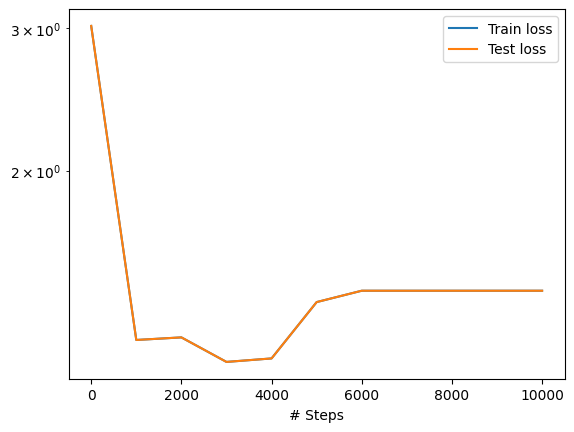

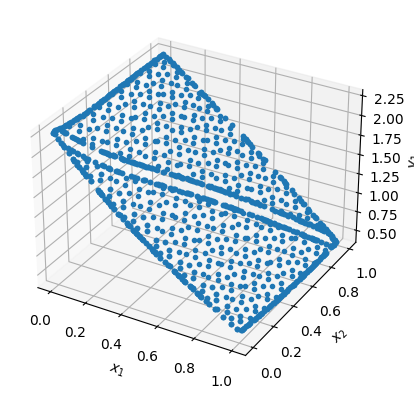

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


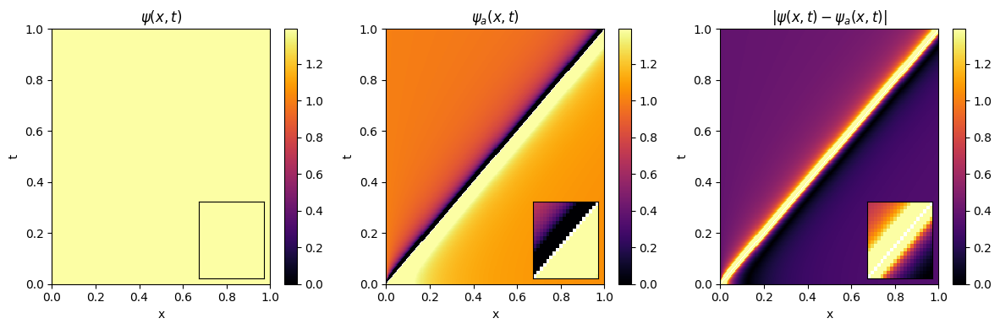

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


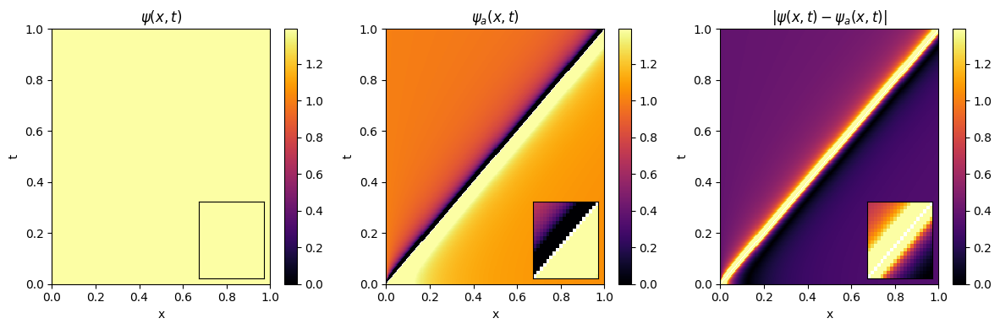

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


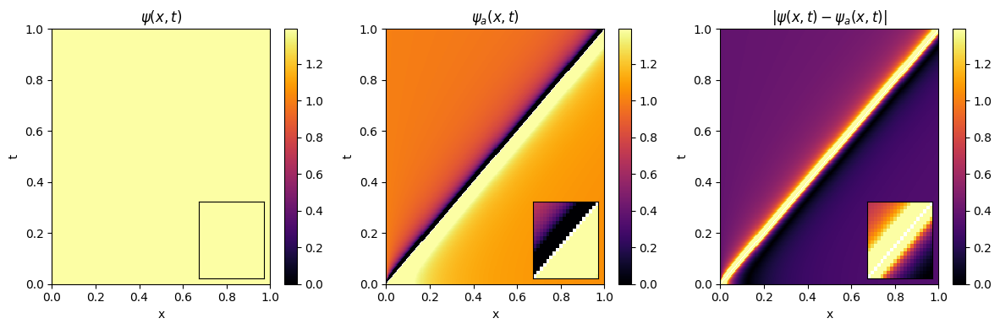

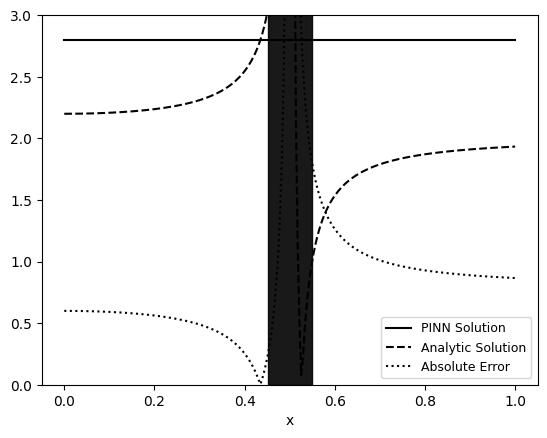

Compiling model...
Building feed-forward neural network...
'build' took 0.072506 s



C:\Users\Lyle\anaconda3\lib\site-packages\deepxde\nn\tensorflow_compat_v1\fnn.py:114: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  return tf.layers.dense(


'compile' took 1.691829 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [6.36e-04, 3.71e+00, 1.92e-02]    [6.36e-04, 3.71e+00, 1.92e-02]    []  
1000      [5.60e-02, 1.27e+00, 2.00e-02]    [5.60e-02, 1.27e+00, 2.00e-02]    []  
2000      [1.58e-10, 1.44e+00, 5.21e-10]    [1.58e-10, 1.44e+00, 5.21e-10]    []  
3000      [5.30e-11, 1.44e+00, 1.12e-10]    [5.30e-11, 1.44e+00, 1.12e-10]    []  
4000      [3.24e-11, 1.44e+00, 2.56e-11]    [3.24e-11, 1.44e+00, 2.56e-11]    []  
5000      [9.82e-10, 1.44e+00, 8.72e-10]    [9.82e-10, 1.44e+00, 8.72e-10]    []  
6000      [9.14e-10, 1.44e+00, 2.16e-10]    [9.14e-10, 1.44e+00, 2.16e-10]    []  
7000      [6.10e-09, 1.44e+00, 2.92e-09]    [6.10e-09, 1.44e+00, 2.92e-09]    []  
8000      [3.99e-09, 1.44e+00, 1.67e-09]    [3.99e-09, 1.44e+00, 1.67e-09]    []  
9000      [3.71e-09, 1.44e+00, 1.38e-09]    [3.71e-09, 1.44e+00, 1.38e-09]    []  
10000   

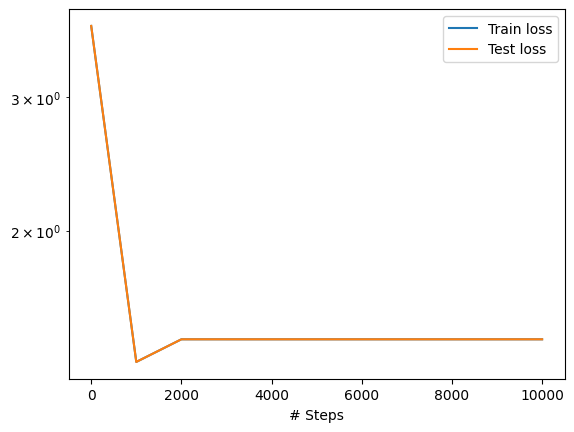

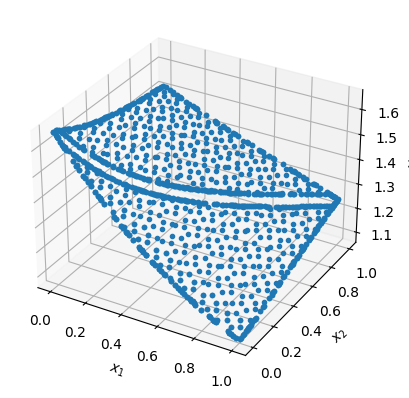

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


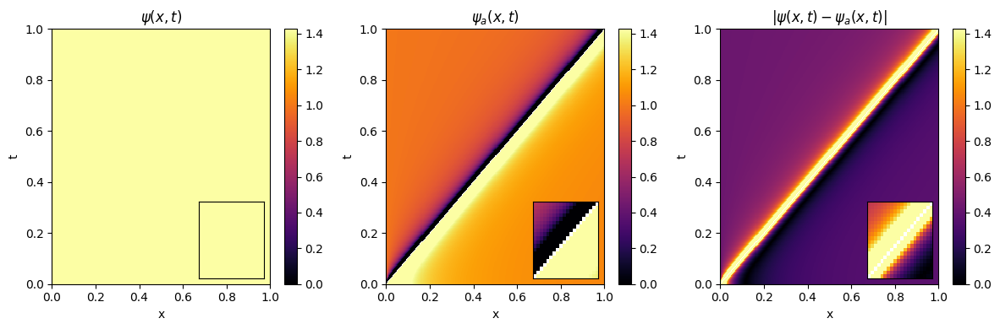

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


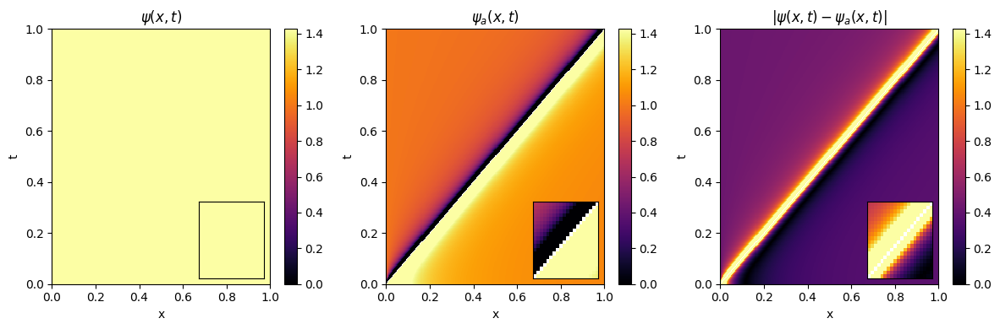

C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: divide by zero encountered in true_divide
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:8: RuntimeWarning: invalid value encountered in add
  return 1 - ((a/2)/(t-x)) + ((a/2)/(t+x))
C:\Users\Lyle\AppData\Local\Temp\ipykernel_15708\1579411219.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


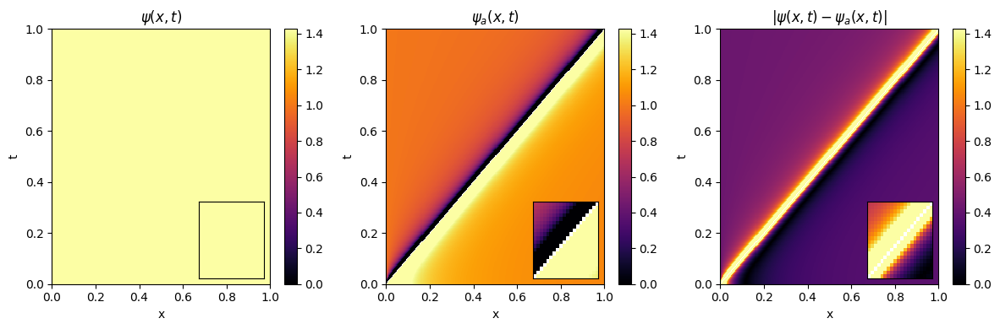

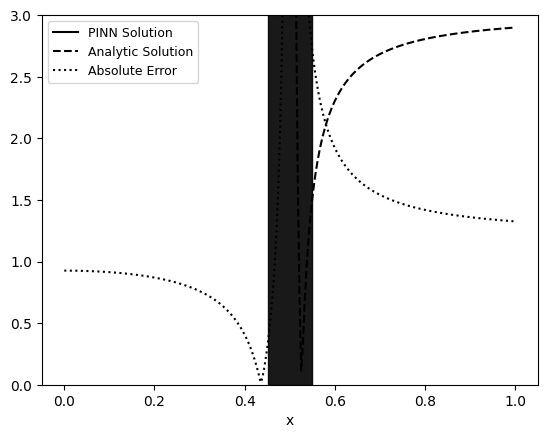

Average Behavior


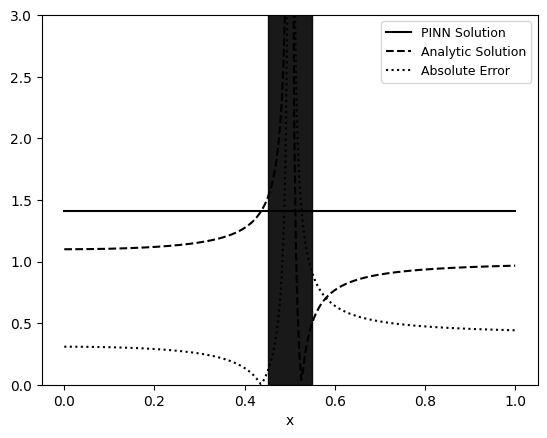

In [22]:

for i in range(sample_size):
    model_500_500 = generate_evolution_model(throat, 500, 500, 10, 3, lr, iterations);
    analytic_v_500_500 += plot_evolution_model(throat, model_500_500)[0];
    v_500_500 += plot_evolution_model(throat, model_500_500)[1];
    diff_500_500 += plot_evolution_model(throat, model_500_500)[2];
    plot_evolution_slice(throat, 0.5, analytic_v_500_500, v_500_500, diff_500_500)
    
    
print("Average Behavior")
analytic_v_500_500 = analytic_v_500_500/sample_size
v_500_500 = v_500_500/sample_size 
diff_500_500 = diff_500_500/sample_size 

plot_evolution_slice(throat, 0.5, analytic_v_500_500, v_500_500, diff_500_500)


### Effects of Training Points

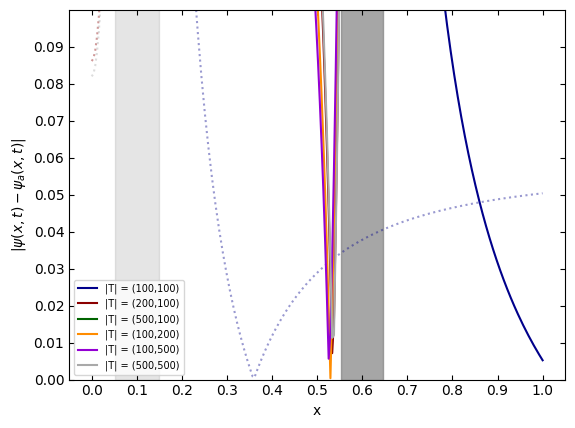

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
t = 0.1
a = 0.05
x = np.linspace(0, 1, len(diff_100_100))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.2, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']

ax.plot(x, np.where((abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))) < threshold,
                    (abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))), np.nan),
         linestyle=line_styles[2], alpha=0.4, color='darkblue')

ax.plot(x, np.where((abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))) < threshold,
                    (abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))), np.nan),
      linestyle=line_styles[2], alpha=0.4, color='darkred')

ax.plot(x, np.where((abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))) < threshold,
                    (abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))), np.nan),
       linestyle=line_styles[2], alpha=0.4, color='darkgreen')

ax.plot(x, np.where((abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))) < threshold,
                    (abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))), np.nan),
        linestyle=line_styles[2], alpha=0.4, color='darkorange')

ax.plot(x, np.where((abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))) < threshold,
                    (abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))), np.nan),
       linestyle=line_styles[2], alpha=0.4, color='darkviolet')

ax.plot(x, np.where((abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))) < threshold,
                    (abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))), np.nan),
        linestyle=line_styles[2], alpha=0.4, color='darkgrey')


t = 0.6



ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']

ax.plot(x, np.where((abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))) < threshold,
                    (abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))), np.nan),
        label="|T| = (100,100)", linestyle=line_styles[0], color='darkblue')

ax.plot(x, np.where((abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))) < threshold,
                    (abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))), np.nan),
        label="|T| = (200,100)", linestyle=line_styles[0], color='darkred')

ax.plot(x, np.where((abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))) < threshold,
                    (abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))), np.nan),
        label="|T| = (500,100)", linestyle=line_styles[0], color='darkgreen')

ax.plot(x, np.where((abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))) < threshold,
                    (abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))), np.nan),
        label="|T| = (100,200)", linestyle=line_styles[0], color='darkorange')

ax.plot(x, np.where((abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))) < threshold,
                    (abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))), np.nan),
        label="|T| = (100,500)", linestyle=line_styles[0], color='darkviolet')

ax.plot(x, np.where((abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))) < threshold,
                    (abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))), np.nan),
        label="|T| = (500,500)", linestyle=line_styles[0], color='darkgray')




# Set the title and labels
# ax.set_title("PINN-excised solutions")
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.1)

# # Set ticker on the axis ticks
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_yticks(np.arange(0, 1.1, 0.1))



# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.1, 0.01))

# Add tick marks on top and right axes
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True)


# Add a legend
legend = ax.legend(fontsize=7)

# Show the plot
plt.show()


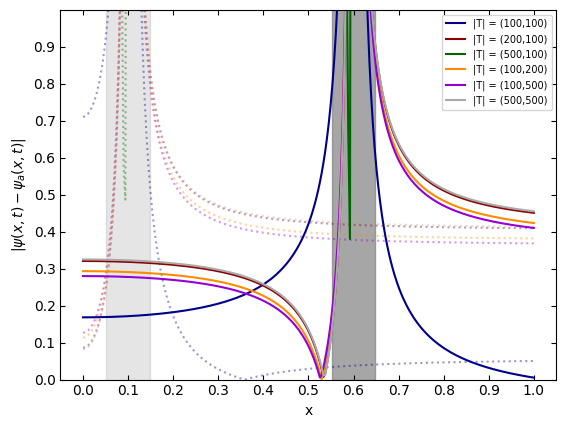

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
t = 0.1
a = 0.05
x = np.linspace(0, 1, len(diff_100_100))

# Set the threshold value
threshold = 50

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.2, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']

ax.plot(x, np.where((abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))) < threshold,
                    (abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))), np.nan),
         linestyle=line_styles[2], alpha=0.4, color='darkblue')

ax.plot(x, np.where((abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))) < threshold,
                    (abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))), np.nan),
      linestyle=line_styles[2], alpha=0.4, color='darkred')

ax.plot(x, np.where((abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))) < threshold,
                    (abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))), np.nan),
       linestyle=line_styles[2], alpha=0.4, color='darkgreen')

ax.plot(x, np.where((abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))) < threshold,
                    (abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))), np.nan),
        linestyle=line_styles[2], alpha=0.4, color='darkorange')

ax.plot(x, np.where((abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))) < threshold,
                    (abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))), np.nan),
       linestyle=line_styles[2], alpha=0.4, color='darkviolet')

ax.plot(x, np.where((abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))) < threshold,
                    (abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))), np.nan),
        linestyle=line_styles[2], alpha=0.4, color='darkgrey')


t = 0.6



ax.fill_between(x, 0, 10, where=(x >= t - a) & (x <= t + a), alpha=0.7, color='gray')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color='black')

t = round(t * 255)

# Set line styles
line_styles = ['-', '--', ':', '-.', '-', '--']

ax.plot(x, np.where((abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))) < threshold,
                    (abs((v_100_100.T[:, t] - analytic_v_100_100[:, t]))), np.nan),
        label="|T| = (100,100)", linestyle=line_styles[0], color='darkblue')

ax.plot(x, np.where((abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))) < threshold,
                    (abs((v_200_100.T[:, t] - analytic_v_200_100[:, t]))), np.nan),
        label="|T| = (200,100)", linestyle=line_styles[0], color='darkred')

ax.plot(x, np.where((abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))) < threshold,
                    (abs((v_500_100.T[:, t] - analytic_v_500_100[:, t]))), np.nan),
        label="|T| = (500,100)", linestyle=line_styles[0], color='darkgreen')

ax.plot(x, np.where((abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))) < threshold,
                    (abs((v_100_200.T[:, t] - analytic_v_100_200[:, t]))), np.nan),
        label="|T| = (100,200)", linestyle=line_styles[0], color='darkorange')

ax.plot(x, np.where((abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))) < threshold,
                    (abs((v_100_500.T[:, t] - analytic_v_100_500[:, t]))), np.nan),
        label="|T| = (100,500)", linestyle=line_styles[0], color='darkviolet')

ax.plot(x, np.where((abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))) < threshold,
                    (abs((v_500_500.T[:, t] - analytic_v_500_500[:, t]))), np.nan),
        label="|T| = (500,500)", linestyle=line_styles[0], color='darkgray')




# Set the title and labels
# ax.set_title("PINN-excised solutions")
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 1)

# # Set ticker on the axis ticks
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_yticks(np.arange(0, 1.1, 0.1))



# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 1, 0.1))

# Add tick marks on top and right axes
ax.tick_params(axis='both', direction='in', which='both', top=True, right=True)


# Add a legend
legend = ax.legend(fontsize=7)

# Show the plot
plt.show()


## Optimized Hyperparameters (3 subplots)

### Vary t, Fix a, N=0 (1 subplot, 2D trio)

In [ ]:

for i in range(sample_size):
    model_t = generate_evolution_model(0.01, 500, 500, 10, 3, lr, 20000)
    analytic_v_t, v_t, diff_t = plot_evolution_model_sliced(0.01, model_t)
    plot_evolution_slice(0.01, 0.5, analytic_v_t, v_t, diff_t)
    
    # Define the x-axis values
    x = np.linspace(0, 1, len(diff_t))
    a = 0.01

    # Create a Figure and Axes
    fig, ax = plt.subplots()

    # Set the threshold value
    threshold = 50

    # Plot for t = 0.2
    t = 0.2
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkred')
    t = round(t * 255)
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'r-', label="t = 0.2")

    # Plot for t = 0.5
    t = 0.5
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkgreen')
    t = round(t * 255)
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'g-', label="t = 0.5")

    # Plot for t = 0.8
    t = 0.8
    ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkblue')
    t = round(t * 255)
    ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                        (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
            'b-', label="t = 0.8")

    # Set the title and labels
    ax.set_xlabel("x")
    ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
    ax.set_ylim(0, 0.4)

    # Set ticker on the axis ticks
    ax.set_xticks(np.arange(0, 1.1, 0.1))
    ax.set_yticks(np.arange(0, 0.4, 0.05))

    # Add a legend
    legend = ax.legend(fontsize=9)


    # Set the plot title
    ax.set_title("Absolute error of evolution data at different time slice", fontsize=11)


    # Show the plot
    plt.show()



In [ ]:
model_t = generate_evolution_model(0.01, 500, 500, 10, 3, lr, 20000)

In [ ]:
analytic_v_t, v_t, diff_t = plot_evolution_model_sliced(0.01, model_t)

In [ ]:
plot_evolution_slice(0.01, 0.5, analytic_v_t, v_t, diff_t)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
x = np.linspace(0, 1, len(diff_t))
a = 0.01

# Create a Figure and Axes
fig, ax = plt.subplots()

# Set the threshold value
threshold = 50

# Plot for t = 0.2
t = 0.2
ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkred')
t = round(t * 255)
ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                    (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
        'r-', label="t = 0.2")

# Plot for t = 0.5
t = 0.5
ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkgreen')
t = round(t * 255)
ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                    (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
        'g-', label="t = 0.5")

# Plot for t = 0.8
t = 0.8
ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='darkblue')
t = round(t * 255)
ax.plot(x, np.where((abs((v_t.T[:, t] - analytic_v_t[:, t]))) < threshold,
                    (abs((v_t.T[:, t] - analytic_v_t[:, t]))), np.nan),
        'b-', label="t = 0.8")

# Set the title and labels
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.4)

# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.4, 0.05))

# Add a legend
legend = ax.legend(fontsize=9)


# Set the plot title
ax.set_title("Absolute error of evolution data at different time slice", fontsize=11)


# Show the plot
plt.show()


### Vary a, Fix t, N=0 (1 subplot, 2D trio)

In [ ]:
model_001 = generate_evolution_model(0.001, 500, 500, 10, 3, 1e-3, 10000)

In [ ]:
analytic_v_001, v_001, diff_001 = plot_evolution_model(0.001, model_001)

In [ ]:
plot_evolution_slice(0.001, 0.5, analytic_v_001, v_001, diff_001)

In [ ]:
model_01 = generate_evolution_model(0.01, 500, 500, 10, 3, 1e-3, 10000)

In [ ]:
analytic_v_01, v_01, diff_01 = plot_evolution_model(0.01, model_01)

In [ ]:
plot_evolution_slice(0.01, 0.5, analytic_v_01, v_01, diff_01)

In [ ]:
model_1 = generate_evolution_model(0.1, 500, 500, 10, 3, 1e-3, 10000)

In [ ]:
analytic_v_1, v_1, diff_1 = plot_evolution_model(0.1, model_1)

In [ ]:
plot_evolution_slice(0.1, 0.5, analytic_v_1, v_1, diff_1)

In [ ]:
# Define the x-axis values
x = np.linspace(0, 1, len(diff_001))

t = 0.5


# Set the threshold value
threshold = 50

a = 0.001

# Create a Figure and Axes
fig, ax = plt.subplots()

ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='red')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color = 'green')

t = round(t * 255)

# ax.plot(x, abs(v_t.T[:, t]), 'r-', label="PINN Solution")
# ax.plot(x, abs(analytic_v_t[:, t]), 'r--', label="Analytic Solution")
ax.plot(x, np.where((abs((v_001.T[:, t] - analytic_v_001[:, t]))) < threshold,
                    (abs((v_001.T[:, t] - analytic_v_001[:, t]))), np.nan),
        'r:', label="a = 0.001")



a = 0.01



# Set the threshold value
threshold = 50

# Create a Figure and Axes


ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='green')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color = 'green')



# ax.plot(x, abs(v_t.T[:, t]), 'g-', label="PINN Solution")
# ax.plot(x, abs(analytic_v_t[:, t]), 'g--', label="Analytic Solution")
ax.plot(x, np.where((abs((v_01.T[:, t] - analytic_v_01[:, t]))) < threshold,
                    (abs((v_01.T[:, t] - analytic_v_01[:, t]))), np.nan),
        'g:', label="a = 0.01")







a = 0.1


# Set the threshold value
threshold = 50

# Create a Figure and Axes

ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='blue')
# ax.text(t, .5, "Excised Region", ha='center', va='center', color = 'blue')


# ax.plot(x, abs(v_t.T[:, t]), 'b-', label="PINN Solution")
# ax.plot(x, abs(analytic_v_t[:, t]), 'b--', label="Analytic Solution")
ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        'b:', label="a = 0.1")





# Set the title and labels
# ax.set_title("PINN-excised solutions")
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.5)
# Add a legend

legend = ax.legend(fontsize=7)

# Show the plot
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Define the x-axis values
x = np.linspace(0, 1, len(diff_001))
t = 0.5

# Create a Figure and Axes
fig, ax = plt.subplots()

# Set the threshold value
threshold = 50

# Plot for a = 0.001
a = 0.001
ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='red')
t = round(t * 255)
ax.plot(x, np.where((abs((v_001.T[:, t] - analytic_v_001[:, t]))) < threshold,
                    (abs((v_001.T[:, t] - analytic_v_001[:, t]))), np.nan),
        'r:', label="a = 0.001")

# Plot for a = 0.01
a = 0.01
ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='green')
ax.plot(x, np.where((abs((v_01.T[:, t] - analytic_v_01[:, t]))) < threshold,
                    (abs((v_01.T[:, t] - analytic_v_01[:, t]))), np.nan),
        'g:', label="a = 0.01")

# Plot for a = 0.1
a = 0.1
ax.fill_between(x, 0, 5, where=(x >= t - a) & (x <= t + a), alpha=0.3, color='blue')
ax.plot(x, np.where((abs((v_1.T[:, t] - analytic_v_1[:, t]))) < threshold,
                    (abs((v_1.T[:, t] - analytic_v_1[:, t]))), np.nan),
        'b:', label="a = 0.1")

# Set the title and labels
ax.set_xlabel("x")
ax.set_ylabel(r'$|\psi(x,t)-\psi_{a}(x,t)|$')
ax.set_ylim(0, 0.5)

# Set ticker on the axis ticks
ax.set_xticks(np.arange(0, 1.1, 0.1))
ax.set_yticks(np.arange(0, 0.6, 0.1))

# Add a legend
legend = ax.legend(fontsize=7)

# Show the plot
plt.show()


### Vary N, Fix t and a (1 subplot, 2D trio)